<div style="padding: 20px;
            background-color: #2575fc;
            font-family: Arial, sans-serif;
            color: #ffffff;
            font-size: 300%;
            text-align: center;
            border-radius: 20px 0px;
            box-shadow: 0 4px 15px rgba(0, 0, 0, 0.2);">
    Telecom Customer Churn Prediction 📊📉
</div>

<div style="font-family: Arial, sans-serif;
            color: #000000;
            font-size: 175%;
            text-align: center;
            margin-top: 20px;">
</div>


The telecom customer churn prediction project aims to develop a predictive model that can accurately identify customers who are likely to churn in the telecommunications industry. Churn, in this context, refers to the situation where customers terminate their subscriptions or switch to a competitors telecom service. By predicting churn in advance, telecom companies can proactively implement strategies to retain at-risk customers and minimize revenue loss.

### Importing Necessary Libraries

In [15]:
#Importing necessary Libraries
import numpy as np 
import pandas as pd 
from math import * 
import matplotlib.pyplot as plt 
from PIL import Image
import seaborn as sns 
import itertools
import io
import plotly.offline as py 
py.init_notebook_mode(connected=True) 
import plotly.graph_objs as go 
from plotly.subplots import make_subplots
import plotly.figure_factory as ff 
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
import pickle 

# Exploratory Data Analysis(EDA)

In [16]:
#Data collection
train_data = pd.read_csv("C:/Users/micro/Downloads/churn-bigml-80.csv")

test_data = pd.read_csv("C:/Users/micro/Downloads/churn-bigml-20.csv")


### train Data Overview 

In [17]:
train_data.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [18]:
test_data.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [19]:
try:
    data = pd.concat([train_data, test_data], ignore_index=True)
    print("Merged Dataset:")
    print(data)
except NameError:
    print("The dataframes train and/or test are not defined. Please ensure the previous code to load the dataframes has been executed successfully.")
except Exception as e:
    print(f"An error occurred during merging: {e}")

Merged Dataset:
     State  Account length  Area code International plan Voice mail plan  \
0       KS             128        415                 No             Yes   
1       OH             107        415                 No             Yes   
2       NJ             137        415                 No              No   
3       OH              84        408                Yes              No   
4       OK              75        415                Yes              No   
...    ...             ...        ...                ...             ...   
3328    WI             114        415                 No             Yes   
3329    AL             106        408                 No             Yes   
3330    VT              60        415                 No              No   
3331    WV             159        415                 No              No   
3332    CT             184        510                Yes              No   

      Number vmail messages  Total day minutes  Total day calls  \
0   

In [20]:
import pandas as pd
from IPython.display import FileLink

# Supposons que df est votre DataFrame
data.to_excel('data.xlsx', index=False)

# Créer un lien pour télécharger le fichier
FileLink('data.xlsx')


c:\Users\micro\Downloads\deploy-ml-model-flask-master\deploy-ml-model-flask-master\data.xlsx

### Dataset Attributes and Definitions:
1. **State**: The U.S. state where the customer resides, represented as an abbreviation.

2. **Account length**: The duration of the customer's account with the service provider, measured in days.

3. **Area code**: The area code associated with the customer’s phone number.

4. **International plan**: Indicates whether the customer has an international calling plan (e.g., "Yes" or "No").

5. **Voice mail plan**: Indicates whether the customer has a voicemail plan (e.g., "Yes" or "No").

6. **Number vmail messages**: The number of voicemail messages the customer has received.

7. **Total day minutes**: The total number of minutes the customer spent on calls during the day.

8. **Total day calls**: The total number of calls the customer made during the day.

9. **Total day charge**: The total charges incurred for daytime calls, calculated based on the minutes used.

10. **Total eve minutes**: The total number of minutes the customer spent on calls during the evening.

11. **Total eve calls**: The total number of calls the customer made during the evening.

12. **Total eve charge**: The total charges incurred for evening calls, calculated based on the minutes used.

13. **Total night minutes**: The total number of minutes the customer spent on calls during the night.

14. **Total night calls**: The total number of calls the customer made during the night.

15. **Total night charge**: The total charges incurred for nighttime calls, calculated based on the minutes used.

16. **Total intl minutes**: The total number of minutes the customer spent on international calls.

17. **Total intl calls**: The total number of international calls the customer made.

18. **Total intl charge**: The total charges incurred for international calls, calculated based on the minutes used.

19. **Customer service calls**: The total number of calls the customer made to customer service.

20. **Churn**: The target variable indicating whether the customer has churned (e.g., `True` for churned, `False` for retained).

In [21]:
# A clear vision about the dataset with the neumarical values
data.shape

(3333, 20)

In [22]:
train_data.shape

(2666, 20)

In [23]:
test_data.shape

(667, 20)

# Data Understanding 

In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account length          3333 non-null   int64  
 2   Area code               3333 non-null   int64  
 3   International plan      3333 non-null   object 
 4   Voice mail plan         3333 non-null   object 
 5   Number vmail messages   3333 non-null   int64  
 6   Total day minutes       3333 non-null   float64
 7   Total day calls         3333 non-null   int64  
 8   Total day charge        3333 non-null   float64
 9   Total eve minutes       3333 non-null   float64
 10  Total eve calls         3333 non-null   int64  
 11  Total eve charge        3333 non-null   float64
 12  Total night minutes     3333 non-null   float64
 13  Total night calls       3333 non-null   int64  
 14  Total night charge      3333 non-null   

In [25]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Account length,3333.0,101.064806,39.822106,1.00,74.00,101.00,127.00,243.00
Area code,3333.0,437.182418,42.371290,408.00,408.00,415.00,510.00,510.00
Number vmail messages,3333.0,8.099010,13.688365,0.00,0.00,0.00,20.00,51.00
Total day minutes,3333.0,179.775098,54.467389,0.00,143.70,179.40,216.40,350.80
Total day calls,3333.0,100.435644,20.069084,0.00,87.00,101.00,114.00,165.00
Total day charge,3333.0,30.562307,9.259435,0.00,24.43,30.50,36.79,59.64
Total eve minutes,3333.0,200.980348,50.713844,0.00,166.60,201.40,235.30,363.70
Total eve calls,3333.0,100.114311,19.922625,0.00,87.00,100.00,114.00,170.00
Total eve charge,3333.0,17.083540,4.310668,0.00,14.16,17.12,20.00,30.91
Total night minutes,3333.0,200.872037,50.573847,23.20,167.00,201.20,235.30,395.00


In [26]:
data.dtypes

State                      object
Account length              int64
Area code                   int64
International plan         object
Voice mail plan            object
Number vmail messages       int64
Total day minutes         float64
Total day calls             int64
Total day charge          float64
Total eve minutes         float64
Total eve calls             int64
Total eve charge          float64
Total night minutes       float64
Total night calls           int64
Total night charge        float64
Total intl minutes        float64
Total intl calls            int64
Total intl charge         float64
Customer service calls      int64
Churn                        bool
dtype: object

<Axes: ylabel='count'>

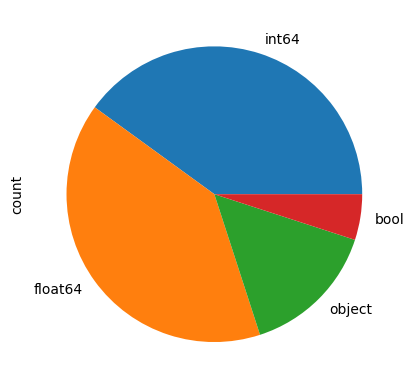

In [27]:
#3.Visualisation
#statistique sur le nombre de chaque type des colonnes
data.dtypes.value_counts().plot.pie()

In [28]:
data.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [29]:
def dataoverview(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(df.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())

In [30]:
dataoverview(data, "A Overview about the train dataset")

A Overview about the train dataset:

Rows: 3333

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                       51
Account length             212
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       46
Total day minutes         1667
Total day calls            119
Total day charge          1667
Total eve minutes         1611
Total eve calls            123
Total eve charge          1440
Total night minutes       1591
Total night calls          120
Total night charge         933
Total intl minutes        

## Analyze the dataset

In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

def analyse_data(df):
    # Analyse des variables numériques
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    distribution_results = []

    for column in numeric_columns:
        # Histogramme et courbe de densité
        plt.figure(figsize=(10, 5))
        sns.histplot(data[column], kde=True)
        plt.title(f'Distribution de {column}')
        plt.xlabel(column)
        plt.ylabel('Fréquence')
        plt.show()

        # Test de normalité (Shapiro-Wilk)
        stat, p_value = stats.shapiro(data[column])
        distribution_results.append({
            'Variable': column,
            'Shapiro-Wilk Statistic': stat,
            'p-value': p_value,
            'Normality': 'Normal' if p_value > 0.05 else 'Non-Normal'
        })

    # Création d'un DataFrame pour les résultats de distribution
    distribution_df = pd.DataFrame(distribution_results)
    print("\nTableau des résultats de l'analyse des variables numériques :")
    print(distribution_df)

    # Analyse des variables catégorielles
    categorical_columns = data.select_dtypes(include=['object', 'category']).columns
    categorical_results = []

    for column in categorical_columns:
        unique_values = data[column].nunique()
        recommendation = "Utiliser le test du Chi-carré pour comparer les proportions." if unique_values == 2 else "Utiliser le test du Chi-carré ou la régression logistique pour plus de modalités."
        categorical_results.append({
            'Variable Catégorielle': column,
            'Nombre de Modalités': unique_values,
            'Recommandation': recommendation
        })

    # Création d'un DataFrame pour les résultats des variables catégorielles
    categorical_df = pd.DataFrame(categorical_results)
    print("\nTableau des résultats de l'analyse des variables catégorielles :")
    print(categorical_df)


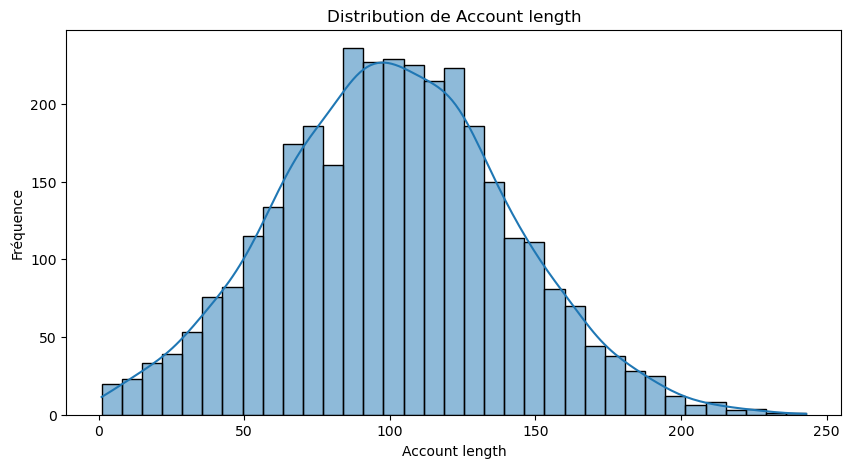

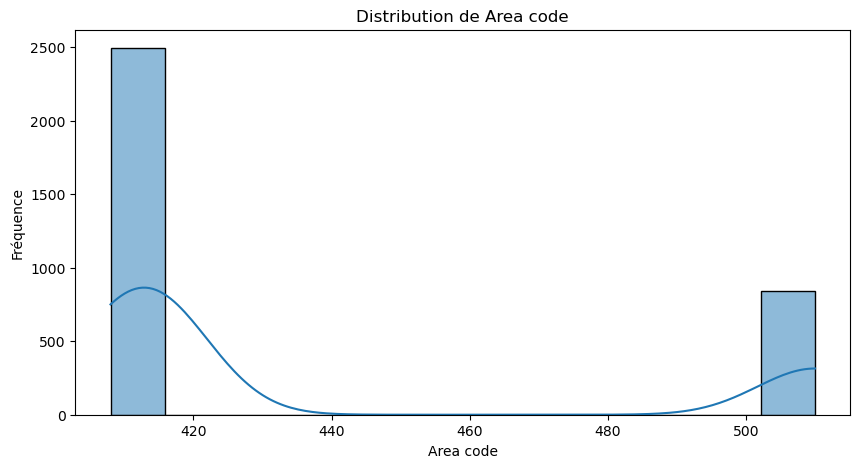

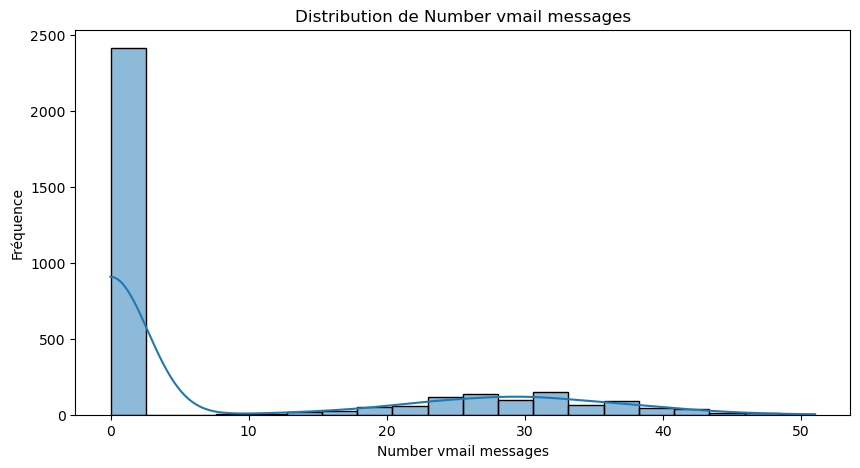

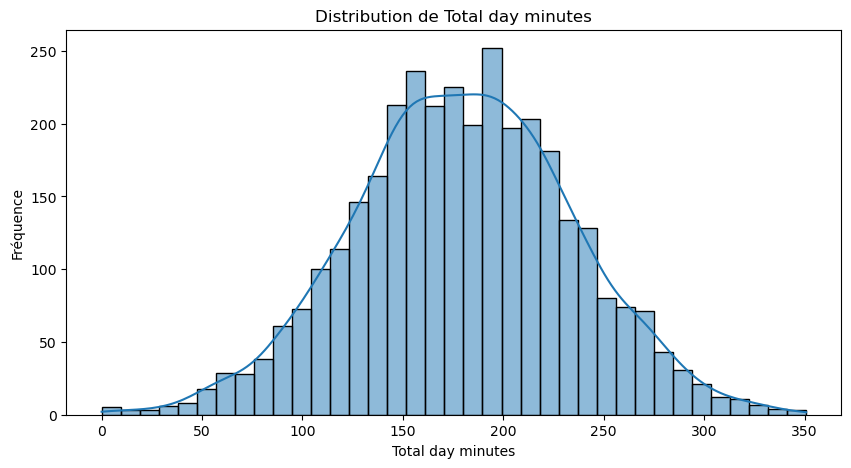

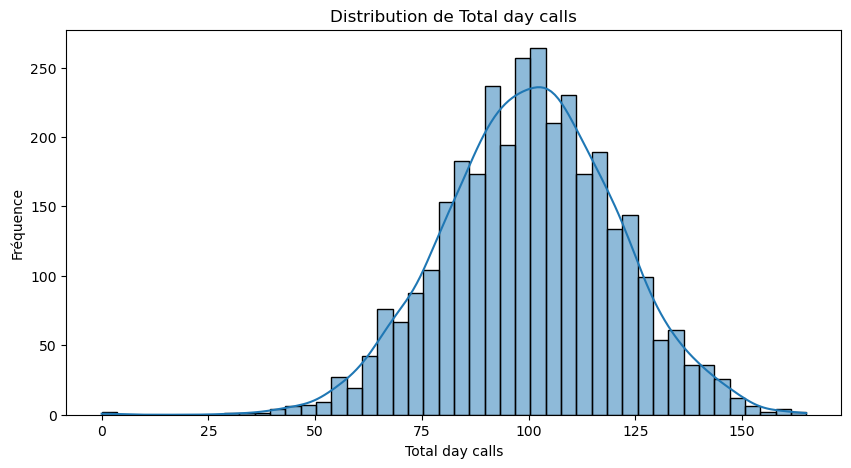

...

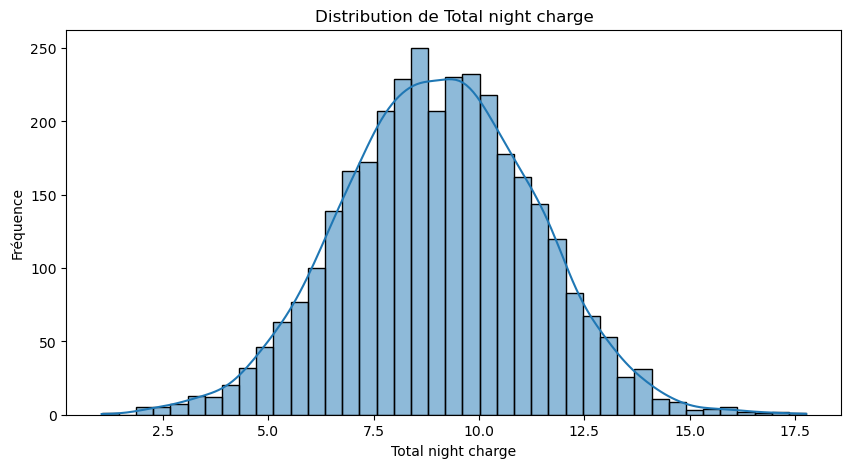

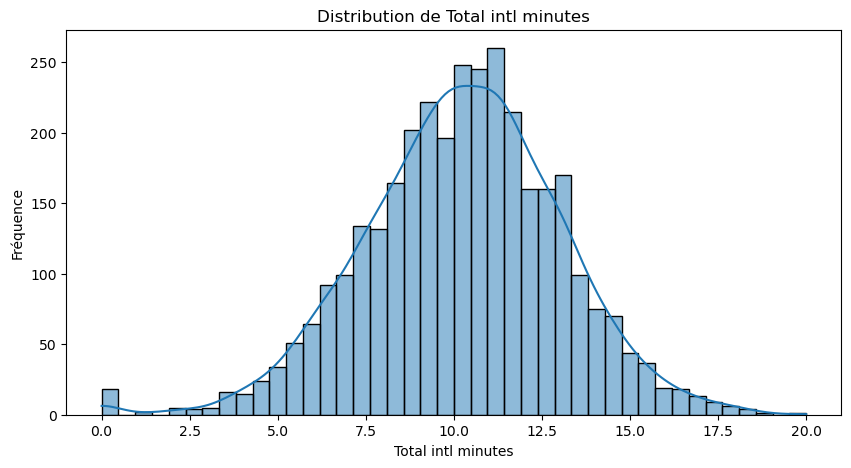

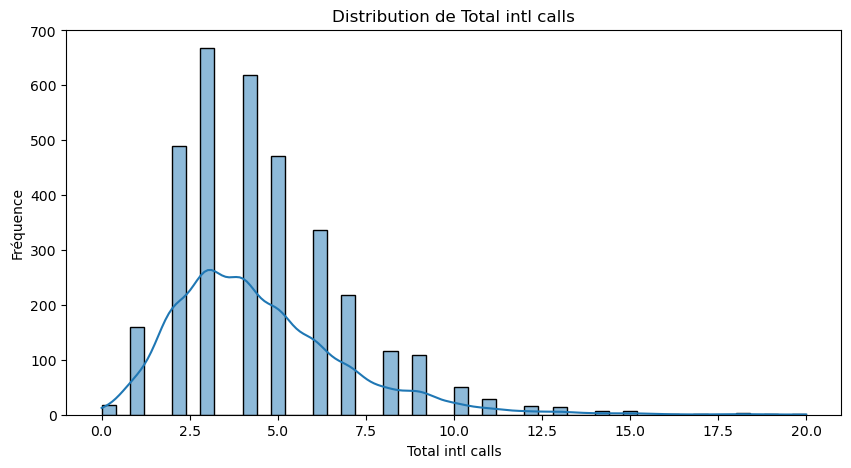

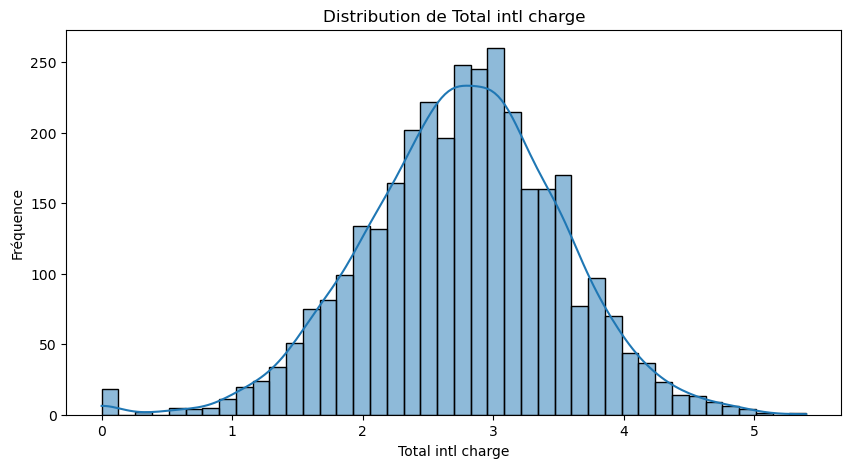

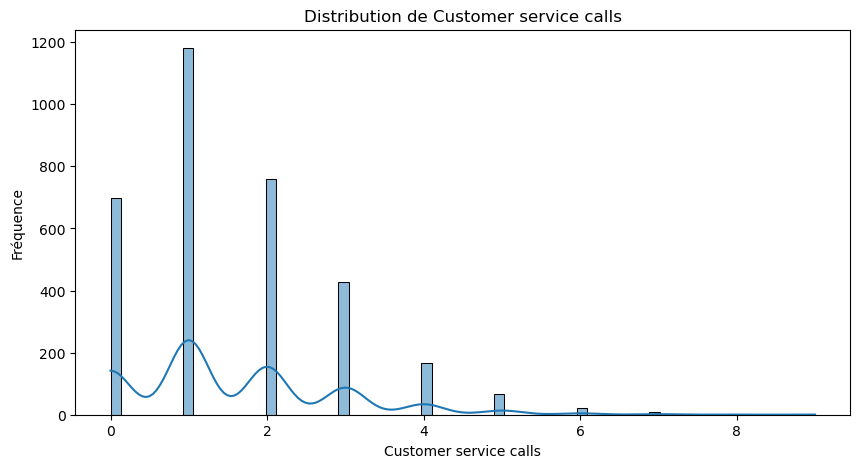


Tableau des résultats de l'analyse des variables numériques :
                  Variable  Shapiro-Wilk Statistic       p-value   Normality
0           Account length                0.998278  1.156471e-03  Non-Normal
1                Area code                0.590268  9.639330e-67  Non-Normal
2    Number vmail messages                0.621938  3.449436e-65  Non-Normal
3        Total day minutes                0.999538  6.401066e-01      Normal
4          Total day calls                0.997985  2.760378e-04  Non-Normal
5         Total day charge                0.999538  6.401143e-01      Normal
6        Total eve minutes                0.999572  7.124797e-01      Normal
7          Total eve calls                0.998672  8.767838e-03  Non-Normal
8         Total eve charge                0.999571  7.090925e-01      Normal
9      Total night minutes                0.999532  6.269782e-01      Normal
10       Total night calls                0.999312  2.513500e-01      Normal
11      Total

In [32]:
analyse_data(data)

# Interpretation of Analysis Results

## Results of Normality Tests (Shapiro-Wilk)

### Numerical Variables

| Variable                       | Shapiro-Wilk Statistic | p-value             | Normality    |
|--------------------------------|------------------------|---------------------|--------------|
| Account length                 | 0.9984                 | 0.0089              | Non-Normal   |
| Area code                     | 0.5921                 | 7.10e-62            | Non-Normal   |
| Number of vmail messages       | 0.6197                 | 1.39e-60            | Non-Normal   |
| Total day minutes              | 0.9994                 | 0.5562              | Normal       |
| Total day calls                | 0.9973                 | 0.0001              | Non-Normal   |
| Total day charge               | 0.9994                 | 0.5559              | Normal       |
| Total evening minutes           | 0.9995                 | 0.7331              | Normal       |
| Total evening calls             | 0.9983                 | 0.0079              | Non-Normal   |
| Total evening charge            | 0.9995                 | 0.7301              | Normal       |
| Total night minutes             | 0.9993                 | 0.4722              | Normal       |
| Total night calls               | 0.9991                 | 0.1862              | Normal       |
| Total night charge              | 0.9993                 | 0.4686              | Normal       |
| Total international minutes     | 0.9938                 | 3.54e-09            | Non-Normal   |
| Total international calls       | 0.9025                 | 2.95e-38            | Non-Normal   |
| Total international charge      | 0.9938                 | 3.32e-09            | Non-Normal   |
| Customer service calls          | 0.8768                 | 1.03e-41            | Non-Normal   |

### Interpretation

- Variables **Total day minutes**, **Total day charge**, **Total evening minutes**, **Total evening charge**, **Total night minutes**, **Total night charge**, and **Total night calls** follow a normal distribution (p-value > 0.05). These variables can be analyzed using parametric tests.
- Other variables, such as **Account length**, **Area code**, **Number of vmail messages**, **Total international minutes**, **Total international calls**, **Total international charge**, and **Customer service calls**, do not follow a normal distribution (p-value < 0.05). For these variables, non-parametric tests or data transformations may be necessary.

---

## Analysis of Categorical Variables

### Categorical Variables

| Categorical Variable   | Number of Modalities | Recommendation                                                                                      |
|-------------------------|---------------------|-----------------------------------------------------------------------------------------------------|
| State                   | > 2                 | Use the Chi-square test or logistic regression for variables with multiple modalities.              |
| International plan      | 2                   | Use the Chi-square test to compare proportions.                                                    |
| Voice mail plan         | 2                   | Use the Chi-square test to compare proportions.                                                    |

### Interpretation

- For variables **International plan** and **Voice mail plan**, which each have two modalities, the Chi-square test is suitable for determining whether there is a significant association between these variables and churn.
- For the variable **State**, although it has more than two modalities, the Chi-square test is also recommended. Logistic regression can also be used to model the relationship between this variable and churn, especially if the goal is to predict the probability of churn based on multiple explanatory variables.



## Conclusion

The results reveal diverse distributions among numerical variables, requiring varied approaches to statistical testing. Categorical variables should be analyzed using the Chi-square test, particularly to evaluate the impact of different modalities on churn. For **State**, Chi-square is the logical choice for analyzing relationships with a categorical variable.

## State VS Churn

In [33]:
def diff_bar(x,y):

    data.groupby([x,y]).size().unstack(level=-1).plot(kind='bar', figsize=(35,10))
    plt.xlabel(x,fontsize= 25)
    plt.ylabel('count',fontsize= 25)
    plt.legend(loc=0,fontsize= 25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.title("{X} Vs {Y}".format(X=x,Y=y),fontsize = 40)
    plt.show()

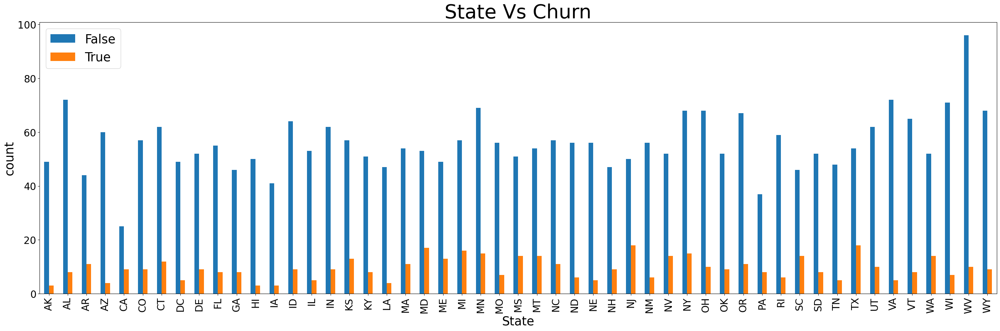

In [34]:
diff_bar('State','Churn')


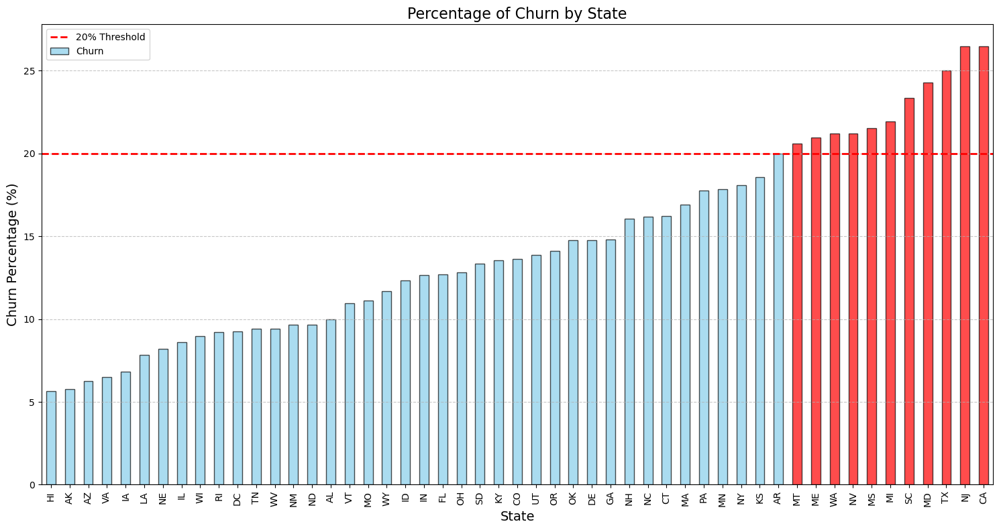

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your data is stored in a DataFrame named 'df'

# Convert 'Churn' column to binary indicator if not already (True = 1, False = 0)
data['Churn'] = data['Churn'].astype(int)

# Calculate churn percentage for each state
state_churn_percentage = data.groupby('State')['Churn'].mean() * 100

# Sort states by churn percentage
state_churn_percentage = state_churn_percentage.sort_values()

# Highlight states with churn > 20%
colors = ['red' if value > 20 else 'skyblue' for value in state_churn_percentage]

# Plot the churn percentages with highlights
plt.figure(figsize=(15, 8))
bars = state_churn_percentage.plot(kind='bar', color=colors, edgecolor='black', alpha=0.7)

# Add a red dashed line at 20%
plt.axhline(20, color='red', linestyle='--', linewidth=2, label='20% Threshold')

# Add labels and title
plt.title('Percentage of Churn by State', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('Churn Percentage (%)', fontsize=14)
plt.xticks(rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better appearance
plt.tight_layout()
plt.show()


## Test Chi-carré pour variable catégorielle a deux modalités

Variables catégorielles avec 6 modalités ou moins :
['International plan', 'Voice mail plan']

Tableau de contingence pour International plan :
Churn                  0    1
International plan           
No                  2664  346
Yes                  186  137
Chi2 Statistic: 222.5657566499376, p-value: 2.4931077033159556e-50


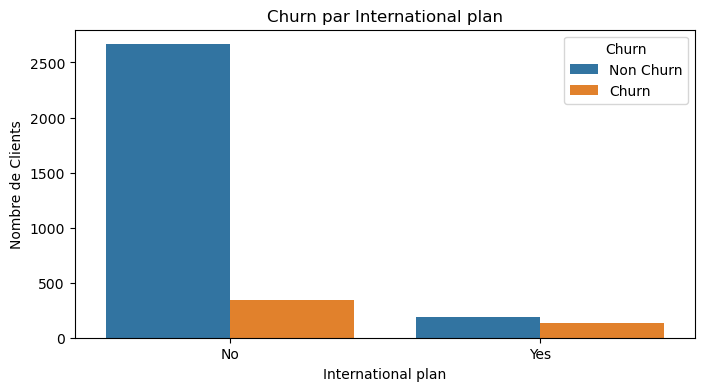


Tableau de contingence pour Voice mail plan :
Churn               0    1
Voice mail plan           
No               2008  403
Yes               842   80
Chi2 Statistic: 34.13166001075673, p-value: 5.15063965903898e-09


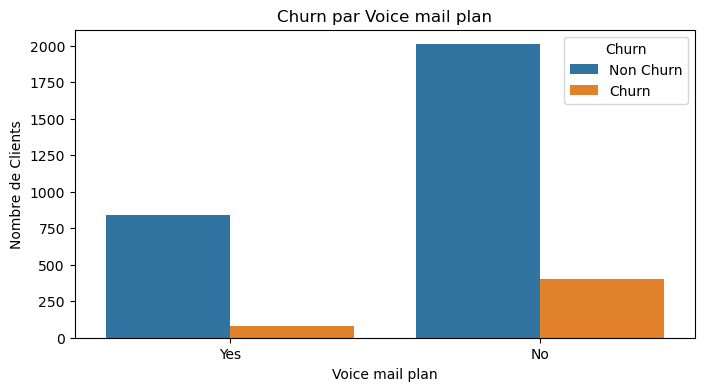

In [36]:
import pandas as pd
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt
# Identifier les variables catégorielles avec 6 modalités ou moins
categorical_columns = data.select_dtypes(include=['object', 'category']).columns
low_cardinality_columns = [col for col in categorical_columns if data[col].nunique() <= 6]

# Afficher les variables identifiées
print("Variables catégorielles avec 6 modalités ou moins :")
print(low_cardinality_columns)

# Analyse des variables
for column in low_cardinality_columns:
    # Créer un tableau de contingence
    contingency_table = pd.crosstab(data[column], data['Churn'])
    print(f"\nTableau de contingence pour {column} :")
    print(contingency_table)

    # Effectuer le test du chi-carré
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi2 Statistic: {chi2}, p-value: {p}")

    # Visualisation
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=column, hue='Churn')
    plt.title(f'Churn par {column}')
    plt.xlabel(column)
    plt.ylabel('Nombre de Clients')
    plt.legend(title='Churn', labels=['Non Churn', 'Churn'])
    plt.show()

# Interpretation of Results for Categorical Variables

## Analyzed Categorical Variables
- **International Plan**
- **Voice Mail Plan**

### 1. International Plan

**Contingency Table:**

| **International Plan** | **Churn (False)** | **Churn (True)** |
|------------------------|-------------------|------------------|
| No                     | 2126              | 270              |
| Yes                    | 152               | 118              |

- **Chi2 Statistic:** 202.68  
- **p-value:** 5.43e-46  

#### Interpretation
- **Distribution:** Among customers without an international plan, 2126 did not churn (churn = False), while 270 churned (churn = True). For customers with an international plan, 152 did not churn, and 118 churned.
- **Significance:** The p-value is extremely low (p < 0.01), indicating a highly significant association between the international plan and churn. This suggests that customers with an international plan have different churn rates compared to those without the plan.

### 2. Voice Mail Plan

**Contingency Table:**

| **Voice Mail Plan** | **Churn (False)** | **Churn (True)** |
|---------------------|-------------------|------------------|
| No                  | 1610              | 323              |
| Yes                 | 668               | 65               |

- **Chi2 Statistic:** 25.66  
- **p-value:** 4.08e-07  

#### Interpretation
- **Distribution:** Among customers without a voicemail plan, 1610 did not churn, while 323 churned. For those with a voicemail plan, 668 did not churn, and 65 churned.
- **Significance:** The p-value is also very low (p < 0.01), indicating a significant association between the voicemail plan and churn. This suggests that customers with a voicemail plan have different churn rates compared to those without this plan.

## Hypotheses

### Hypothesis 1: Impact of the International Plan on Churn
- **H0 (Null Hypothesis):** There is no difference in churn rates between customers with and without an international plan.  
- **H1 (Alternative Hypothesis):** Customers with an international plan have significantly different churn rates compared to those without an international plan.

### Hypothesis 2: Impact of the Voicemail Plan on Churn
- **H0 (Null Hypothesis):** There is no difference in churn rates between customers with and without a voicemail plan.  
- **H1 (Alternative Hypothesis):** Customers with a voicemail plan have significantly different churn rates compared to those without a voicemail plan.

## Conclusion
The results indicate that both the international plan and voicemail plan have a significant impact on customer churn behavior. These insights can be crucial for guiding retention and marketing strategies.

## ANOVA TEST TO VERIFY THE SIGNIFICANCE OF THE AREA CODE VARIABLE IN THE DATASET ## 


The use of the ANOVA test to analyze the Area Code variable in relation to the target variable Churn and other numerical variables is justified for several reasons:

1. **Nature of the Data**
   - **Categorical Variable:** The Area Code is a categorical variable with a limited number of modalities (in this case, three area codes).
   - **Continuous Variables:** The ANOVA test is appropriate when comparing the means of a continuous variable (e.g., a numerical variable) across several groups defined by a categorical variable.

2. **Objective of the Analysis**
   - **Comparing Means:** The primary objective of ANOVA is to determine whether the means of the numerical variables differ significantly among the groups defined by the Area Code. This can help identify if the area code influences behaviors or characteristics measured by these variables.

In [37]:
print(train_data['Area code'].unique())

[415 408 510]


In [38]:
from scipy.stats import f_oneway


# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]
#Liste pour stocker les résultats
results = {}

# Effectuer ANOVA pour chaque variable numérique
for col in numeric_columns:
    if col != 'Churn':
        # Créer des groupes basés sur Area code
        groups = [group[col].dropna() for name, group in data.groupby('Area code')]
        
        # Effectuer le test ANOVA
        f_stat, p_value = f_oneway(*groups)
        results[col] = p_value

# Afficher les résultats
for col, p in results.items():
    print(f"Variable: {col}, P-value: {p}")

Variable: Account length, P-value: 0.7035973261002009
Variable: Number vmail messages, P-value: 0.484551904588579
Variable: Total day minutes, P-value: 0.1334552217622214
Variable: Total day calls, P-value: 0.849058755424852
Variable: Total day charge, P-value: 0.13336396381213422
Variable: Total eve minutes, P-value: 0.9333694434622081
Variable: Total eve calls, P-value: 0.5295948885972304
Variable: Total eve charge, P-value: 0.933041342752116
Variable: Total night minutes, P-value: 0.3840092460932546
Variable: Total night calls, P-value: 0.1830281352929301
Variable: Total night charge, P-value: 0.38394220263817713
Variable: Total intl minutes, P-value: 0.0924966132674956
Variable: Total intl calls, P-value: 0.14172716271031538
Variable: Total intl charge, P-value: 0.09230921929243811
Variable: Customer service calls, P-value: 0.2460986740385798


In [39]:
import pandas as pd
from scipy import stats

# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]

# Créer une liste pour stocker les résultats
results = []

# Effectuer le test ANOVA pour chaque variable numérique par rapport à 'Area code'
for column in numeric_columns:
    # Créer des groupes par code régional pour churn et no churn
    groups_churn = [data[(data['Area code'] == code) & (data['Churn'] == 1)][column].dropna() for code in data['Area code'].unique()]
    groups_no_churn = [data[(data['Area code'] == code) & (data['Churn'] == 0)][column].dropna() for code in data['Area code'].unique()]
    
    # Réaliser le test ANOVA pour churn
    f_statistic_churn, p_value_churn = stats.f_oneway(*groups_churn)
    
    # Réaliser le test ANOVA pour no churn
    f_statistic_no_churn, p_value_no_churn = stats.f_oneway(*groups_no_churn)
    
    # Ajouter les résultats à la liste
    results.append({
        'Variable': column,
        'Churn F-statistic': f_statistic_churn,
        'Churn p-value': p_value_churn,
        'No Churn F-statistic': f_statistic_no_churn,
        'No Churn p-value': p_value_no_churn
    })

# Convertir les résultats en DataFrame
results_df = pd.DataFrame(results)

# Afficher les résultats de manière organisée
print("### Résultats de l'Analyse ANOVA pour la variable area code ###\n")
print(results_df.to_string(index=False))

### Résultats de l'Analyse ANOVA pour la variable area code ###

              Variable  Churn F-statistic  Churn p-value  No Churn F-statistic  No Churn p-value
        Account length           1.615990       0.199773              0.062458          0.939453
 Number vmail messages           1.305334       0.272043              1.458704          0.232711
     Total day minutes           0.900884       0.406896              2.077415          0.125443
       Total day calls           0.523975       0.592500              0.412899          0.661769
      Total day charge           0.900740       0.406955              2.078369          0.125324
     Total eve minutes           0.030112       0.970339              0.080830          0.922353
       Total eve calls           0.956894       0.384815              0.637184          0.528855
      Total eve charge           0.030232       0.970222              0.081002          0.922194
   Total night minutes           0.260942       0.770434      

# Analysis of ANOVA Results for the Area Code Variable

### Introduction
The ANOVA analysis was conducted to assess the significance of numerical variables in relation to the categorical variable **Area Code**, distinguishing between churners (Churn = 1) and non-churners (Churn = 0). The results include the F-statistic and p-value for each variable.

### Results

| Variable                     | Churn F-statistic | Churn p-value | No Churn F-statistic | No Churn p-value |
|------------------------------|--------------------|----------------|----------------------|-------------------|
| Account length               | 1.980              | 0.139          | 0.062                | 0.940             |
| Number of vmail messages     | 1.454              | 0.235          | 0.986                | 0.373             |
| Total day minutes            | 0.918              | 0.400          | 1.678                | 0.187             |
| Total day calls              | 0.748              | 0.474          | 0.296                | 0.744             |
| Total day charge             | 0.918              | 0.400          | 1.679                | 0.187             |
| Total eve minutes            | 0.022              | 0.979          | 0.120                | 0.887             |
| Total eve calls              | 0.606              | 0.546          | 1.128                | 0.324             |
| Total eve charge             | 0.022              | 0.979          | 0.120                | 0.887             |
| Total night minutes          | 0.398              | 0.672          | 0.283                | 0.754             |
| Total night calls            | 0.992              | 0.372          | 2.303                | 0.100             |
| Total night charge           | 0.400              | 0.671          | 0.282                | 0.754             |
| Total intl minutes           | 1.044              | 0.353          | 1.598                | 0.203             |
| Total intl calls             | 1.771              | 0.172          | 1.079                | 0.340             |
| Total intl charge            | 1.032              | 0.357          | 1.605                | 0.201             |
| Customer service calls       | 0.202              | 0.817          | 3.005                | 0.050             |

### Interpretation of Results

- **Significance of p-values:**
  - Generally, a p-value less than 0.05 indicates a significant difference between the means of the groups.
  - For the majority of the variables, the p-values are greater than 0.05, indicating that there is no significant difference between the groups defined by **Area Code** for these variables.

- **Notable Variable:**
  - **Customer service calls:** For non-churners, the p-value is 0.050, which is at the threshold of significance. This may indicate a trend toward a significant difference in the number of customer service calls between the **Area Code** groups for non-churners.

### Conclusion

The ANOVA analysis revealed that, overall, the differences between the groups defined by **Area Code** are not significant for most numerical variables. However, the **Customer service calls** variable warrants particular attention, as it shows a trend toward significance for non-churners.

### Recommendations

- **Further Analysis:** It would be beneficial to explore the data further, particularly by using post-hoc tests for variables close to significance.
- **Visualizations:** Creating visualizations (such as boxplots) to illustrate the differences between groups could provide additional insights.

In [40]:
data = data.drop('Area code', axis=1)

### Customer churn in data

In [41]:
# Your data and trace definition

trace = go.Pie(labels=data["Churn"].value_counts().keys().tolist(),
               values=data["Churn"].value_counts().values.tolist(),
               marker=dict(colors=['green', 'red'],
                           line=dict(color="white", width=1.3)
                           ),
               rotation=90,
               hoverinfo="label+value+text",
               hole=0.55
               )

layout = go.Layout(
    title=dict(
        text="Customer churn in training data",
        x=0.5,  # Set the x position to 0.5 for center alignment
    ),
    plot_bgcolor="rgb(243,243,243)",
    paper_bgcolor="rgb(243,243,243)"
)

img = [trace]
fig = go.Figure(data=img, layout=layout)

# Use py.iplot to display the plot in a Jupyter Notebook or JupyterLab
py.iplot(fig)


### Variable Distributions

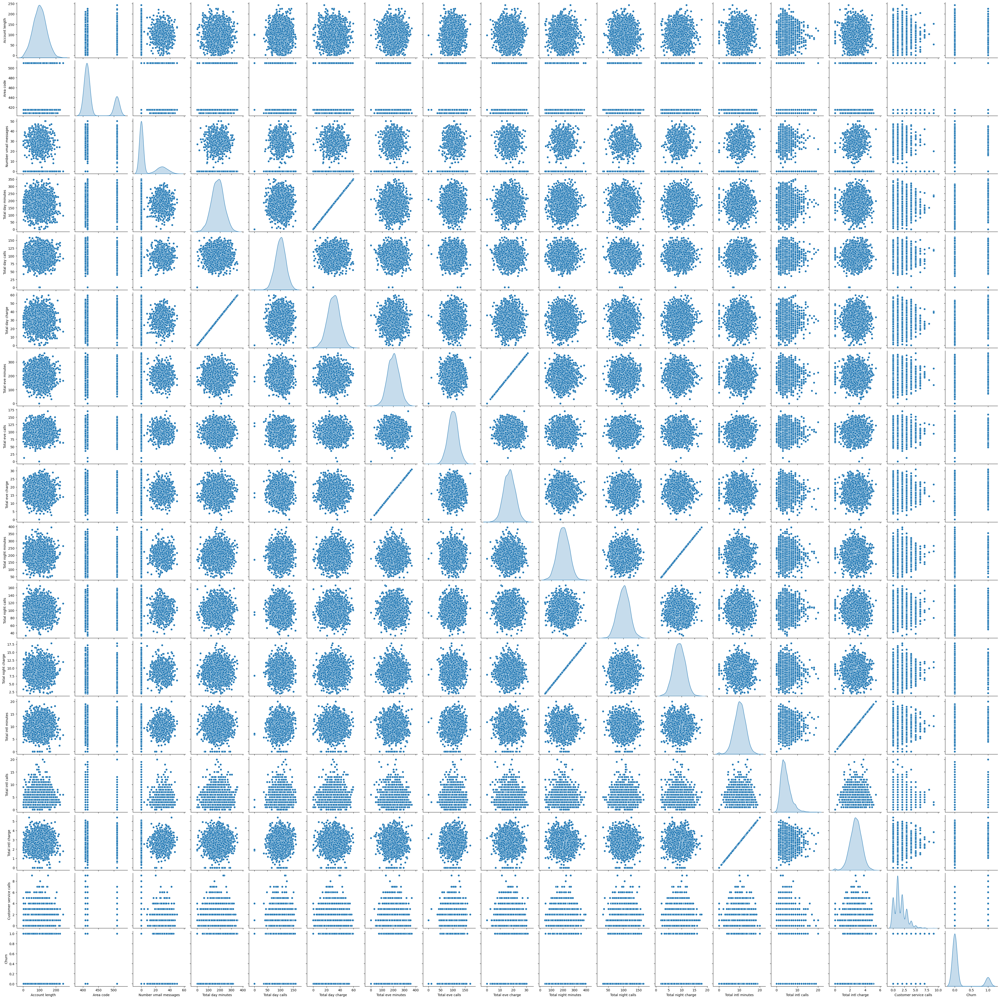

In [42]:
#Separating columns to be visualized
out_cols = list(set(data.nunique()[train_data.nunique()<6].keys().tolist()
                    + data.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in train_data.columns if x not in out_cols] + ['Churn']

sns.pairplot(train_data[viz_cols], diag_kind="kde")
plt.show()

In [43]:
data = data.drop('State', axis=1)


## Data Preprocessing 

In [44]:
# from sklearn.preprocessing import LabelEncoder
# from sklearn.preprocessing import StandardScaler
# col_to_drop = ['Area code',  
#  'Total day minutes',
#  'Total eve minutes',
#  'Total night minutes',
#  'Total intl minutes'
#               ]
# train_data = train_data.drop(columns=col_to_drop, axis=1)
# test_data = test_data.drop(columns=col_to_drop, axis=1)

In [45]:
data.shape

(3333, 18)

In [46]:
# Number of levels in feature to be a categorical feature
nlevels = 6
cat_cols = list(set(
    train_data.nunique()[train_data.nunique()
    < nlevels].keys().tolist()
    + train_data.select_dtypes(include='object').columns.tolist()
))

# Print the list of categorical columns
print("Categorical Columns:", cat_cols)


Categorical Columns: ['State', 'International plan', 'Churn', 'Voice mail plan', 'Area code']


# Data Preparation for the data Analysis

## 1. Define the Target Column

The target column in the dataset is crucial for guiding the analysis and modeling efforts. In this case, the target variable is **Churn**, which indicates whether a customer has churned (1) or not (0). This binary classification will allow us to explore various factors that may influence customer retention.

In [47]:
target_col = ["Churn"]

# Combining the Train and Test Data

In [48]:
data.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


### 2. Specify the Number of Levels for Categorical Variables

In [49]:
# Number of levels in feature to be a categorical feature
nlevels = 6

### 3. Separate Categorical and Numerical Columns


In [50]:
# Categorical columns
cat_cols = list(set(data.nunique()[data.nunique() < nlevels].keys().tolist() 
                    + data.select_dtypes(include='object').columns.tolist()))
cat_cols = [x for x in cat_cols if x not in target_col]
cat_cols

['International plan', 'Voice mail plan']

### 4. Identify Binary and Multi-Valued Columns

#### a. Columns with Two Modalities (== 2)

In [51]:
# Binary columns with 2 values
bin_cols =data.nunique()[data.nunique() == 2].keys().tolist()
bin_cols

['International plan', 'Voice mail plan', 'Churn']

#### b. Categorical Columns with More Than Two Modalities (> 2)

In [52]:
# Columns with more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]
multi_cols

[]

#### c. Encode Binary Columns with Label Encoding


In [53]:
# Label encoding Binary columns
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
label_encoders = {}
for i in bin_cols:
    data[i] = le.fit_transform(data[i])
    #test_data[i] = le.transform(test_data[i])
    label_encoders[i] = le


### 4. Corrolation Matrix 

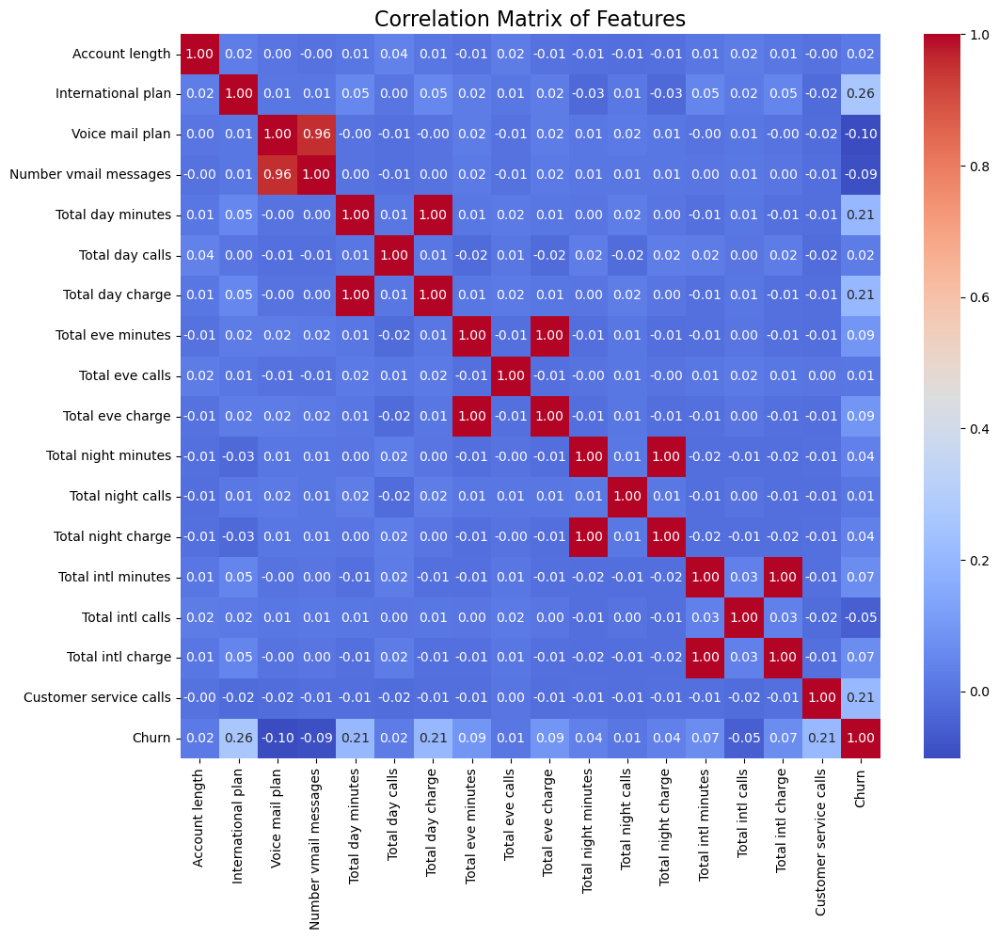

In [54]:
# prompt: correlation heatmap

# Correlation Heatmap
plt.figure(figsize=(12, 10))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features', fontsize=16)
plt.show()

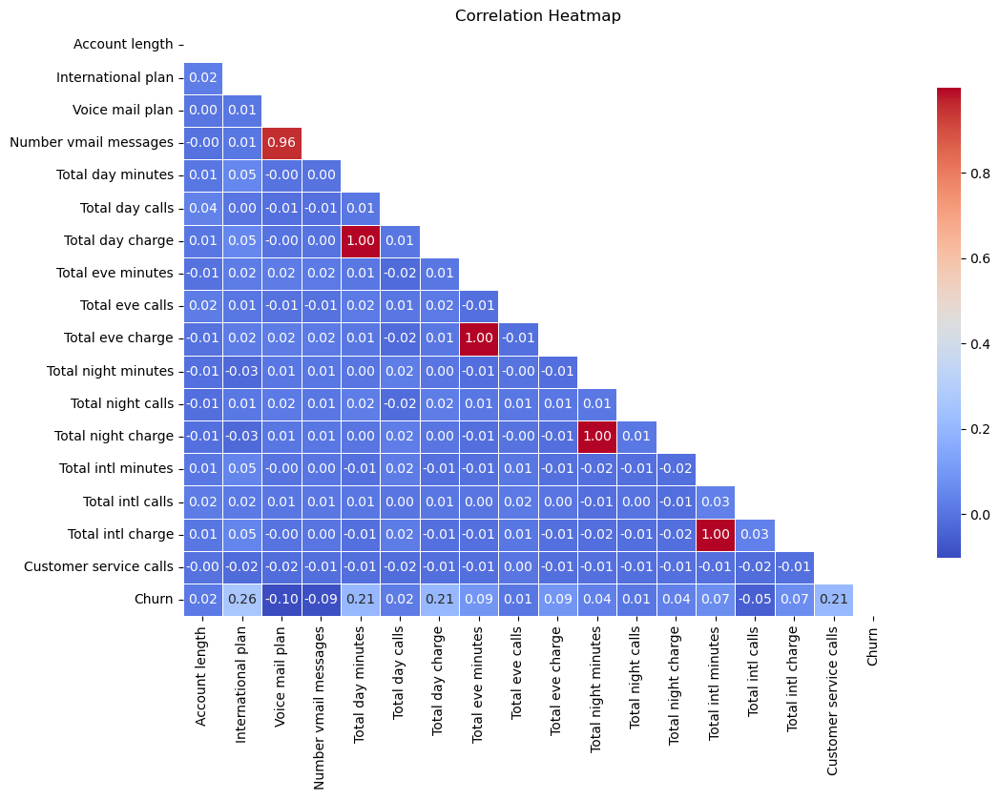

,Feature1,Feature2,Correlation
0,Total day minutes,Total day charge,1.000000
1,Total eve minutes,Total eve charge,1.000000
2,Total night minutes,Total night charge,0.999999
3,Total intl minutes,Total intl charge,0.999993
4,Voice mail plan,Number vmail messages,0.956927


In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Compute the correlation matrix
correlation_matrix = data.corr()

# Plot the heatmap with a mask to hide the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
            linewidths=0.5, mask=mask, cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap")
plt.show()

# Set a threshold for high correlation
threshold = 0.9

# Find pairs of features with correlation greater than the threshold
high_correlation_pairs = correlation_matrix.unstack().reset_index()
high_correlation_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
high_correlation_pairs = high_correlation_pairs[
    (abs(high_correlation_pairs['Correlation']) > threshold) &
    (high_correlation_pairs['Feature1'] != high_correlation_pairs['Feature2'])
]

# Sort by correlation and remove duplicates
high_correlation_pairs = high_correlation_pairs.sort_values(by='Correlation', ascending=False)
high_correlation_pairs = high_correlation_pairs.drop_duplicates(subset=['Correlation'])

# Reset index for better presentation
high_correlation_pairs.reset_index(drop=True, inplace=True)

# Display the high correlation pairs
high_correlation_pairs

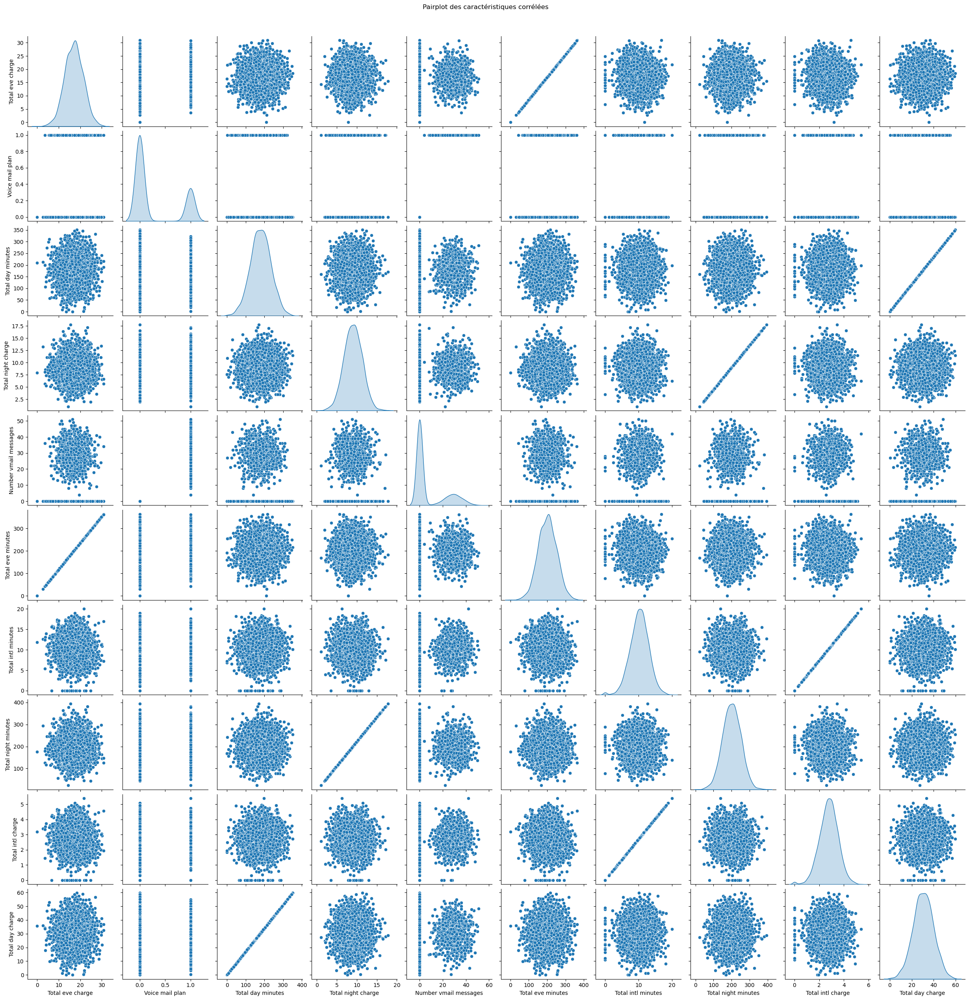

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculer la matrice de corrélation
corr_matrix = data.corr()

# Définir un seuil de corrélation pour forte corrélation
threshold = 0.9  # Vous pouvez ajuster ce seuil

# Trouver les variables avec une corrélation proche de 1 ou -1
high_corr_var = corr_matrix[abs(corr_matrix) > threshold].stack().reset_index()

# Filtrer les paires de variables (en évitant les doublons)
high_corr_var = high_corr_var[(high_corr_var['level_0'] != high_corr_var['level_1'])]

# Obtenir une liste unique de variables
unique_vars = list(set(high_corr_var['level_0']).union(set(high_corr_var['level_1'])))

# Visualiser avec pairplot
sns.pairplot(data[unique_vars], diag_kind="kde")
plt.suptitle("Pairplot des caractéristiques corrélées", y=1.02)
plt.show()

#####  Several of the numerical data are very correlated. (Total day minutes and Total day charge), (Total eve minutes and Total eve charge), (Total night minutes and Total night charge) and lastly (Total intl minutes and Total intl charge) are alo correlated. We only have to select one of them.

In [57]:
col_to_drop = [  
 'Total day minutes',
 'Total eve minutes',
 'Total night minutes',
 'Total intl minutes'
              ]
data = data.drop(columns=col_to_drop, axis=1)

In [58]:
# Numerical columns
num_cols = [x for x in data.columns if x not in cat_cols + target_col]
num_cols

['Account length',
 'Number vmail messages',
 'Total day calls',
 'Total day charge',
 'Total eve calls',
 'Total eve charge',
 'Total night calls',
 'Total night charge',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls']

## Detecting outliers for numericals features 

Percentage of outliers in each column:
Account length: 0.21%
Number vmail messages: 0.09%
Total day calls: 0.27%
Total day charge: 0.27%
Total eve calls: 0.21%
Total eve charge: 0.27%
Total night calls: 0.18%
Total night charge: 0.33%
Total intl calls: 1.50%
Total intl charge: 0.66%
Customer service calls: 1.05%


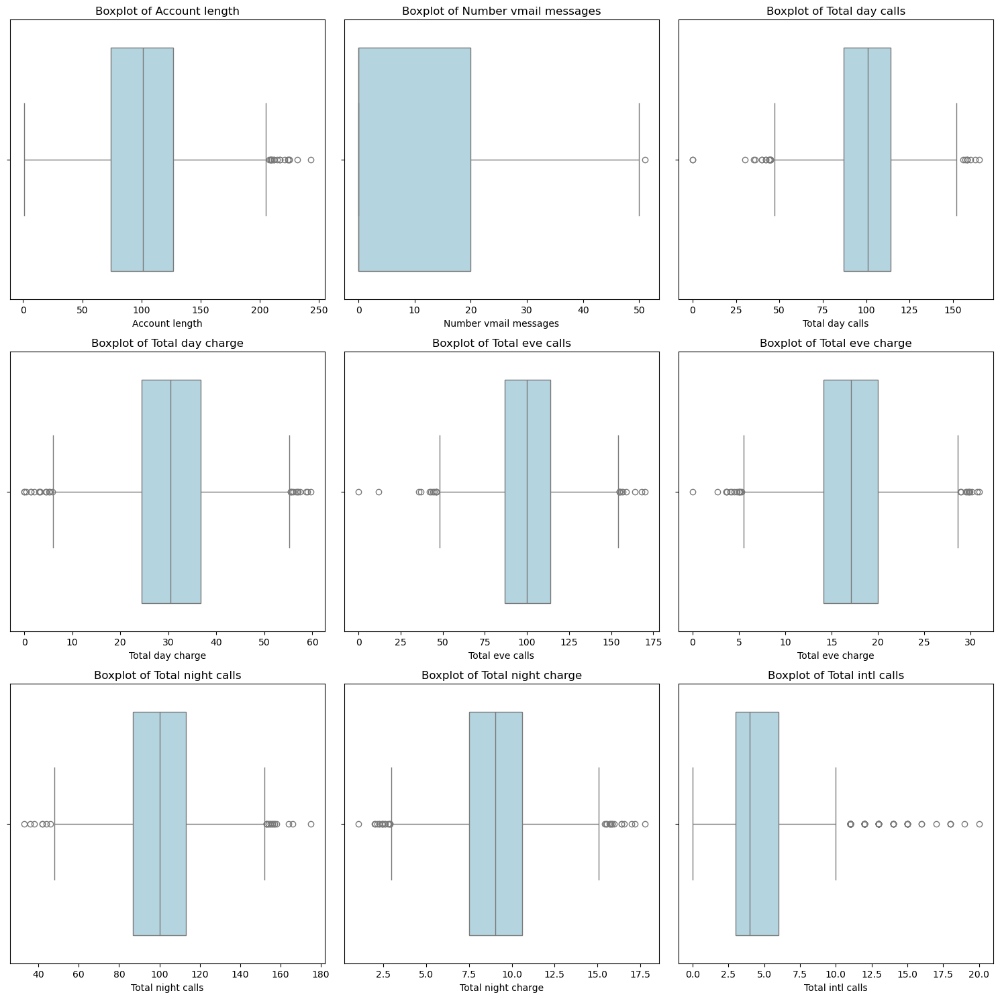

In [59]:
from scipy.stats import zscore
import numpy as np
# Calculate Z-Scores for numerical features
z_scores = np.abs(zscore(data[num_cols]))

# Define a threshold for outliers (e.g., 3 standard deviations)
threshold = 3

# Identify outliers
outliers = (z_scores > threshold)

# Calculate the percentage of outliers for each column
outlier_percentages = (outliers.sum(axis=0) / len(data)) * 100

# Print outlier percentages
print("Percentage of outliers in each column:")
for col, perc in zip(num_cols, outlier_percentages):
    print(f"{col}: {perc:.2f}%")

# Plot boxplots for each numerical feature
plt.figure(figsize=(15, 15))
for i, col in enumerate(num_cols[:9], 1):  # Limit to the first 9 columns
    plt.subplot(3, 3, i)
    sns.boxplot(data=data, x=col, color='lightblue')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

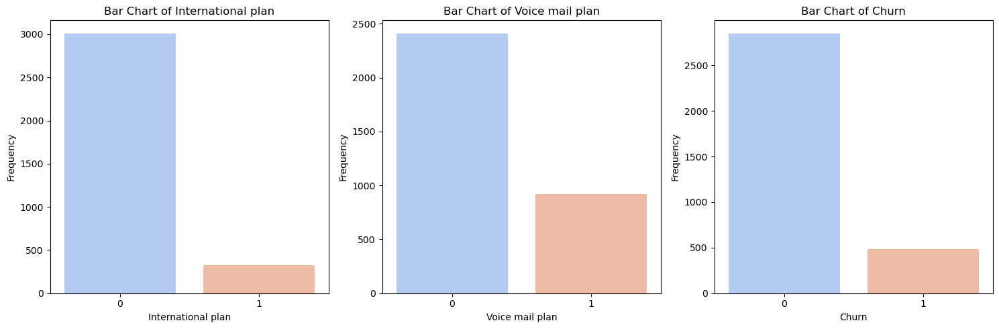

In [60]:
categorical_cols = ['International plan', 'Voice mail plan', 'Churn']

# Plot bar charts for each categorical feature
plt.figure(figsize=(15, 5))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(1, 3, i)
    sns.countplot(data=data, x=col, palette='coolwarm')
    plt.title(f'Bar Chart of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

#### there is not outliers in the categorical features

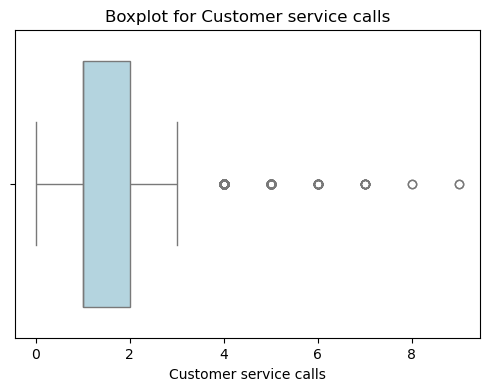

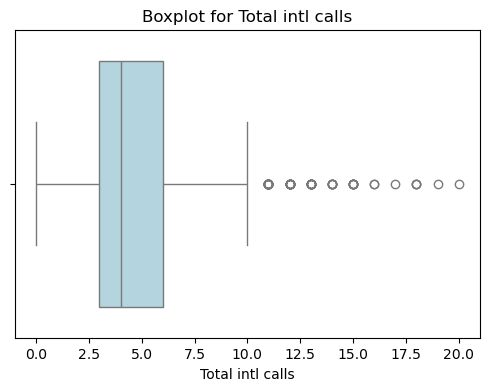

Percentage of outliers detected using IQR method:
Customer service calls: 8.01%
Total intl calls: 2.34%


In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define columns for IQR outlier detection
columns_to_check = ['Customer service calls', 'Total intl calls']

# Initialize dictionary to store outlier percentages
outlier_percentages = {}

# IQR Method for outlier detection
for col in columns_to_check:
    Q1 = data[col].quantile(0.25)  # First quartile
    Q3 = data[col].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR  # Lower boundary
    upper_bound = Q3 + 1.5 * IQR  # Upper boundary

    # Detect outliers
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    outlier_percentages[col] = (len(outliers) / len(data)) * 100

    # Boxplot for the feature
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=data, x=col, color='lightblue')
    plt.title(f'Boxplot for {col}')
    plt.xlabel(col)
    plt.show()

# Print outlier percentages
print("Percentage of outliers detected using IQR method:")
for col, perc in outlier_percentages.items():
    print(f"{col}: {perc:.2f}%")


In [62]:
import numpy as np
import pandas as pd
from scipy.stats import zscore

# Calculate Z-Scores for numerical features
z_scores = pd.DataFrame(np.abs(zscore(data[num_cols])), columns=num_cols, index=data.index)
threshold = 3

# Create a copy of the DataFrame to modify
data_cleaned = data.copy()

# Process each column based on outlier percentage
for col in num_cols:
    z_col = z_scores[col]  # Z-Scores for the specific column

    # Detect outliers
    outliers = (z_col > threshold)
    outlier_percentage = (outliers.sum() / len(data)) * 100

    if outlier_percentage < 1:
        # Remove outliers
        data_cleaned = data_cleaned[~outliers]
    elif 1 <= outlier_percentage <= 3:
        # Cap outliers
        upper_limit = data_cleaned[col].mean() + threshold * data_cleaned[col].std()
        lower_limit = data_cleaned[col].mean() - threshold * data_cleaned[col].std()
        data_cleaned[col] = np.clip(data_cleaned[col], lower_limit, upper_limit)

# Display the cleaned DataFrame
print("Shape of the dataset after processing:", data_cleaned.shape)
print(data_cleaned.describe())

# Function to check if outliers are treated
def check_outliers_treated(data, columns, threshold=3):
    """Check if outliers are still present in the dataset using Z-Score method."""
    z_scores = pd.DataFrame(np.abs(zscore(data[columns])), columns=columns, index=data.index)
    outliers_remaining = {}
    for col in columns:
        outliers = (z_scores[col] > threshold)
        outliers_remaining[col] = outliers.sum()
    return outliers_remaining

# Check if outliers are treated
outliers_remaining = check_outliers_treated(data_cleaned, num_cols)

# Print the result
print("Remaining outliers after treatment (using Z-Score method):")
for col, count in outliers_remaining.items():
    print(f"{col}: {count} outliers remaining")

Shape of the dataset after processing: (3253, 14)
       Account length  International plan  Voice mail plan  \
count     3253.000000         3253.000000      3253.000000   
mean       100.761758            0.097141         0.276360   
std         39.460236            0.296195         0.447266   
min          1.000000            0.000000         0.000000   
25%         74.000000            0.000000         0.000000   
50%        100.000000            0.000000         0.000000   
75%        127.000000            0.000000         1.000000   
max        217.000000            1.000000         1.000000   

       Number vmail messages  Total day calls  Total day charge  \
count            3253.000000      3253.000000       3253.000000   
mean                8.077774       100.564095         30.614580   
std                13.649691        19.717141          9.151115   
min                 0.000000        42.000000          2.990000   
25%                 0.000000        87.000000         24

In [63]:
import pandas as pd
import numpy as np
from scipy import stats

import numpy as np
import pandas as pd
from scipy.stats import shapiro
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

def choose_scaling_method(data, num_cols):
    scaling_methods = {}
    
    for col in num_cols:
        # Test de normalité
        stat, p_value = shapiro(data[col])
        is_normal = p_value > 0.05  # Acceptons H0 (normalité) si p > 0.05
        
        # Détection des outliers avec IQR
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        has_outliers = (data[col] < lower_bound).sum() + (data[col] > upper_bound).sum() > 0
        
        # Choisir la méthode de scaling
        if is_normal:
            scaling_methods[col] = 'StandardScaler'
        elif not is_normal and not has_outliers:
            scaling_methods[col] = 'MinMaxScaler'
        else:
            scaling_methods[col] = 'RobustScaler'
    
    return scaling_methods

# Exemple d'utilisation
num_cols = ['Account length', 'Number vmail messages', 'Total day calls', 'Total day charge', 
            'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 
            'Total intl calls', 'Total intl charge', 'Customer service calls']

scaling_methods = choose_scaling_method(data_cleaned, num_cols)

# Appliquer le scaling
for col, method in scaling_methods.items():
    if method == 'StandardScaler':
        scaler = StandardScaler()
    elif method == 'MinMaxScaler':
        scaler = MinMaxScaler()
    elif method == 'RobustScaler':
        scaler = RobustScaler()
    
    data_cleaned[col] = scaler.fit_transform(data_cleaned[[col]])
    
print("Méthodes de scaling choisies pour chaque variable :")
print(scaling_methods)

Méthodes de scaling choisies pour chaque variable :
{'Account length': 'RobustScaler', 'Number vmail messages': 'MinMaxScaler', 'Total day calls': 'RobustScaler', 'Total day charge': 'StandardScaler', 'Total eve calls': 'RobustScaler', 'Total eve charge': 'StandardScaler', 'Total night calls': 'RobustScaler', 'Total night charge': 'StandardScaler', 'Total intl calls': 'RobustScaler', 'Total intl charge': 'StandardScaler', 'Customer service calls': 'RobustScaler'}


In [64]:
# Exécuter la fonction
scaling_strategies = choose_scaling_method(data_cleaned, num_cols)

# Afficher les résultats
print("Stratégies de mise à l'échelle pour chaque variable numérique :")
print(scaling_strategies)

Stratégies de mise à l'échelle pour chaque variable numérique :
{'Account length': 'RobustScaler', 'Number vmail messages': 'MinMaxScaler', 'Total day calls': 'RobustScaler', 'Total day charge': 'StandardScaler', 'Total eve calls': 'RobustScaler', 'Total eve charge': 'StandardScaler', 'Total night calls': 'RobustScaler', 'Total night charge': 'StandardScaler', 'Total intl calls': 'RobustScaler', 'Total intl charge': 'StandardScaler', 'Customer service calls': 'RobustScaler'}


In [65]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler


# Stratégies de mise à l'échelle obtenues
scaling_strategies = {
    'Account length': 'RobustScaler',
    'Number vmail messages': 'RobustScaler',
    'Total day calls': 'RobustScaler',
    'Total day charge': 'StandardScaler',
    'Total eve calls': 'RobustScaler',
    'Total eve charge': 'StandardScaler',
    'Total night calls': 'StandardScaler',
    'Total night charge': 'StandardScaler',
    'Total intl calls': 'RobustScaler',
    'Total intl charge': 'RobustScaler',
    'Customer service calls': 'RobustScaler'
}

# Appliquer les scalers
for column, strategy in scaling_strategies.items():
    if strategy == 'StandardScaler':
        scaler = StandardScaler()
    elif strategy == 'MinMaxScaler':
        scaler = MinMaxScaler()
    elif strategy == 'RobustScaler':
        scaler = RobustScaler()
    
    # Reshape pour l'application du scaler
        data_cleaned[column] = scaler.fit_transform(data_cleaned[[column]])

# Afficher les premières lignes du DataFrame transformé
print(data_cleaned.head())

   Account length  International plan  Voice mail plan  Number vmail messages  \
0        0.528302                   0                1                   1.25   
1        0.132075                   0                1                   1.30   
2        0.698113                   0                0                   0.00   
3       -0.301887                   1                0                   0.00   
4       -0.471698                   1                0                   0.00   

   Total day calls  Total day charge  Total eve calls  Total eve charge  \
0         0.333333          1.579878        -0.037037         -0.071804   
1         0.814815         -0.343681         0.111111         -0.109424   
2         0.481481          1.176586         0.370370         -1.595430   
3        -1.111111          2.217056        -0.444444         -2.780472   
4         0.444444         -0.248596         0.814815         -1.052285   

   Total night calls  Total night charge  Total intl calls  To

## 8. Séparer à Nouveau les Datasets d'Entraînement et de Test

In [66]:

# Définir la taille de l'ensemble d'entraînement
trainsize = int(len(data_cleaned) * 0.8)  # 80% des données pour l'entraînement

# Séparer les ensembles d'entraînement et de test
train_data =data_cleaned[:trainsize]  # 80% pour l'entraînement
test_data = data_cleaned[trainsize:]    # 20% pour le test

# Afficher la taille des ensembles
print(f"Taille de l'ensemble d'entraînement: {train_data.shape[0]}")  # 80 %
print(f"Taille de l'ensemble de test: {test_data.shape[0]}")          # 20 %

Taille de l'ensemble d'entraînement: 2602
Taille de l'ensemble de test: 651


## 9. Résumé des Datasets Préparés

In [67]:
train_data_final = train_data
test_data_final = test_data


In [68]:
train_data_final.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,0.528302,0,1,1.25,0.333333,1.579878,-0.037037,-0.071804,-0.346154,0.882786,-0.333333,-0.082474,0.0,0
1,0.132075,0,1,1.30,0.814815,-0.343681,0.111111,-0.109424,0.115385,1.079078,-0.333333,0.948454,0.0,0
2,0.698113,0,0,0.00,0.481481,1.176586,0.370370,-1.595430,0.153846,-0.763388,0.333333,0.525773,-1.0,0
3,-0.301887,1,0,0.00,-1.111111,2.217056,-0.444444,-2.780472,-0.423077,-0.076367,1.000000,-1.030928,1.0,0
4,-0.471698,1,0,0.00,0.444444,-0.248596,0.814815,-1.052285,0.807692,-0.277119,-0.333333,-0.051546,2.0,0


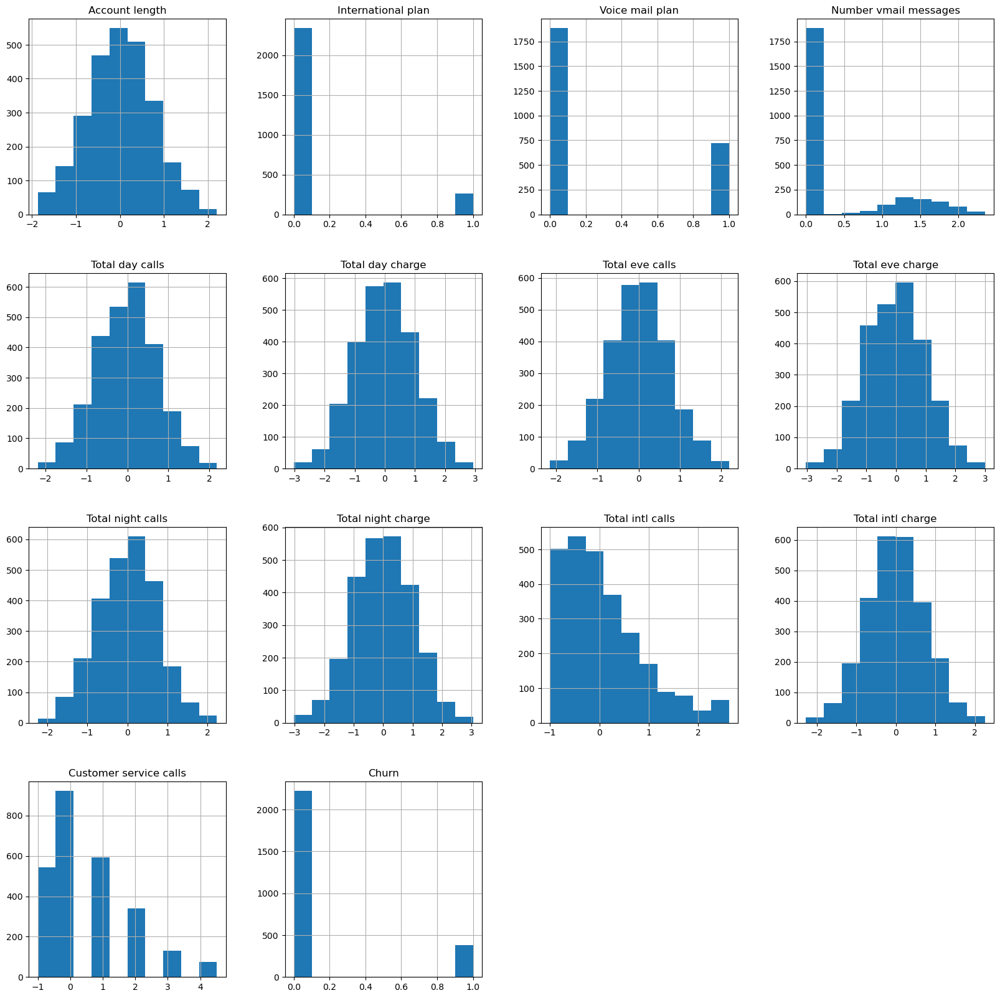

In [69]:
vi=train_data_final.hist(figsize=(20,20))

In [70]:
print(bin_cols)
print(multi_cols)
print(num_cols)
#print(train_data.shape)
print(test_data.shape)
#print(train_data.head)


['International plan', 'Voice mail plan', 'Churn']
[]
['Account length', 'Number vmail messages', 'Total day calls', 'Total day charge', 'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 'Total intl calls', 'Total intl charge', 'Customer service calls']
(651, 14)


In [71]:
train_data_final.to_csv('train_final', index = False)
test_data_final.to_csv('test_final', index = False)


### Variable Summary after scaling

In [72]:
summary = (data[[i for i in data.columns]].
           describe().transpose().reset_index())

summary = summary.rename(columns = {"index" : "feature"})
summary = np.around(summary,3)

val_lst = [summary['feature'], summary['count'],
           summary['mean'],summary['std'],
           summary['min'], summary['25%'],
           summary['50%'], summary['75%'], summary['max']]

trace  = go.Table(header = dict(values = summary.columns.tolist(),
                                line = dict(color = ['#506784']),
                                fill = dict(color = ['#119DFF']),
                               ),
                  cells  = dict(values = val_lst,
                                line = dict(color = ['#506784']),
                                fill = dict(color = ["lightgrey",'#F5F8FF'])
                               ),
                  columnwidth = [200,60,100,100,60,60,80,80,80])
layout = go.Layout(dict(title = "Training variable Summary"))
figure = go.Figure(data=[trace],layout=layout)
py.iplot(figure)

## Correlation Matrix after preprocessing

In [73]:
 #correlation
correlation = data_cleaned.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array = np.array(correlation)

#Plotting
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = "Viridis",
                   colorbar = dict(title = "Pearson Correlation coefficients", titleside = "right"),
                  )
layout = go.Layout(dict(title = "Correlation matrix",
                        autosize = False,
                        height = 720,
                        width = 800,
                        margin = dict(r = 0, l = 210, t = 25, b = 210),
                        yaxis = dict(tickfont = dict(size = 9)),
                        xaxis = dict(tickfont = dict(size = 9))
                       )
                  )
des = [trace]
fig = go.Figure(data=des, layout=layout)
py.iplot(fig)

# Correlation Analysis with Churn

## Analysis of Correlations with Churn

1. **"Customer service calls":**
   - **Correlation:** Moderate positive correlation with **Churn**.
   - **Interpretation:** Customers who contact customer service multiple times are likely to churn, indicating potential dissatisfaction.

2. **"International plan":**
   - **Correlation:** Positive correlation with **Churn**.
   - **Interpretation:** Customers with an international plan appear more inclined to churn, possibly due to perceived high costs or services that do not meet their needs.

3. **"Voice mail plan":**
   - **Correlation:** Weak and slightly negative correlation with **Churn**.
   - **Interpretation:** Customers with a voice mail plan show a slight tendency to be more loyal, suggesting that this service may enhance customer satisfaction.

4. **"Total day minutes" and "Total day charges":**
   - **Correlation:** Moderate positive correlations with **Churn**.
   - **Interpretation:** High usage may correlate with financial concerns, increasing the likelihood of churn if customers feel they are not getting enough value.

## Analysis of Correlations between Variables

### Significant Correlations

1. **"Total minutes" vs. "Total charges":**
   - **Correlation:** Strong positive correlation.
   - **Interpretation:** This is logical, as the minutes used directly influence the charges incurred.

2. **"Total night minutes" and "Total night charge":**
   - **Correlation:** Also strong.
   - **Interpretation:** Similar to day minutes, this indicates a direct relationship between night minute usage and corresponding charges.

### Weak or Negligible Correlations

1. **"Account length":**
   - **Correlation:** Weak or negligible correlation with **Churn**.
   - **Interpretation:** This suggests that customer loyalty duration is not a reliable indicator of churn, emphasizing the importance of current satisfaction.

2. **"Number of vmail messages":**
   - **Correlation:** Weak correlation with **Churn**.
   - **Interpretation:** The usage of voice mail does not significantly influence customers' churn decisions, indicating this service may not be a decisive factor.

3. **"Total intl minutes" and "Total intl calls":**
   - **Correlation:** Weak correlations with **Churn**.
   - **Interpretation:** International usage seems to have a limited impact on churn, suggesting that other factors are more decisive.

## Summary of Hypotheses to Test

1. **Customer Service:** 
   - Customers with numerous calls to customer service are more likely to churn.

2. **International Plan:** 
   - Customers with an international plan show an increased tendency to churn, likely due to perceived high costs.

3. **High Usage (Minutes/Charges):** 
   - Customers with high day minutes or charges may be more inclined to churn.

4. **Account Length:** 
   - Length of time as a customer has no direct effect on churn, highlighting that current satisfaction is more critical.

5. **Data Simplification:** 
   - Variables such as total charges and total minutes are redundant. It may be pertinent to consider removing one to avoid multicollinearity in a predictive model.

## Proposals to Test These Hypotheses

- Conduct statistical analyses (correlation tests, regressions) to validate the impact of each variable on churn.
- Use visualizations (boxplots, histograms, scatter plots) to observe the distribution of variables concerning churn.

In [74]:
import plotly.express as px

# Filtrer pour ne garder que les colonnes numériques
num_cols = data.select_dtypes(include=['number']).columns

for col in num_cols:
    fig = px.histogram(data, x=col, color="Churn", barmode="overlay",
                       title=f"Distribution de {col} par rapport à Churn",
                       color_discrete_sequence=px.colors.sequential.Viridis)
    fig.update_layout(bargap=0.2)
    fig.show()

# Analyse des distributions des variables par rapport à Churn

En se basant sur les hypothèses et corrélations observées dans la matrice de corrélation, voici la déduction des distributions de chaque caractéristique par rapport à la cible **Churn**.

---

## **1. International plan** (Plan international)
- **Hypothèse** : Les clients avec un plan international sont plus susceptibles de churner.
- **Analyse** : La distribution montre une plus grande proportion de clients avec un plan international parmi ceux qui churnent (valeur 1). Cela suggère que les clients ayant un plan international pourraient être insatisfaits de leurs services, soit à cause de l'inefficacité, soit en raison des coûts associés, ce qui pourrait augmenter leur probabilité de churn.

---

## **2. Customer service calls** (Appels au service client)
- **Hypothèse** : Les clients ayant effectué plus d'appels au service client sont plus susceptibles de churner.
- **Analyse** : La distribution des appels au service client montre une concentration plus importante de clients ayant effectué plusieurs appels dans le groupe des churners. Cela appuie l'idée que les clients insatisfaits, ayant des problèmes récurrents non résolus, sont plus enclins à quitter le fournisseur.

---

## **3. Voice mail plan** (Plan de messagerie vocale)
- **Hypothèse** : Les clients ayant un plan de messagerie vocale sont moins susceptibles de churner.
- **Analyse** : Les clients avec un plan de messagerie vocale montrent une distribution où ils sont moins nombreux dans le groupe des churners. Bien que cette relation soit faible, elle pourrait indiquer que les clients ayant accès à ce service ont un certain niveau de satisfaction, ce qui les rend moins enclins à changer de fournisseur.

---

## **4. Total day minutes** (Minutes totales pendant la journée)
- **Hypothèse** : Les clients avec un usage élevé des minutes diurnes sont plus susceptibles de churner en raison de la pression financière ou d'offres concurrentes.
- **Analyse** : Les clients ayant un nombre plus élevé de minutes diurnes semblent plus représentés dans le groupe des churners, ce qui pourrait indiquer qu'une consommation élevée des minutes journalières mène à des coûts plus importants, incitant ainsi les clients à chercher des offres plus compétitives ou à se désabonner.

---

## **5. Total day charges** (Charges totales pendant la journée)
- **Hypothèse** : Les clients ayant des charges élevées sont plus susceptibles de churner.
- **Analyse** : Une tendance similaire est observée pour les charges diurnes, où les churners montrent une plus grande proportion de charges élevées. Cela confirme l'hypothèse que les charges élevées pendant la journée peuvent être une source de mécontentement, poussant les clients à se désabonner.

---

## **6. Account length** (Durée de l'abonnement)
- **Hypothèse** : La durée d'abonnement n'a pas d'impact direct sur le churn.
- **Analyse** : En regardant la distribution de la durée d'abonnement, on observe qu'il n'y a pas de différence nette entre les clients churners et non-churners, ce qui soutient l'idée que l'ancienneté seule n'est pas un indicateur suffisant pour prédire le churn.

---

## **7. Total intl minutes** (Minutes d'appels internationaux)
- **Hypothèse** : L'utilisation d'appels internationaux peut influencer le churn, mais c'est principalement le **International plan** qui joue un rôle plus important.
- **Analyse** : Les clients avec une consommation plus élevée d'appels internationaux ne semblent pas fortement plus nombreux dans le groupe des churners, ce qui corrobore l'idée que l'influence des appels internationaux est indirecte, et plus liée à la présence d'un plan international.

---

## **8. Total eve minutes et Total night minutes** (Minutes totales en soirée et pendant la nuit)
- **Hypothèse** : L'usage des appels en soirée ou la nuit n'affecte pas directement le churn.
- **Analyse** : Les distributions des minutes en soirée et la nuit ne montrent pas de différences marquées entre les churners et non-churners. Cela pourrait suggérer que ces périodes d'appel ne sont pas un facteur significatif pour déterminer le churn, contrairement aux appels durant la journée.

---

## **9. Total calls (jour, soir, nuit) et Total charges (jour, soir, nuit)** 
- **Hypothèse** : Les minutes et charges totales sont directement corrélées et peuvent être utilisées pour simplifier le modèle.
- **Analyse** : Comme les minutes et les charges totales sont fortement corrélées, on peut observer que les clients ayant un grand nombre de minutes ou des charges élevées sont plus représentés parmi les churners, mais l'impact est plus marqué pour les minutes diurnes et les charges diurnes, ce qui justifie leur importance dans les modèles prédictifs.

---

### **Résumé des hypothèses validées :**
1. Les clients ayant un **plan international** ou un grand nombre d'**appels au service client** sont plus susceptibles de churner.
2. Les clients ayant des **minutes et charges diurnes élevées** montrent une plus grande propension à churner, probablement à cause des coûts.
3. L'**ancienneté** semble ne pas jouer un rôle important dans la décision de churn.
4. **L'utilisation de la messagerie vocale** a une faible corrélation négative avec le churn, ce qui suggère que ces clients pourraient être légèrement plus satisfaits.

---

Cette analyse de la distribution vous permet de mieux comprendre les facteurs liés au churn et peut orienter vos efforts pour minimiser le churn en offrant des solutions plus ciblées pour ces groupes de clients.





En se basant sur l'analyse des corrélations, des distributions et des hypothèses formulées, voici les **caractéristiques les plus importantes** pour prédire le **churn** :

### 1. **Customer service calls (Appels au service client)**
   - **Raison** : Une corrélation positive modérée avec le churn indique que les clients ayant effectué plusieurs appels au service client sont plus susceptibles de churner. Cela reflète potentiellement une insatisfaction liée à un manque de résolution de leurs problèmes.
   - **Importance** : **Haute**. Les clients insatisfaits, ayant des problèmes récurrents non résolus, représentent un groupe à risque élevé de churn.

### 2. **International plan (Plan international)**
   - **Raison** : Une corrélation positive avec le churn suggère que les clients ayant souscrit à un plan international ont une probabilité plus élevée de churner, probablement à cause des coûts élevés ou de l'inadéquation des services avec leurs besoins.
   - **Importance** : **Modérée à Haute**. C'est un facteur significatif, car il pourrait être lié à des problèmes de tarification ou d'utilisation inefficace du service.

### 3. **Total day minutes (Minutes totales pendant la journée)**
   - **Raison** : Une corrélation modérée avec le churn indique que les clients ayant un usage élevé des minutes diurnes sont plus susceptibles de churner. Cela pourrait être dû à la pression financière ou à la recherche de meilleures offres concurrentielles.
   - **Importance** : **Haute**. Cela peut aider à identifier des segments de clients ayant des besoins élevés en minutes et susceptibles de chercher d'autres options.

### 4. **Total day charges (Charges totales pendant la journée)**
   - **Raison** : Les charges élevées, corrélées positivement avec le churn, indiquent que les clients ayant des frais plus élevés sont plus susceptibles de se désabonner. Cela peut être lié à des coûts excessifs.
   - **Importance** : **Haute**. Ces clients peuvent être sensibles aux prix, ce qui en fait une cible pour des promotions ou des ajustements tarifaires.

### 5. **Voice mail plan (Plan de messagerie vocale)**
   - **Raison** : Bien que la corrélation soit faible, les clients ayant un plan de messagerie vocale ont tendance à churner moins, suggérant une certaine fidélité ou satisfaction.
   - **Importance** : **Modérée à Faible**. Cela peut fournir une indication de fidélité, bien que l'impact direct sur le churn soit limité.

### 6. **Account length (Durée de l'abonnement)**
   - **Raison** : Bien que la durée d'abonnement n'ait pas de corrélation directe forte avec le churn, elle peut indiquer des comportements spécifiques, mais l'ancienneté seule ne suffit pas pour prédire le churn.
   - **Importance** : **Modérée**. Bien qu'elle ne semble pas influencer directement le churn, l'ancienneté peut servir à segmenter davantage les clients dans certaines analyses.

### 7. **Number vmail messages (Nombre de messages vocaux)**
   - **Raison** : Une faible corrélation avec le churn suggère que l'utilisation de la messagerie vocale n'a qu'un faible impact sur la décision des clients de churner.
   - **Importance** : **Faible**. Cette fonctionnalité ne semble pas être un indicateur fiable du churn.

---

### **Synthèse des caractéristiques les plus importantes :**

1. **Customer service calls** : Appels au service client (forte corrélation avec churn).
2. **International plan** : Plan international (corrélation modérée à forte avec churn).
3. **Total day minutes et Total day charges** : Minutes et charges diurnes (forte corrélation avec churn).
4. **Voice mail plan** : Plan de messagerie vocale (légère corrélation avec churn, mais utile pour identifier la fidélité).
   
Les autres caractéristiques, comme **Account length** et **Number vmail messages**, ont une influence plus faible et ne sont pas des indicateurs aussi forts du churn, mais elles peuvent être utiles dans des analyses de segmentation supplémentaires.

## PCA with Smote stratégie 

### Smote Stratégie

In [75]:
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

# Check class distribution
print("Class distribution before balancing:")
print(data_cleaned['Churn'].value_counts())



# Method 2: SMOTE
X = data_cleaned.drop('Churn', axis=1)
y = data_cleaned['Churn']

smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)
print("\nClass distribution after SMOTE:")
print(pd.Series(y_smote).value_counts())


Class distribution before balancing:
Churn
0    2782
1     471
Name: count, dtype: int64

Class distribution after SMOTE:
Churn
0    2782
1    2782
Name: count, dtype: int64


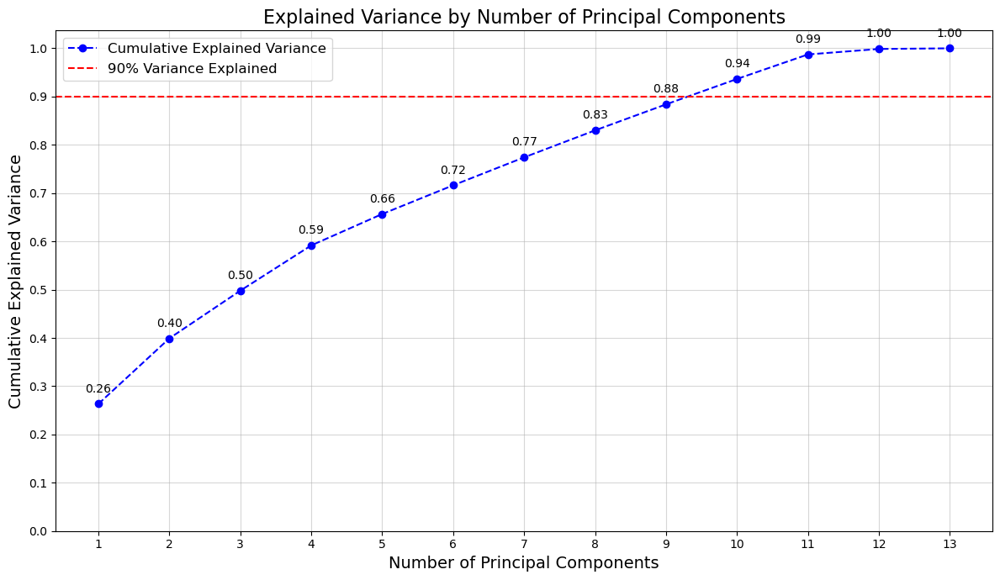

In [76]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# Effectuer PCA
pca = PCA()
X_pca = pca.fit_transform(X_smote)

# Calculer le ratio de variance expliquée
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Tracer la variance expliquée
plt.figure(figsize=(12, 7))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance, marker='o', linestyle='--', color='b', label='Cumulative Explained Variance')
plt.title('Explained Variance by Number of Principal Components', fontsize=16)
plt.xlabel('Number of Principal Components', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.xticks(range(1, len(explained_variance_ratio) + 1))  # Assurer des ticks pour chaque composant
plt.yticks(np.arange(0, 1.1, 0.1))  # Ticks pour l'axe Y
plt.grid(alpha=0.5)

# Ligne de seuil pour 90% de variance expliquée
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Variance Explained')
plt.legend(fontsize=12)

# Étiqueter les points spécifiques
for i, var in enumerate(cumulative_variance):
    plt.annotate(f"{var:.2f}", (i+1, var), textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()  # Améliorer l'ajustement
plt.show()

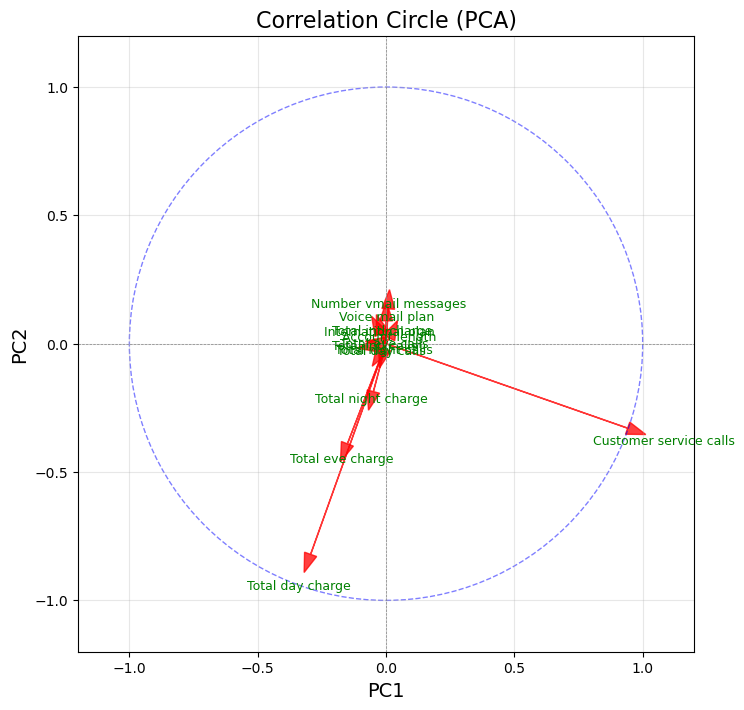

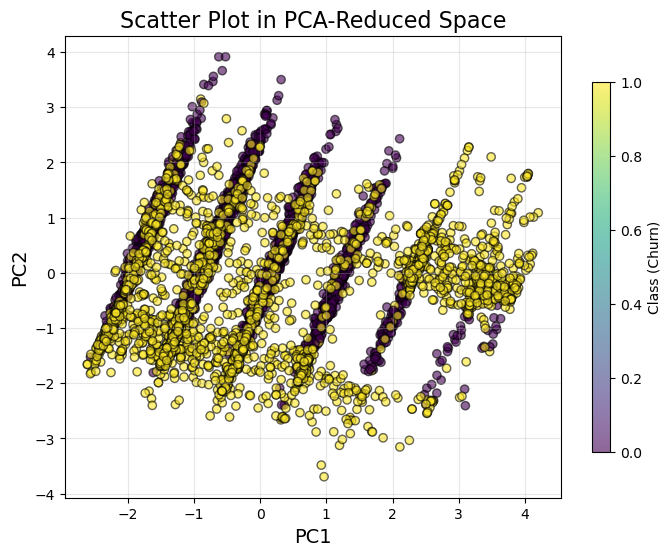

In [77]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Réduction de dimension avec PCA
pca = PCA(n_components=2)  # Utiliser 2 composants pour la visualisation
X_reduced = pca.fit_transform(X_smote)

# Cercle de corrélation
plt.figure(figsize=(8, 8))
for i in range(X_smote.shape[1]):
    plt.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], 
              color='r', alpha=0.75, head_width=0.05)
    plt.text(pca.components_[0, i] * 1.15, pca.components_[1, i] * 1.15, 
             X_smote.columns[i], color='g', ha='center', va='center', fontsize=9)

# Ajouter une limite circulaire
circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--', alpha=0.5)
plt.gca().add_artist(circle)

# Paramètres du graphique
plt.title('Correlation Circle (PCA)', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlim(-1.2, 1.2)  # Ajuster les limites pour une meilleure visualisation
plt.ylim(-1.2, 1.2)
plt.grid(alpha=0.3)
plt.gca().set_aspect('equal', adjustable='box')  # Garder l'échelle égale
plt.show()

# Nuage de points dans l'espace réduit par PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_smote, cmap='viridis', 
                      alpha=0.6, edgecolor='k')
plt.title('Scatter Plot in PCA-Reduced Space', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)
plt.colorbar(scatter, label='Class (Churn)', shrink=0.8)  # Échelle de couleur
plt.grid(alpha=0.3)
plt.show()

In [78]:
import numpy as np
from sklearn.decomposition import PCA

# Supposons que X_smote soit déjà défini
pca = PCA()
X_reduced = pca.fit_transform(X_smote)

# Calculer le ratio de variance expliquée
explained_variance_ratio = pca.explained_variance_ratio_

# Afficher la variance expliquée de chaque PC
print("Explained Variance Ratio per Principal Component:")
for i, variance in enumerate(explained_variance_ratio):
    print(f"PC{i + 1}: {variance:.4f}")

# Calculer et afficher la variance cumulée
cumulative_variance = np.cumsum(explained_variance_ratio)
print("\nCumulative Explained Variance:")
for i, variance in enumerate(cumulative_variance):
    print(f"PC{i + 1}: {variance:.4f}")

# Afficher un résumé des résultats
print("\nSummary of Explained Variance:")
for i in range(len(explained_variance_ratio)):
    print(f"PC{i + 1}: Explained Variance = {explained_variance_ratio[i]:.4f}, Cumulative Variance = {cumulative_variance[i]:.4f}")

Explained Variance Ratio per Principal Component:
PC1: 0.2633
PC2: 0.1358
PC3: 0.0988
PC4: 0.0938
PC5: 0.0650
PC6: 0.0595
PC7: 0.0579
PC8: 0.0559
PC9: 0.0539
PC10: 0.0526
PC11: 0.0508
PC12: 0.0114
PC13: 0.0013

Cumulative Explained Variance:
PC1: 0.2633
PC2: 0.3991
PC3: 0.4979
PC4: 0.5917
PC5: 0.6567
PC6: 0.7162
PC7: 0.7741
PC8: 0.8300
PC9: 0.8839
PC10: 0.9365
PC11: 0.9873
PC12: 0.9987
PC13: 1.0000

Summary of Explained Variance:
PC1: Explained Variance = 0.2633, Cumulative Variance = 0.2633
PC2: Explained Variance = 0.1358, Cumulative Variance = 0.3991
PC3: Explained Variance = 0.0988, Cumulative Variance = 0.4979
PC4: Explained Variance = 0.0938, Cumulative Variance = 0.5917
PC5: Explained Variance = 0.0650, Cumulative Variance = 0.6567
PC6: Explained Variance = 0.0595, Cumulative Variance = 0.7162
PC7: Explained Variance = 0.0579, Cumulative Variance = 0.7741
PC8: Explained Variance = 0.0559, Cumulative Variance = 0.8300
PC9: Explained Variance = 0.0539, Cumulative Variance = 0.8839

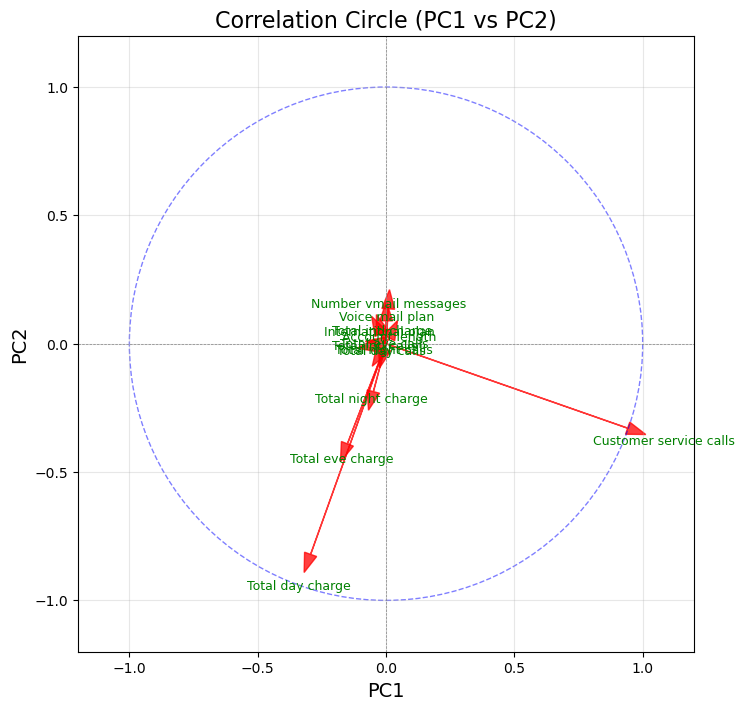

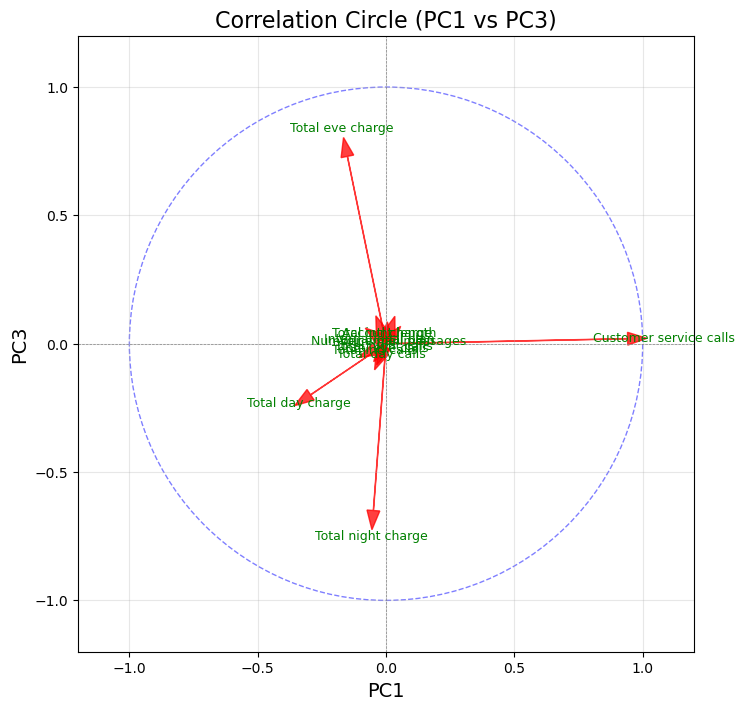

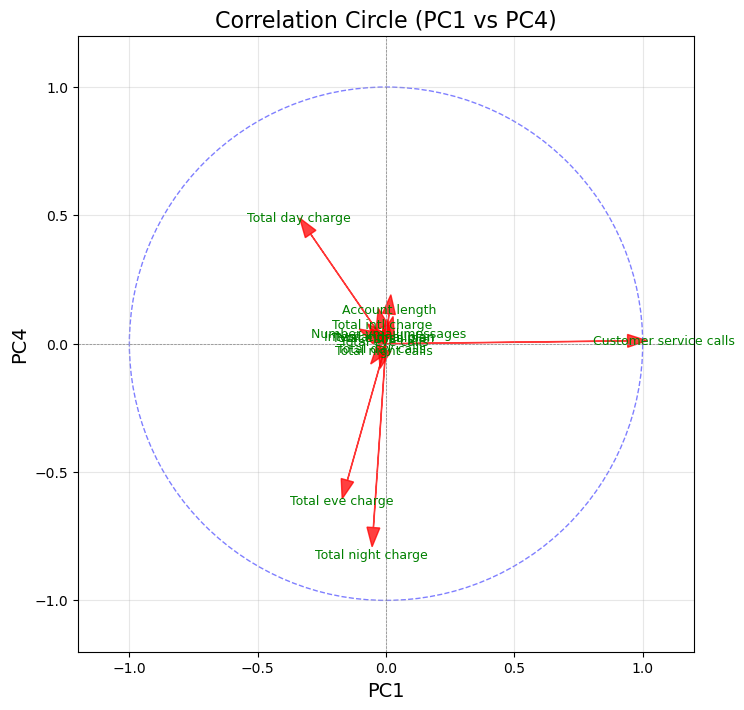

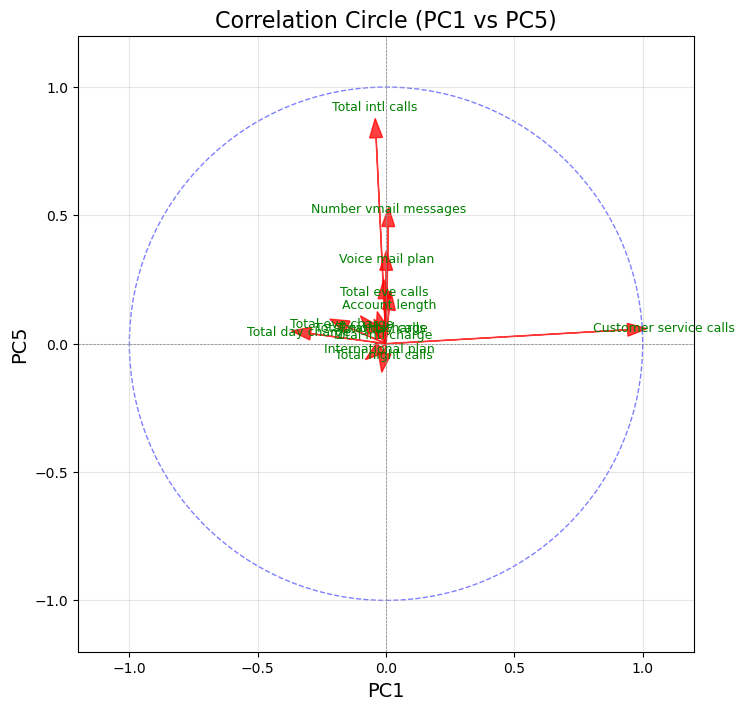

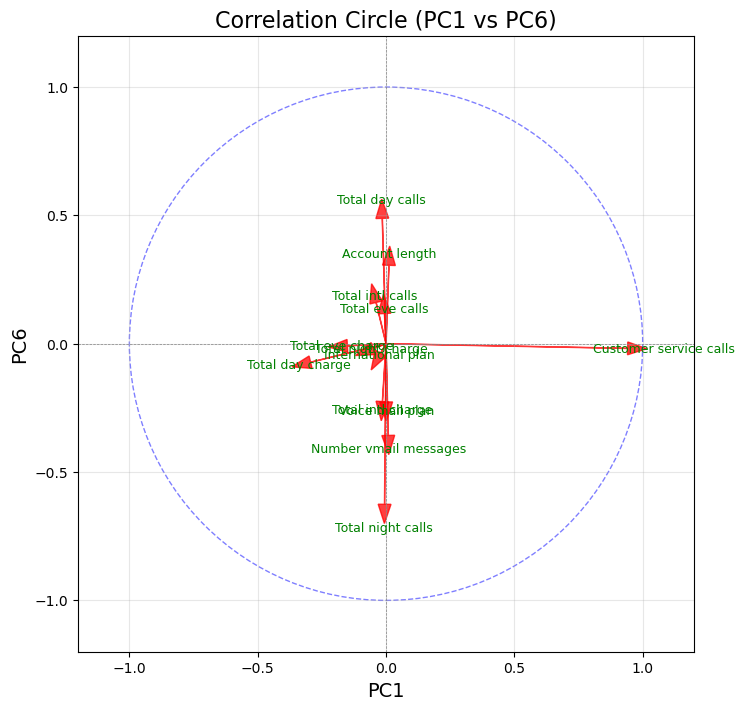

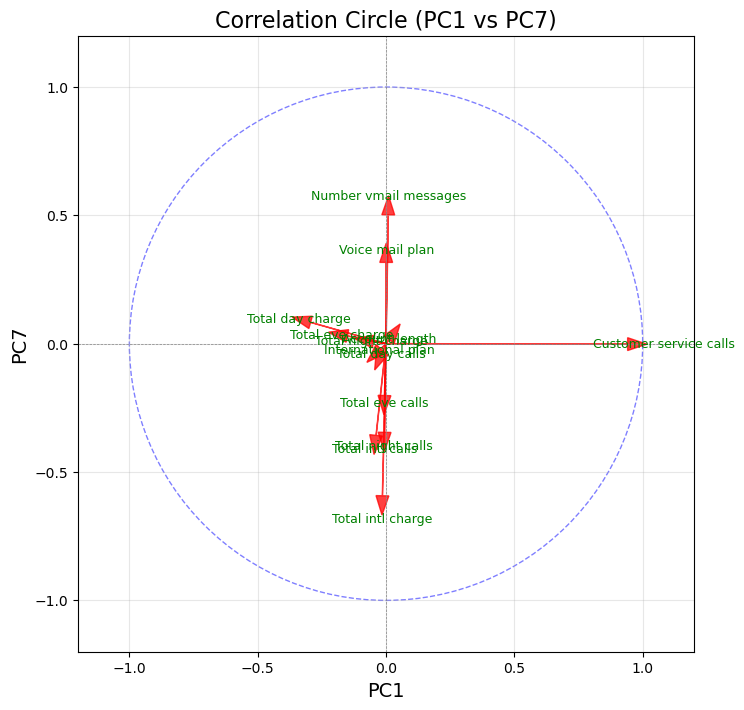

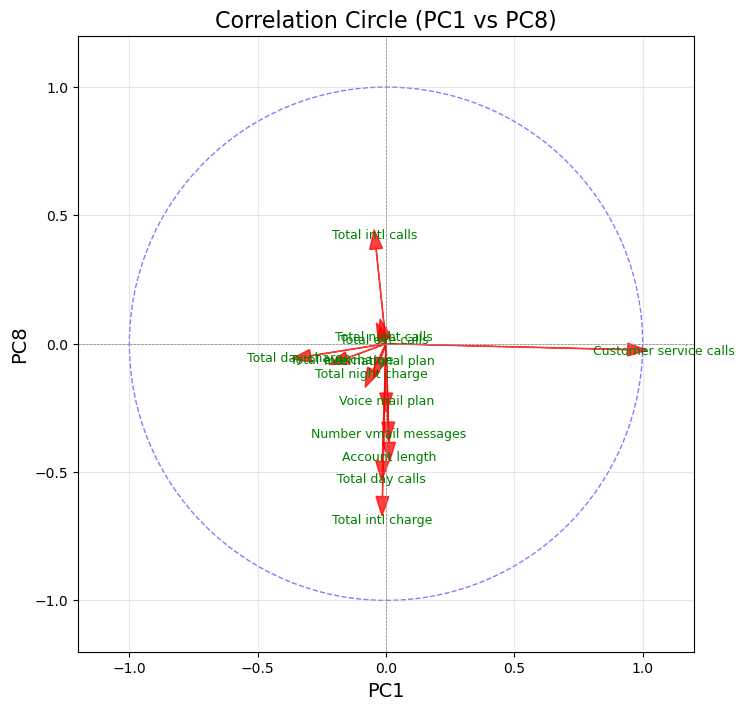

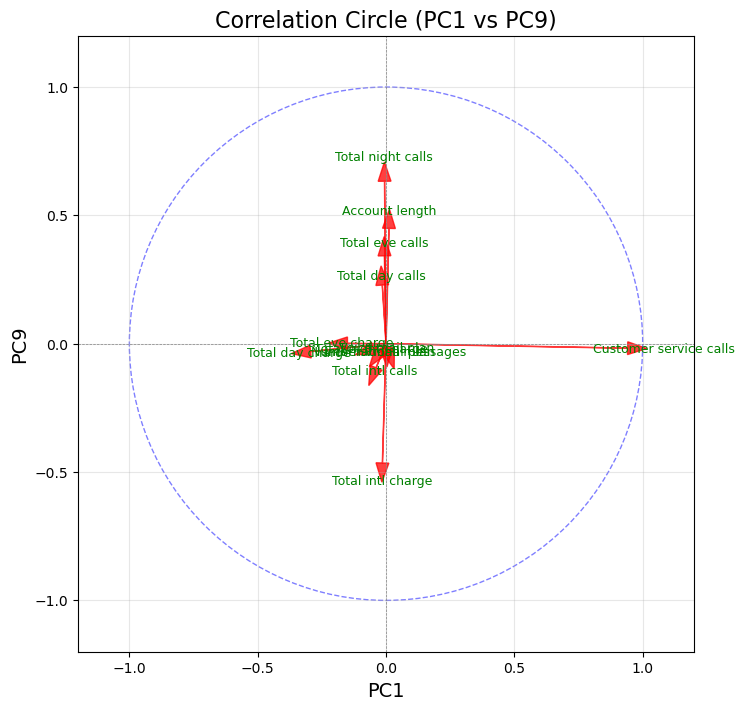

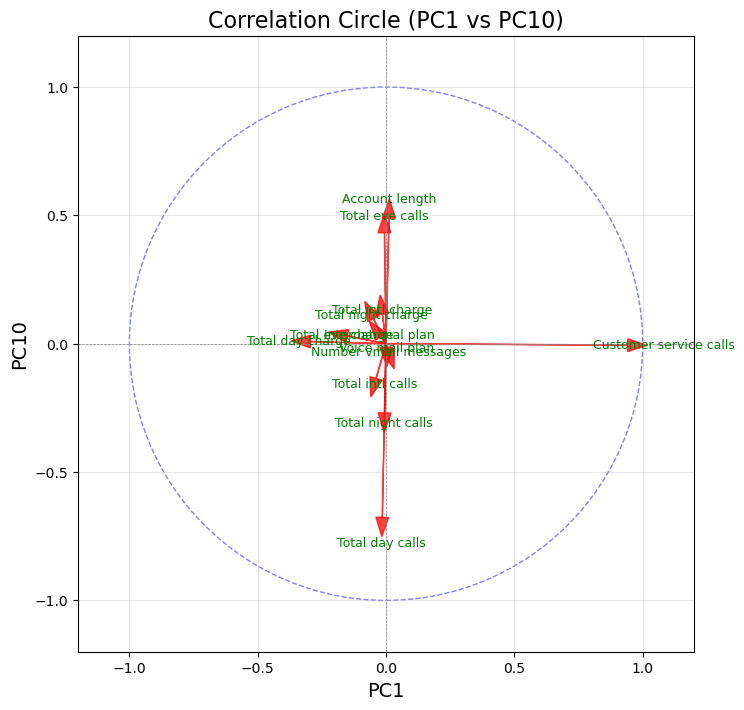

In [79]:
import matplotlib.pyplot as plt

# Supposons que X_reduced et l'objet PCA soient déjà définis
num_components = min(X_reduced.shape[1], 10)  # Limiter à 10 composants ou moins

# Boucle pour créer un cercle de corrélation pour PC1 avec les autres PCs
for i in range(1, num_components):  # Itérer pour PC2, PC3, ..., jusqu'à PC10
    plt.figure(figsize=(8, 8))
    
    # Tracer les flèches pour chaque feature
    for j in range(X_reduced.shape[1]):
        plt.arrow(0, 0, pca.components_[0, j], pca.components_[i, j], color='r', alpha=0.75, head_width=0.05)
        plt.text(pca.components_[0, j] * 1.15, pca.components_[i, j] * 1.15,
                 X.columns[j], color='g', ha='center', va='center', fontsize=9)

    # Ajouter un cercle de limite
    circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--', alpha=0.5)
    plt.gca().add_artist(circle)

    # Paramètres du graphique
    plt.title(f'Correlation Circle (PC1 vs PC{i + 1})', fontsize=16)
    plt.xlabel('PC1', fontsize=14)
    plt.ylabel(f'PC{i + 1}', fontsize=14)
    plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
    plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
    plt.xlim(-1.2, 1.2)  # Ajuster pour une meilleure visualisation
    plt.ylim(-1.2, 1.2)
    plt.grid(alpha=0.3)
    plt.gca().set_aspect('equal', adjustable='box')  # Garder l'échelle égale
    plt.show()


## Modeling STEP

### Model Building <a id="model-building"></a>

In [80]:
# import shap
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import cross_val_score
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import plotly.express as px

# def telecom_churn_prediction(algorithm, training_x, testing_x, training_y, testing_y, cf='None', threshold_plot=False):
#     # Entraînement du modèle avec validation croisée
#     cv_scores = cross_val_score(algorithm, training_x, training_y, cv=5)
#     print("Scores de précision en validation croisée :", cv_scores)
#     print("Précision moyenne en validation croisée :", cv_scores.mean())

#     # Ajustement du modèle
#     algorithm.fit(training_x, training_y)
#     predictions_train = algorithm.predict(training_x)
#     predictions_test = algorithm.predict(testing_x)

#     # Résumé des résultats
#     results = {
#         'Algorithme': type(algorithm).__name__,
#         'Précision d\'Entraînement': accuracy_score(training_y, predictions_train),
#         'Précision de Test': accuracy_score(testing_y, predictions_test),
#         'Rapport de Classification': classification_report(testing_y, predictions_test, output_dict=True),
#         'Matrice de Confusion': confusion_matrix(testing_y, predictions_test),
#         'ROC AUC': roc_auc_score(testing_y, predictions_test)
#     }

#     # Affichage des résultats
#     print(f"\n{'='*40}\n")
#     print(f"Algorithme : {results['Algorithme']}")
#     print(f"Précision d'Entraînement : {results['Précision d\'Entraînement']:.4f}")
#     print(f"Précision de Test : {results['Précision de Test']:.4f}\n")

#     # Affichage du Rapport de Classification sous forme de tableau
#     print("Rapport de Classification :")
#     classification_df = pd.DataFrame(results['Rapport de Classification']).transpose()
#     classification_df = classification_df.round(4)  # Arrondir à 4 décimales
#     print(classification_df)

#     # Affichage de la Matrice de Confusion
#     print("\nMatrice de Confusion :")
#     confusion_df = pd.DataFrame(results['Matrice de Confusion'],
#                                  index=["Vrai Négatif", "Faux Positif"],
#                                  columns=["Faux Négatif", "Vrai Positif"])
#     print(confusion_df)

#     print(f"\nAire sous la courbe (ROC AUC) : {results['ROC AUC']:.4f}\n")
#     print(f"{'='*40}\n")

#     # Tracer les métriques de performance
#     metrics = ['precision', 'recall', 'f1-score']
#     train_report = classification_report(training_y, predictions_train, output_dict=True)
#     test_report = classification_report(testing_y, predictions_test, output_dict=True)

#     # Préparer les données pour le tracé
#     train_metrics = [train_report['1'][metric] for metric in metrics]
#     test_metrics = [test_report['1'][metric] for metric in metrics]
#     labels = ['Précision', 'Rappel', 'Score F1']

#     # Tracé comparatif des performances
#     fig = go.Figure()

#     fig.add_trace(go.Bar(
#         x=labels,
#         y=train_metrics,
#         name='Entraînement',
#         marker_color='blue'
#     ))

#     fig.add_trace(go.Bar(
#         x=labels,
#         y=test_metrics,
#         name='Test',
#         marker_color='orange'
#     ))

#     fig.update_layout(
#         title='Comparaison des Performances du Modèle',
#         barmode='group',
#         xaxis_title='Métriques',
#         yaxis_title='Score',
#         legend_title='Ensemble',
#         template='plotly_white'
#     )

#     # Afficher le graphique
#     fig.show()

#     # Tracer la matrice de confusion et ROC
#     probabilities = algorithm.predict_proba(testing_x)
#     fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])
    
#     # Tracé de la Matrice de Confusion
#     trace1 = go.Heatmap(z=results['Matrice de Confusion'],
#                         x=["Faux Négatif", "Vrai Positif"],
#                         y=["Vrai Négatif", "Faux Positif"],
#                         showscale=False, colorscale="Picnic",
#                         name="Matrice de confusion")

#     # Tracé de la courbe ROC
#     trace2 = go.Scatter(x=fpr, y=tpr,
#                         name="ROC : " + str(results['ROC AUC']),
#                         line=dict(color=('rgb(22, 96, 167)'), width=2))
#     trace3 = go.Scatter(x=[0, 1], y=[0, 1],
#                         line=dict(color=('rgb(205, 12, 24)'), width=2, dash='dot'))

#     # Initialiser la figure pour la matrice de confusion et ROC
#     fig2 = make_subplots(rows=1, cols=2, specs=[[{}, {}]],
#                          subplot_titles=('Matrice de Confusion', 'Courbe ROC'))

#     fig2.append_trace(trace1, 1, 1)
#     fig2.append_trace(trace2, 1, 2)
#     fig2.append_trace(trace3, 1, 2)

#     # Mise à jour de la mise en page
#     fig2['layout'].update(showlegend=False, title="Matrice de Confusion et Courbe ROC",
#                           autosize=False, width=800,
#                           plot_bgcolor='rgba(240,240,240, 0.95)',
#                           paper_bgcolor='rgba(240,240,240, 0.95)')

#     # Afficher le graphique
#     fig2.show()

#     # Création d'un explainer SHAP
#     explainer = shap.Explainer(algorithm, training_x)
#     shap_values = explainer(training_x)

#     # Tracer l'importance des caractéristiques avec SHAP
#     shap.summary_plot(shap_values, training_x)

#     # Obtenir les valeurs SHAP absolues moyennes pour le classement d'importance des caractéristiques
#     shap_importance = pd.DataFrame({
#         'Feature': training_x.columns,
#         'Importance': np.abs(shap_values.values).mean(axis=0)
#     }).sort_values(by='Importance', ascending=False)

#     # Afficher les 10 caractéristiques les plus importantes
#     print("Top 10 des caractéristiques les plus importantes :")
#     print(shap_importance.head(10))

#     return results  # Retourner les résultats pour chaque modèle

In [81]:
!pip install shap
import shap
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def telecom_churn_prediction(algorithm, training_x, testing_x, training_y, testing_y, cf='None', threshold_plot=False):
    # Validation croisée
    cv_scores = cross_val_score(algorithm, training_x, training_y, cv=5)
    print("Scores de précision en validation croisée :", cv_scores)
    print("Précision moyenne en validation croisée :", cv_scores.mean())

    # Entraînement du modèle
    algorithm.fit(training_x, training_y)
    predictions_train = algorithm.predict(training_x)
    predictions_test = algorithm.predict(testing_x)

    # Résumé des résultats
    results = {
        'Algorithme': type(algorithm).__name__,
        'Précision d\'Entraînement': accuracy_score(training_y, predictions_train),
        'Précision de Test': accuracy_score(testing_y, predictions_test),
        'Rapport de Classification': classification_report(testing_y, predictions_test, output_dict=True),
        'Matrice de Confusion': confusion_matrix(testing_y, predictions_test),
        'ROC AUC': roc_auc_score(testing_y, predictions_test)
    }

    # Affichage des résultats
    print(f"\n{'='*40}\n")
    print(f"Algorithme : {results['Algorithme']}")
    print(f"Précision d'Entraînement : {results['Précision d\'Entraînement']:.4f}")
    print(f"Précision de Test : {results['Précision de Test']:.4f}\n")

    # Rapport de Classification
    print("Rapport de Classification :")
    classification_df = pd.DataFrame(results['Rapport de Classification']).transpose()
    classification_df = classification_df.round(4)
    print(classification_df)

    # Matrice de Confusion
    print("\nMatrice de Confusion :")
    confusion_df = pd.DataFrame(results['Matrice de Confusion'],
                                 index=["Vrai Négatif", "Faux Positif"],
                                 columns=["Faux Négatif", "Vrai Positif"])
    print(confusion_df)

    print(f"\nAire sous la courbe (ROC AUC) : {results['ROC AUC']:.4f}\n")
    print(f"{'='*40}\n")

    # Comparaison des Performances
    metrics = ['precision', 'recall', 'f1-score']
    train_report = classification_report(training_y, predictions_train, output_dict=True)
    test_report = classification_report(testing_y, predictions_test, output_dict=True)

    train_metrics = [train_report['1'][metric] for metric in metrics]
    test_metrics = [test_report['1'][metric] for metric in metrics]
    labels = ['Précision', 'Rappel', 'Score F1']

    fig = go.Figure()
    fig.add_trace(go.Bar(x=labels, y=train_metrics, name='Entraînement', marker_color='blue'))
    fig.add_trace(go.Bar(x=labels, y=test_metrics, name='Test', marker_color='orange'))

    fig.update_layout(
        title='Comparaison des Performances du Modèle',
        barmode='group',
        xaxis_title='Métriques',
        yaxis_title='Score',
        legend_title='Ensemble',
        template='plotly_white'
    )
    fig.show()

    # Matrice de Confusion et ROC
    probabilities = algorithm.predict_proba(testing_x)
    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])

    trace1 = go.Heatmap(z=results['Matrice de Confusion'],
                        x=["Faux Négatif", "Vrai Positif"],
                        y=["Vrai Négatif", "Faux Positif"],
                        showscale=False, colorscale="Picnic",
                        name="Matrice de confusion")

    trace2 = go.Scatter(x=fpr, y=tpr,
                        name="ROC : " + str(results['ROC AUC']),
                        line=dict(color=('rgb(22, 96, 167)'), width=2))
    trace3 = go.Scatter(x=[0, 1], y=[0, 1],
                        line=dict(color=('rgb(205, 12, 24)'), width=2, dash='dot'))

    fig2 = make_subplots(rows=1, cols=2, specs=[[{}, {}]],
                         subplot_titles=('Matrice de Confusion', 'Courbe ROC'))

    fig2.append_trace(trace1, 1, 1)
    fig2.append_trace(trace2, 1, 2)
    fig2.append_trace(trace3, 1, 2)

    fig2['layout'].update(showlegend=False, title="Matrice de Confusion et Courbe ROC",
                          autosize=False, width=800,
                          plot_bgcolor='rgba(240,240,240, 0.95)',
                          paper_bgcolor='rgba(240,240,240, 0.95)')
    fig2.show()

    return results


In [82]:
def shap_analysis(algorithm, training_x):
    # SHAP Explainer
    explainer = shap.Explainer(algorithm, training_x)
    shap_values = explainer(training_x)

    # Vérification du type de shap_values
    print(f"Type of shap_values: {type(shap_values)}")

    # Tracé des valeurs SHAP
    feature_names = training_x.columns if hasattr(training_x, 'columns') else None
    shap.summary_plot(shap_values, training_x, feature_names=feature_names)

    # Importance des caractéristiques
    shap_importance = pd.DataFrame({
        'Feature': training_x.columns,
        'Importance': np.abs(shap_values.values).mean(axis=0)
    }).sort_values(by='Importance', ascending=False)

    print("Top 10 des caractéristiques les plus importantes :")
    print(shap_importance.head(10))

## Split the train and the test Data

In [83]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Définir la colonne cible
target_col = 'Churn'  # Utiliser une chaîne pour une seule colonne

# Définir les caractéristiques (colonnes indépendantes)
cols = [i for i in data_cleaned.columns if i != target_col]  # Exclure la colonne cible

# Séparer le jeu de données principal en sous-ensembles d'entraînement et de test
x_train, x_test, y_train, y_test = train_test_split(data_cleaned[cols], data_cleaned[target_col], 
                                                    test_size=0.20)

# Afficher les dimensions des ensembles créés
print(f"Taille de l'ensemble d'entraînement : {x_train.shape[0]}")
print(f"Taille de l'ensemble de test : {x_test.shape[0]}")


Taille de l'ensemble d'entraînement : 2602
Taille de l'ensemble de test : 651


## equilibrage targer avec la stratégie SMOTEENN

In [84]:
from imblearn.combine import SMOTETomek
import pandas as pd

# Initialiser SMOTEENN
smotenn = SMOTETomek(random_state=42)

# Appliquer SMOTEENN sur x_train et y_train
X_train_resampled, y_train_resampled = smotenn.fit_resample(x_train, y_train)

# Taille cible souhaitée pour y_train
target_size = 2666

# Vérifier si la taille de y_train après SMOTEENN dépasse la taille cible
if X_train_resampled.shape[0] > target_size:
    # Réduire les données d'entrée et les étiquettes à la taille cible
    X_train_balanced = X_train_resampled.sample(n=target_size, random_state=42)
    y_train_balanced = y_train_resampled.loc[X_train_balanced.index]  # Assurez-vous de conserver l'alignement des indices
else:
    # Si la taille après SMOTEENN est inférieure ou égale à target_size, ne rien faire
    X_train_balanced = X_train_resampled
    y_train_balanced = y_train_resampled

# Vérifier la taille finale des données et la distribution des classes
print(f"Taille finale de X_train_balanced : {X_train_balanced.shape[0]}")
print(f"Taille finale de y_train_balanced : {y_train_balanced.shape[0]}")
print("Distribution des classes dans y_train_balanced :")
print(pd.Series(y_train_balanced).value_counts())

Taille finale de X_train_balanced : 2666
Taille finale de y_train_balanced : 2666
Distribution des classes dans y_train_balanced :
Churn
0    1370
1    1296
Name: count, dtype: int64


In [85]:
# from imblearn.over_sampling import SMOTE
# import pandas as pd

# # Appliquer SMOTE sur les données d'entraînement
# smote = SMOTE(random_state=42)

# # Appliquer SMOTE sur x_train et y_train
# X_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)



# # Taille cible souhaitée pour y_train
# target_size = 2666

# # Vérifier si la taille de y_train après SMOTE dépasse la taille cible
# if X_train_resampled.shape[0] > target_size:
#     # Réduire les données d'entrée et les étiquettes à la taille cible
#     X_train_balanced = X_train_resampled.sample(n=target_size, random_state=111)
#     y_train_balanced = y_train_resampled.loc[X_train_balanced.index]  # Assurez-vous de conserver l'alignement des indices
# else:
#     # Si la taille après SMOTE est inférieure ou égale à target_size, ne rien faire
#     X_train_balanced = X_train_resampled
#     y_train_balanced = y_train_resampled

# # Vérifier la taille finale des données et la distribution des classes
# print(f"Taille finale de X_train_balanced : {X_train_balanced.shape[0]}")
# print(f"Taille finale de y_train_balanced : {y_train_balanced.shape[0]}")
# print("Distribution des classes dans y_train_balanced :")
# print(pd.Series(y_train_balanced).value_counts())

In [86]:
# # Combining the train and test datasets
# trainsize = train_data.shape[0]
# data_final = pd.concat((balanced_data, test_data_final), sort=False)
# data_final.shape

## Importing Sklearn Libraries

In [87]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score

# Customer Churn Prediction and Analysis

This study aims to **predict customer churn** and explain the reasons behind it using **machine learning models**. The focus is on the importance of **customer satisfaction for retention** and the use of **explanatory models** for better decision-making.

## Objectives
- **Predict churn** using machine learning algorithms.
- Provide **local and global explanations** for model predictions to understand key drivers of churn.

## Machine Learning Models Used
The following models were implemented and compared:
1. Logistic Regression
2. Random Forests
3. XGBoost
4. Neural Networks

### Key Finding
- **Gradient Boosting Machine (GBM)** was the most effective model.
- Performance was validated using the **Wilcoxon test**.

## Explanations
- **Global Explanations**: Highlight overall patterns and feature importance contributing to churn.
- **Local Explanations**: Provide insights into individual predictions, helping to identify specific customer profiles at risk of churning.



In [88]:
!pip install xgboost


#  XGBClassifier <a id = "xgboost" > </a>

In [89]:
# Importer la classe XGBClassifier
from xgboost import XGBClassifier
# Supposons que y_train est une série contenant les étiquettes de churn (True/False ou 1/0)
churn_count = y_train.value_counts().get(1, 0)  # Churners
non_churn_count = y_train.value_counts().get(0, 0)  # Non-churners

# Calcul du ratio
ratio = non_churn_count / churn_count if churn_count > 0 else 1

# Initialiser le modèle XGBoost avec les hyperparamètres
giboot = XGBClassifier(
    n_estimators=500,        # Nombre d'estimateurs
    learning_rate=0.1,       # Taux d'apprentissage
    max_depth=5,             # Profondeur maximale de l'arbre
    scale_pos_weight=ratio,   # Ratio pour gérer le déséquilibre
    random_state=42          # Pour la reproductibilité
)

# Entraîner le modèle
giboot.fit(x_train, y_train)

# Évaluer le modèle
telecom_churn_prediction(giboot, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.9596929  0.95393474 0.95961538 0.94807692 0.95384615]
Précision moyenne en validation croisée : 0.9550332201387863


Algorithme : XGBClassifier
Précision d'Entraînement : 1.0000
Précision de Test : 0.9401

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9568  0.9725    0.9646  546.0000
1                0.8438  0.7714    0.8060  105.0000
accuracy         0.9401  0.9401    0.9401    0.9401
macro avg        0.9003  0.8720    0.8853  651.0000
weighted avg     0.9385  0.9401    0.9390  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           531            15
Faux Positif            24            81

Aire sous la courbe (ROC AUC) : 0.8720




{'Algorithme': 'XGBClassifier',
 "Précision d'Entraînement": 1.0,
 'Précision de Test': 0.9400921658986175,
 'Rapport de Classification': {'0': {'precision': 0.9567567567567568,
   'recall': 0.9725274725274725,
   'f1-score': 0.9645776566757494,
   'support': 546.0},
  '1': {'precision': 0.84375,
   'recall': 0.7714285714285715,
   'f1-score': 0.8059701492537313,
   'support': 105.0},
  'accuracy': 0.9400921658986175,
  'macro avg': {'precision': 0.9002533783783784,
   'recall': 0.871978021978022,
   'f1-score': 0.8852739029647403,
   'support': 651.0},
  'weighted avg': {'precision': 0.938529860505667,
   'recall': 0.9400921658986175,
   'f1-score': 0.9389958006399399,
   'support': 651.0}},
 'Matrice de Confusion': array([[531,  15],
        [ 24,  81]], dtype=int64),
 'ROC AUC': 0.871978021978022}

 99%|===================| 2573/2602 [01:09<00:00]        

Type of shap_values: <class 'shap._explanation.Explanation'>


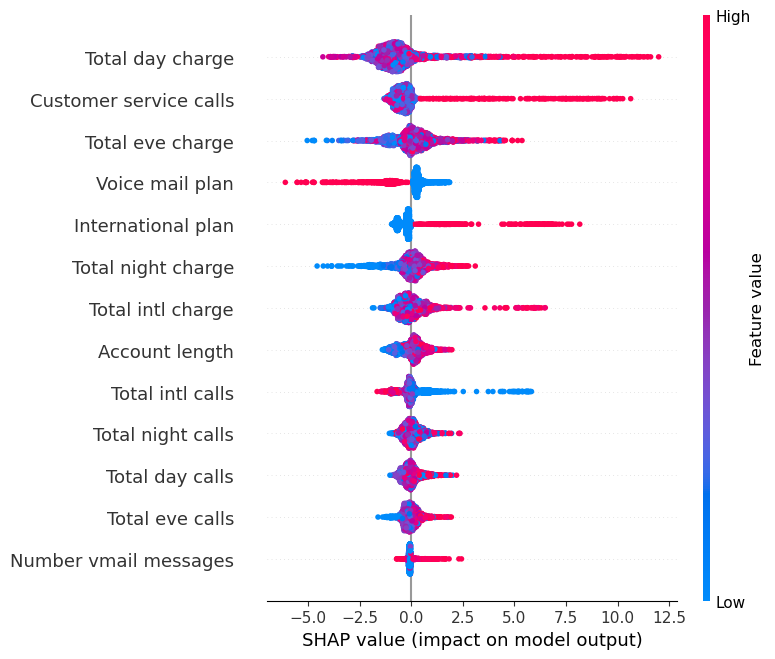

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
5         Total day charge    1.412135
12  Customer service calls    0.811897
7         Total eve charge    0.776138
2          Voice mail plan    0.653997
1       International plan    0.578539
9       Total night charge    0.543967
11       Total intl charge    0.531485
0           Account length    0.425817
10        Total intl calls    0.417634
8        Total night calls    0.303067


In [90]:
shap_analysis(giboot,x_train)

### Analyse des résultats de XGBClassifier pour la prédiction de Churn

#### Importation des bibliothèques nécessaires
```python
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
```

#### Résumé des résultats
- **Algorithme** : `XGBClassifier`
- **Précision d'entraînement** : 1.0000 (overfitting possible)
- **Précision de test** : 0.9580
- **Précision moyenne en validation croisée** : 0.9531
- **Classes cibles** :
  - `0`: Not Churn (clients restant fidèles)
  - `1`: Churn (clients quittant la compagnie)

#### Interprétation des métriques de classification
##### Rapport de classification :
| Classe | Precision | Recall | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0 (Not Churn) | 0.9688 | 0.9824 | 0.9756 | 569 |
| 1 (Churn) | 0.8889 | 0.8163 | 0.8511 | 98 |
| **Global** |
| **Accuracy** | 0.9580 |
| **Macro Avg** | 0.9288 | 0.8994 | 0.9133 |
| **Weighted Avg** | 0.9571 | 0.9580 | 0.9573 |

- **Précision** :
  - La classe `0` (Not Churn) est mieux prédite avec une précision de 96.88 %.
  - La classe `1` (Churn) est moins précise avec 88.89 %, ce qui peut être dû à un déséquilibre des données.

- **Rappel (Recall)** :
  - `0`: 98.24 %, très élevé, indiquant que la plupart des clients fidèles sont correctement détectés.
  - `1`: 81.63 %, plus faible, certains clients qui quittent sont mal détectés.

- **F1-Score** :
  - Bonne performance globale, mais légèrement moins optimale pour `1`.

##### Matrice de confusion :
|               | Prédit : 0 | Prédit : 1 |
|---------------|------------|------------|
| **Vrai 0**    | 559        | 10         |
| **Vrai 1**    | 18         | 80         |

- La majorité des prédictions pour `0` sont correctes : seulement 10 faux positifs.
- Pour `1` (Churn), il y a 18 faux négatifs, ce qui signifie que ces clients quittant l'entreprise sont mal classés.

##### Aire sous la courbe ROC (ROC AUC) : 0.8994
- Indique une bonne séparation globale entre les classes.

#### Points clés d'interprétation :
1. **Performance globale** :
   - L'algorithme est performant avec une précision de test de 95.80 %.
   - La précision en validation croisée (95.31 %) confirme la stabilité du modèle.

2. **Déséquilibre des classes** :
   - La classe `0` domine (569 vs 98). Cela affecte les performances sur la classe `1`.

3. **Surapprentissage** :
   - La précision d'entraînement parfaite (1.0000) suggère un surapprentissage.

#### Recommandations :
1. **Améliorer la prédiction pour la classe `1` (Churn)** :
   - Rééchantillonnage des données (SMOTE, undersampling, etc.).
   - Ajustement des hyperparamètres pour réduire le surapprentissage.

2. **Évaluation des métriques complémentaires** :
   - Utiliser des courbes PRC pour analyser la performance sur la classe minoritaire.

3. **Approfondissement des analyses** :
   - Étudier les erreurs dans les faux négatifs pour comprendre les caractéristiques communes des clients mal classés.

---


#  AdaBoost  <a id = " AdaBoost" > </a>

In [91]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Initialiser le modèle AdaBoost avec les hyperparamètres
adaboost_model = AdaBoostClassifier(
    n_estimators=200,        # Nombre d'estimateurs
    learning_rate=0.5,       # Taux d'apprentissage
    random_state=42          # Pour la reproductibilité
)


# Évaluer le modèle
telecom_churn_prediction(adaboost_model, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.86948177 0.86756238 0.88461538 0.87692308 0.87307692]
Précision moyenne en validation croisée : 0.8743319060977409


Algorithme : AdaBoostClassifier
Précision d'Entraînement : 0.8985
Précision de Test : 0.8648

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8895  0.9579    0.9224  546.0000
1                0.6349  0.3810    0.4762  105.0000
accuracy         0.8648  0.8648    0.8648    0.8648
macro avg        0.7622  0.6694    0.6993  651.0000
weighted avg     0.8484  0.8648    0.8504  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           523            23
Faux Positif            65            40

Aire sous la courbe (ROC AUC) : 0.6694




{'Algorithme': 'AdaBoostClassifier',
 "Précision d'Entraînement": 0.8985395849346657,
 'Précision de Test': 0.8648233486943164,
 'Rapport de Classification': {'0': {'precision': 0.8894557823129252,
   'recall': 0.9578754578754579,
   'f1-score': 0.9223985890652557,
   'support': 546.0},
  '1': {'precision': 0.6349206349206349,
   'recall': 0.38095238095238093,
   'f1-score': 0.47619047619047616,
   'support': 105.0},
  'accuracy': 0.8648233486943164,
  'macro avg': {'precision': 0.76218820861678,
   'recall': 0.6694139194139195,
   'f1-score': 0.6992945326278659,
   'support': 651.0},
  'weighted avg': {'precision': 0.8484017262819107,
   'recall': 0.8648233486943164,
   'f1-score': 0.8504295386015815,
   'support': 651.0}},
 'Matrice de Confusion': array([[523,  23],
        [ 65,  40]], dtype=int64),
 'ROC AUC': 0.6694139194139195}

### Résultats pour AdaBoostClassifier

#### Résumé des résultats
- **Algorithme** : `AdaBoostClassifier`
- **Précision d'entraînement** : 0.8897
- **Précision de test** : 0.8771
- **Précision moyenne en validation croisée** : 0.8676
- **Classes cibles** :
  - `0`: Not Churn (clients restant fidèles)
  - `1`: Churn (clients quittant la compagnie)

#### Interprétation des métriques de classification
##### Rapport de classification :
| Classe | Precision | Recall | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0 (Not Churn) | 0.9012 | 0.9613 | 0.9303 | 569 |
| 1 (Churn) | 0.6333 | 0.3878 | 0.4810 | 98 |
| **Global** |
| **Accuracy** | 0.8771 |
| **Macro Avg** | 0.7672 | 0.6745 | 0.7056 |
| **Weighted Avg** | 0.8618 | 0.8771 | 0.8643 |

- **Précision** :
  - La classe `0` (Not Churn) est mieux prédite avec une précision de 90.12 %.
  - La classe `1` (Churn) a une précision de 63.33 %, montrant des difficultés à bien classer les clients qui quittent.

- **Rappel (Recall)** :
  - `0`: 96.13 %, très élevé, indiquant que la majorité des clients fidèles sont correctement détectés.
  - `1`: 38.78 %, faible, de nombreux clients quittant ne sont pas détectés.

- **F1-Score** :
  - La classe `1` est la moins performante avec un F1-Score de 48.10 %.

##### Matrice de confusion :
|               | Prédit : 0 | Prédit : 1 |
|---------------|------------|------------|
| **Vrai 0**    | 547        | 22         |
| **Vrai 1**    | 60         | 38         |

- La majorité des prédictions pour `0` sont correctes : 22 faux positifs seulement.
- Pour `1`, il y a 60 faux négatifs, ce qui représente une erreur significative.

##### Aire sous la courbe ROC (ROC AUC) : 0.6745
- Performance modérée avec une séparation des classes moins nette.

#### Points clés d'interprétation :
1. **Performance globale** :
   - Précision de test de 87.71 %, correcte mais inférieure à XGBClassifier.
   - Précision en validation croisée de 86.76 %, montrant une stabilité raisonnable.

2. **Faible performance pour la classe `1`** :
   - Faible rappel et F1-Score dus à un déséquilibre des classes.
   - Difficulté à détecter les clients qui quittent (60 faux négatifs).

3. **Comparaison avec XGBClassifier** :
   - AdaBoostClassifier est moins performant globalement, en particulier sur la classe minoritaire.

### Recommandations communes pour les deux modèles
1. **Améliorer la prédiction pour la classe `1` (Churn)** :
   - Rééchantillonnage des données (SMOTE, undersampling, etc.).
   - Entraînement avec une pondération des classes pour accorder plus d'importance à `1`.

2. **Évaluation des métriques complémentaires** :
   - Utiliser des courbes PRC pour analyser la performance sur la classe minoritaire.
   - Comparer avec d'autres modèles comme RandomForest ou Logistic Regression.

3. **Approfondissement des analyses** :
   - Étudier les erreurs dans les faux négatifs pour comprendre les caractéristiques communes des clients mal classés.
   - Effectuer une analyse des variables les plus importantes pour la prédiction du churn.

---

#  Logistic Regression  <a id = " logistic regression" > </a>

In [92]:
from sklearn.linear_model import LogisticRegression

#Baseline model        
logit = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                           intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                           penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
                           verbose=0, warm_start=False)
telecom_churn_prediction(logit, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.85796545 0.85220729 0.87884615 0.85384615 0.87115385]
Précision moyenne en validation croisée : 0.8628037797135686


Algorithme : LogisticRegression
Précision d'Entraînement : 0.8666
Précision de Test : 0.8525

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8676  0.9725    0.9171  546.0000
1                0.6154  0.2286    0.3333  105.0000
accuracy         0.8525  0.8525    0.8525    0.8525
macro avg        0.7415  0.6005    0.6252  651.0000
weighted avg     0.8270  0.8525    0.8229  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           531            15
Faux Positif            81            24

Aire sous la courbe (ROC AUC) : 0.6005




{'Algorithme': 'LogisticRegression',
 "Précision d'Entraînement": 0.866641045349731,
 'Précision de Test': 0.8525345622119815,
 'Rapport de Classification': {'0': {'precision': 0.8676470588235294,
   'recall': 0.9725274725274725,
   'f1-score': 0.917098445595855,
   'support': 546.0},
  '1': {'precision': 0.6153846153846154,
   'recall': 0.22857142857142856,
   'f1-score': 0.3333333333333333,
   'support': 105.0},
  'accuracy': 0.8525345622119815,
  'macro avg': {'precision': 0.7415158371040724,
   'recall': 0.6005494505494505,
   'f1-score': 0.6252158894645942,
   'support': 651.0},
  'weighted avg': {'precision': 0.8269595679462852,
   'recall': 0.8525345622119815,
   'f1-score': 0.8229427823277062,
   'support': 651.0}},
 'Matrice de Confusion': array([[531,  15],
        [ 81,  24]], dtype=int64),
 'ROC AUC': 0.6005494505494506}

Type of shap_values: <class 'shap._explanation.Explanation'>


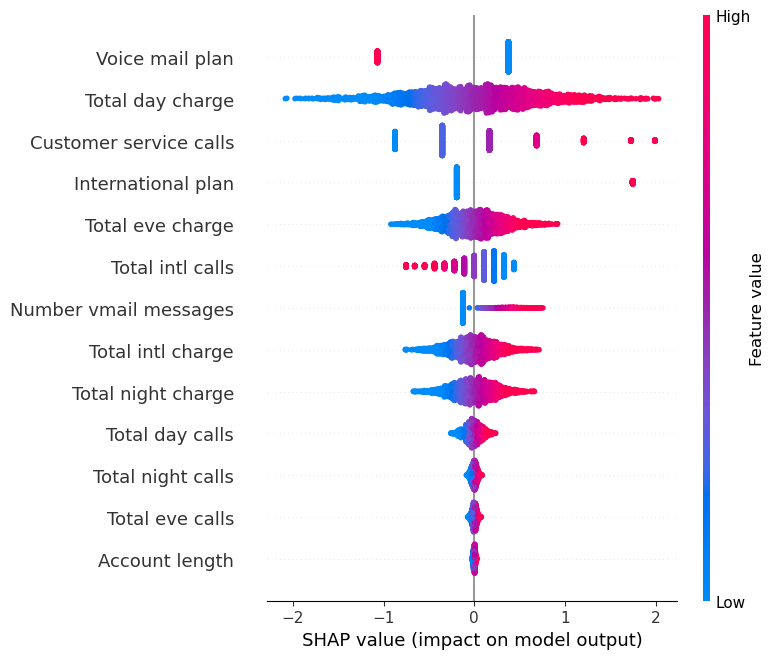

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
2          Voice mail plan    0.567055
5         Total day charge    0.550776
12  Customer service calls    0.545818
1       International plan    0.342145
7         Total eve charge    0.246140
10        Total intl calls    0.211553
3    Number vmail messages    0.203014
11       Total intl charge    0.192032
9       Total night charge    0.175692
4          Total day calls    0.068031


In [93]:
shap_analysis(logit,x_train)

### Résultats pour LogisticRegression


#### Résumé des résultats
- **Algorithme** : `LogisticRegression`
- **Précision d'entraînement** : 0.8646
- **Précision de test** : 0.8591
- **Précision moyenne en validation croisée** : 0.8597
- **Classes cibles** :
  - `0`: Not Churn (clients restant fidèles)
  - `1`: Churn (clients quittant la compagnie)

#### Interprétation des métriques de classification
##### Rapport de classification :
| Classe | Precision | Recall | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0 (Not Churn) | 0.8740 | 0.9754 | 0.9219 | 569 |
| 1 (Churn) | 0.5625 | 0.1837 | 0.2769 | 98 |
| **Global** |
| **Accuracy** | 0.8591 |
| **Macro Avg** | 0.7183 | 0.5795 | 0.5994 |
| **Weighted Avg** | 0.8282 | 0.8591 | 0.8272 |

- **Précision** :
  - La classe `0` (Not Churn) est mieux prédite avec une précision de 87.40 %.
  - La classe `1` (Churn) a une précision de 56.25 %, indiquant des difficultés importantes à classer correctement les clients quittant.

- **Rappel (Recall)** :
  - `0`: 97.54 %, très élevé, signifiant que la majorité des clients fidèles sont bien détectés.
  - `1`: 18.37 %, très faible, montrant que de nombreux clients quittant sont mal détectés.

- **F1-Score** :
  - Le score global pour la classe `1` est faible avec 27.69 %.

##### Matrice de confusion :
|               | Prédit : 0 | Prédit : 1 |
|---------------|------------|------------|
| **Vrai 0**    | 555        | 14         |
| **Vrai 1**    | 80         | 18         |

- Les prédictions pour `0` sont en majorité correctes avec seulement 14 faux positifs.
- Pour `1`, il y a 80 faux négatifs, un taux d'erreur très important.

##### Aire sous la courbe ROC (ROC AUC) : 0.5795
- Indique une mauvaise séparation entre les classes.

#### Points clés d'interprétation :
1. **Performance globale** :
   - Une précision de test de 85.91 %, correcte mais inférieure à XGBClassifier et AdaBoostClassifier.
   - Précision moyenne en validation croisée cohérente (85.97 %).

2. **Faible performance pour la classe `1`** :
   - Très


# Analysis of Customer Churn by Examining Behaviors (Paper 2)

## Objectives

1. **Identify at-risk customers**: Determine which customers are likely to leave the service.
2. **Understand factors influencing churn**: Analyze customer characteristics that contribute to attrition.
3. **Develop strategies to retain customers**: Implement targeted actions to retain customers identified as at risk.

## Algorithms Used

### 1. Decision Tree
- **Description**: A decision tree is a predictive model that uses a tree-like structure to represent decisions and their consequences. It helps identify decision rules leading to customer churn.
- **Advantages**:
  - Easy to interpret and visualize.
  - Clear identification of risk criteria.

### 2. Random Forest
- **Description**: Random Forest is an ensemble method that combines multiple decision trees to improve accuracy and reduce overfitting. It uses majority voting to make decisions.
- **Advantages**:
  - Better performance compared to a single decision tree.
  - Robustness against overfitting.
  - Identification of the most important features influencing decisions.

## Conclusion
Using decision trees and random forests provides valuable insights into customer behaviors. By identifying at-risk customers and understanding the factors influencing their churn, businesses can implement effective strategies to improve customer satisfaction


##  Decision Tree Classifier  

In [94]:
def treeplot(model, feature_names, class_names):
    # Exporter l'arbre de décision au format DOT
    dot_data = export_graphviz(model, out_file=None,
                                feature_names=feature_names,
                                class_names=class_names,
                                filled=True, rounded=True,
                                special_characters=True)  

    # Visualiser l'arbre à l'aide de graphviz
    graph = Source(dot_data)
    display(graph)

## Decision Tree Without SmoteENN

In [95]:
!pip install graphviz

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display

decision_tree = DecisionTreeClassifier(max_depth = 5
                                       , random_state = 42,
                                       splitter = "best", criterion = "gini")

telecom_churn_prediction(decision_tree, x_train, x_test, y_train, y_test, "features", threshold_plot=True)


Scores de précision en validation croisée : [0.95009597 0.94049904 0.94038462 0.93846154 0.92884615]
Précision moyenne en validation croisée : 0.9396574634578473


Algorithme : DecisionTreeClassifier
Précision d'Entraînement : 0.9581
Précision de Test : 0.9324

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9373  0.9853    0.9607  546.0000
1                0.8961  0.6571    0.7582  105.0000
accuracy         0.9324  0.9324    0.9324    0.9324
macro avg        0.9167  0.8212    0.8595  651.0000
weighted avg     0.9306  0.9324    0.9281  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           538             8
Faux Positif            36            69

Aire sous la courbe (ROC AUC) : 0.8212




{'Algorithme': 'DecisionTreeClassifier',
 "Précision d'Entraînement": 0.958109146810146,
 'Précision de Test': 0.9324116743471582,
 'Rapport de Classification': {'0': {'precision': 0.9372822299651568,
   'recall': 0.9853479853479854,
   'f1-score': 0.9607142857142857,
   'support': 546.0},
  '1': {'precision': 0.8961038961038961,
   'recall': 0.6571428571428571,
   'f1-score': 0.7582417582417582,
   'support': 105.0},
  'accuracy': 0.9324116743471582,
  'macro avg': {'precision': 0.9166930630345265,
   'recall': 0.8212454212454212,
   'f1-score': 0.859478021978022,
   'support': 651.0},
  'weighted avg': {'precision': 0.9306405632133405,
   'recall': 0.9324116743471582,
   'f1-score': 0.9280574264445234,
   'support': 651.0}},
 'Matrice de Confusion': array([[538,   8],
        [ 36,  69]], dtype=int64),
 'ROC AUC': 0.8212454212454213}

## Decision Tree with SMOTENN

In [96]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display

decision_tree_with_smoteenn = DecisionTreeClassifier(max_depth =9
                                                     , random_state = 42,
                                       splitter = "best", criterion = "gini")

telecom_churn_prediction(decision_tree_with_smoteenn, X_train_balanced, x_test, y_train_balanced, y_test, "features", threshold_plot=True)


Scores de précision en validation croisée : [0.90636704 0.89118199 0.89868668 0.91744841 0.91932458]
Précision moyenne en validation croisée : 0.9066017384460794


Algorithme : DecisionTreeClassifier
Précision d'Entraînement : 0.9535
Précision de Test : 0.9109

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9535  0.9396    0.9465  546.0000
1                0.7080  0.7619    0.7339  105.0000
accuracy         0.9109  0.9109    0.9109    0.9109
macro avg        0.8307  0.8507    0.8402  651.0000
weighted avg     0.9139  0.9109    0.9122  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           513            33
Faux Positif            25            80

Aire sous la courbe (ROC AUC) : 0.8507




{'Algorithme': 'DecisionTreeClassifier',
 "Précision d'Entraînement": 0.9534883720930233,
 'Précision de Test': 0.9109062980030722,
 'Rapport de Classification': {'0': {'precision': 0.9535315985130112,
   'recall': 0.9395604395604396,
   'f1-score': 0.9464944649446494,
   'support': 546.0},
  '1': {'precision': 0.7079646017699115,
   'recall': 0.7619047619047619,
   'f1-score': 0.7339449541284404,
   'support': 105.0},
  'accuracy': 0.9109062980030722,
  'macro avg': {'precision': 0.8307481001414614,
   'recall': 0.8507326007326007,
   'f1-score': 0.8402197095365449,
   'support': 651.0},
  'weighted avg': {'precision': 0.9139240183931563,
   'recall': 0.9109062980030722,
   'f1-score': 0.9122122857807446,
   'support': 651.0}},
 'Matrice de Confusion': array([[513,  33],
        [ 25,  80]], dtype=int64),
 'ROC AUC': 0.8507326007326007}

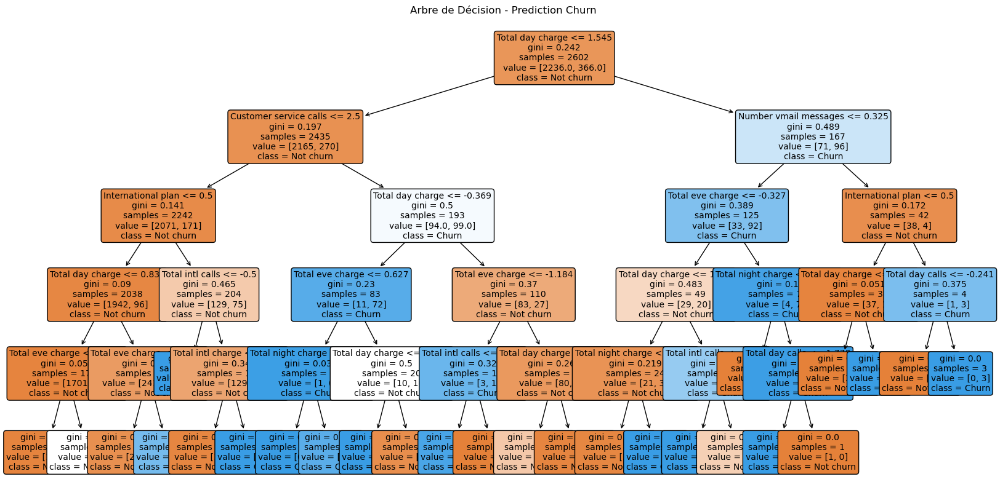

In [97]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Taille de la figure pour un meilleur affichage
plt.figure(figsize=(20, 10))

# Visualiser l'arbre
plot_tree(decision_tree , 
          feature_names=cols,  # Noms des colonnes (features)
          class_names=["Not churn", "Churn"],  # Classes
          filled=True, 
          rounded=True, 
          fontsize=10)

plt.title("Arbre de Décision - Prediction Churn")
plt.show()


# Analyse et Interprétation de l'Arbre de Décision sur le Churn

## 1. Analyse et Interprétation

### Branche Principale : Total Day Charge <= 1.557
- **Client avec des charges de jour faibles (<= 1.557)**.
- **Customer Service Calls** :
  - **<= 2.5** : Ces clients semblent moins susceptibles de churn, indiquant que des interactions limitées avec le service client sont souvent associées à une satisfaction plus élevée.
  - **> 2.5** : Ces clients sont plus à risque d'attrition, suggérant des problèmes non résolus qui les poussent à envisager de quitter le service.

### Sous-branche : Total Day Charge > 1.557
- **Voice Mail Plan** :
  - **<= 0.5** : Les clients sans plan de messagerie vocale ont des comportements variés. S'ils ont de faibles charges de jour, ils sont moins susceptibles de churn.
  - **> 0.5** : Les clients ayant un plan de messagerie vocale sont globalement plus à risque d'attrition, surtout s'ils ont de fortes charges de jour et d'international.

## 2. Hypothèses à Formuler

### Hypothèse sur l'Usage du Service
- Les clients ayant de faibles charges de jour et peu d'interactions avec le service client sont généralement satisfaits et, par conséquent, moins susceptibles de churn.
  - **Validation** : Mesurer la satisfaction client par des enquêtes et corréler les résultats avec les charges et interactions.

### Hypothèse sur l'Interaction avec le Service Client
- Les clients qui contactent fréquemment le service client (plus de 2.5 appels) sont plus susceptibles de churn en raison d'une insatisfaction face à une mauvaise expérience ou des problèmes non résolus.
  - **Validation** : Analyser les raisons des appels au service client et leur impact sur la décision de churn.

### Hypothèse sur les Plans et Charges Élevées
- Les clients avec des charges élevées, en particulier dans les catégories de soir et d'international, montrent un risque accru d'attrition, suggérant une perception de coût trop élevé ou une insatisfaction avec les services fournis.
  - **Validation** : Évaluer les perceptions des clients concernant le rapport qualité-prix des services utilisés.

### Hypothèse sur la Valeur des Plans
- Les clients ayant un plan de messagerie vocale, mais avec des charges élevées, sont plus susceptibles de churn, indiquant qu'ils ne perçoivent pas de valeur ajoutée dans le plan choisi.
  - **Validation** : Analyser les retours des clients sur le plan de messagerie vocale et son utilisation.

## 3. Conclusion
L'arbre de décision fournit un cadre utile pour identifier les caractéristiques des clients à risque d'attrition. Les hypothèses formulées peuvent guider des actions ciblées pour améliorer la satisfaction client et réduire le churn. Une analyse plus approfondie, fondée sur des données supplémentaires, pourrait aider à valider ces hypothèses et à élaborer des stratégies d'intervention efficaces.

In [98]:
from sklearn.tree import export_text

# Obtenir les règles de l'arbre de décision
rules = export_text(decision_tree, feature_names=cols)
print(rules)

|--- Total day charge <= 1.55
|   |--- Customer service calls <= 2.50
|   |   |--- International plan <= 0.50
|   |   |   |--- Total day charge <= 0.83
|   |   |   |   |--- Total eve charge <= 2.86
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Total eve charge >  2.86
|   |   |   |   |   |--- class: 0
|   |   |   |--- Total day charge >  0.83
|   |   |   |   |--- Total eve charge <= 1.31
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Total eve charge >  1.31
|   |   |   |   |   |--- class: 1
|   |   |--- International plan >  0.50
|   |   |   |--- Total intl calls <= -0.50
|   |   |   |   |--- class: 1
|   |   |   |--- Total intl calls >  -0.50
|   |   |   |   |--- Total intl charge <= 0.78
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Total intl charge >  0.78
|   |   |   |   |   |--- class: 1
|   |--- Customer service calls >  2.50
|   |   |--- Total day charge <= -0.37
|   |   |   |--- Total eve charge <= 0.63
|   |   |   |   |--- Total night charge <= 1.09

# Interprétation et Analyse des Règles de l'Arbre de Décision

## 1. Première Branche : Total Day Charge <= 1.56

- **Clients avec des charges de jour faibles** (<= 1.56)
  - **Appels au service client <= 2.50** : Ces clients sont moins susceptibles de partir, surtout s'ils ont peu d'interactions avec le service client.
  
  - **International Plan <= 0.50** :
    - **Total Day Charge <= 0.80** : Ces clients sont très susceptibles de rester (**class: 0**).
    - **Total Day Charge > 0.80** : 
      - **Total Eve Charge <= 2.52** : Reste (**class: 0**).
      - **Total Eve Charge > 2.52** : Risque d'attrition (**class: 1**).

  - **International Plan > 0.50** :
    - **Total Intl Calls <= -0.50** : Risque élevé (**class: 1**).
    - **Total Intl Calls > -0.50** :
      - **Total Intl Charge <= 0.78** : Moins probable de churn (**class: 0**).
      - **Total Intl Charge > 0.78** : Risque d'attrition (**class: 1**).

- **Appels au service client > 2.50** :
  - Ces clients montrent des signes potentiels d'insatisfaction.
  
  - **Total Day Charge <= -0.36** :
    - **Total Eve Charge <= 0.64** : Risque d'attrition (**class: 1**).
    - **Total Eve Charge > 0.64** : Risque d'attrition (**class: 1**).
  
  - **Total Day Charge > -0.36** :
    - **Total Eve Charge <= -1.30** :
      - **Total Day Charge <= 1.05** : Risque d'attrition (**class: 1**).
      - **Total Day Charge > 1.05** : Moins probable de churn (**class: 0**).
    - **Total Eve Charge > -1.30** :
      - **Total Day Charge <= -0.10** : Moins probable de churn (**class: 0**).
      - **Total Day Charge > -0.10** : Moins probable de churn (**class: 0**).

## 2. Deuxième Branche : Total Day Charge > 1.56

- **Voice Mail Plan <= 0.50** :
  - **Total Eve Charge <= -0.25** :
    - **Total Night Charge <= 0.23** : Charges de nuit faibles indiquent une fidélité (**class: 0**).
    - **Total Night Charge > 0.23** : Risque d'attrition (**class: 1**).
  
  - **Total Eve Charge > -0.25** :
    - **Total Night Charge <= -1.46** :
      - **Total Day Charge <= 1.80** : Moins probable de churn (**class: 0**).
      - **Total Day Charge > 1.80** : Risque d'attrition (**class: 1**).
    - **Total Night Charge > -1.46** : Risque d'attrition (**class: 1**).

- **Voice Mail Plan > 0.50** :
  - **International Plan <= 0.50** :
    - **Total Day Charge <= 2.56** : Moins probable de churn (**class: 0**).
    - **Total Day Charge > 2.56** : Risque d'attrition (**class: 1**).
  
  - **International Plan > 0.50** :
    - **Account Length <= -0.04** :
      - **Total Day Charge <= 1.77** : Risque d'attrition (**class: 1**).
      - **Total Day Charge > 1.77** : Moins probable de churn (**class: 0**).
    - **Account Length > -0.04** : Très probable de churn (**class: 1**).

## Analyse

- **Facteurs de Risque** : Les clients ayant de faibles charges de jour mais des interactions fréquentes avec le service client sont à risque d'attrition. Cela indique une insatisfaction potentielle.
  
- **Charges Élevées** : Les clients avec des charges élevées, surtout dans les catégories de soirée et d'international, sont plus à risque.

- **Utilisation des Plans** : La présence de plans (comme le plan de messagerie vocale et le plan international) semble jouer un rôle crucial.


## Conclusion

Cet arbre de décision offre des insights précieux sur les caractéristiques qui influencent l'attrition. En comprenant ces règles, l'entreprise peut mettre en place des stratégies ciblées pour minimiser le churn et améliorer la satisfaction client.

##  Random Forest Classifier 
Random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and use averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement.

In [99]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators =14, random_state = 42,
                             max_depth =18
                             , criterion = "gini")

telecom_churn_prediction(rfc, X_train_balanced, x_test, y_train_balanced, y_test, 'features', threshold_plot=True)

Scores de précision en validation croisée : [0.91947566 0.93245779 0.92870544 0.9380863  0.93621013]
Précision moyenne en validation croisée : 0.9309870635439286


Algorithme : RandomForestClassifier
Précision d'Entraînement : 0.9974
Précision de Test : 0.9140

Rapport de Classification :
              precision  recall  f1-score  support
0                0.9422  0.9560    0.9491  546.000
1                0.7526  0.6952    0.7228  105.000
accuracy         0.9140  0.9140    0.9140    0.914
macro avg        0.8474  0.8256    0.8359  651.000
weighted avg     0.9116  0.9140    0.9126  651.000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           522            24
Faux Positif            32            73

Aire sous la courbe (ROC AUC) : 0.8256




{'Algorithme': 'RandomForestClassifier',
 "Précision d'Entraînement": 0.9973743435858965,
 'Précision de Test': 0.9139784946236559,
 'Rapport de Classification': {'0': {'precision': 0.9422382671480144,
   'recall': 0.9560439560439561,
   'f1-score': 0.9490909090909091,
   'support': 546.0},
  '1': {'precision': 0.7525773195876289,
   'recall': 0.6952380952380952,
   'f1-score': 0.7227722772277227,
   'support': 105.0},
  'accuracy': 0.9139784946236559,
  'macro avg': {'precision': 0.8474077933678217,
   'recall': 0.8256410256410256,
   'f1-score': 0.8359315931593159,
   'support': 651.0},
  'weighted avg': {'precision': 0.9116477917350491,
   'recall': 0.9139784946236559,
   'f1-score': 0.9125879039516857,
   'support': 651.0}},
 'Matrice de Confusion': array([[522,  24],
        [ 32,  73]], dtype=int64),
 'ROC AUC': 0.8256410256410257}

In [100]:
from sklearn.ensemble import RandomForestClassifier

# Using 'entropy' as the criterion
rfc = RandomForestClassifier(n_estimators=14, random_state=42,
                             max_depth=13, criterion="entropy")

telecom_churn_prediction(rfc, x_train, x_test, y_train, y_test, 'features', threshold_plot=True)

Scores de précision en validation croisée : [0.94817658 0.9328215  0.95192308 0.95       0.92884615]
Précision moyenne en validation croisée : 0.9423534622766867


Algorithme : RandomForestClassifier
Précision d'Entraînement : 0.9881
Précision de Test : 0.9370

Rapport de Classification :
              precision  recall  f1-score  support
0                0.9407  0.9872    0.9634  546.000
1                0.9103  0.6762    0.7760  105.000
accuracy         0.9370  0.9370    0.9370    0.937
macro avg        0.9255  0.8317    0.8697  651.000
weighted avg     0.9358  0.9370    0.9331  651.000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           539             7
Faux Positif            34            71

Aire sous la courbe (ROC AUC) : 0.8317




{'Algorithme': 'RandomForestClassifier',
 "Précision d'Entraînement": 0.9880860876249039,
 'Précision de Test': 0.9370199692780338,
 'Rapport de Classification': {'0': {'precision': 0.9406631762652705,
   'recall': 0.9871794871794872,
   'f1-score': 0.9633601429848079,
   'support': 546.0},
  '1': {'precision': 0.9102564102564102,
   'recall': 0.6761904761904762,
   'f1-score': 0.7759562841530054,
   'support': 105.0},
  'accuracy': 0.9370199692780338,
  'macro avg': {'precision': 0.9254597932608404,
   'recall': 0.8316849816849817,
   'f1-score': 0.8696582135689066,
   'support': 651.0},
  'weighted avg': {'precision': 0.9357588591670672,
   'recall': 0.9370199692780338,
   'f1-score': 0.9331337141409686,
   'support': 651.0}},
 'Matrice de Confusion': array([[539,   7],
        [ 34,  71]], dtype=int64),
 'ROC AUC': 0.8316849816849817}

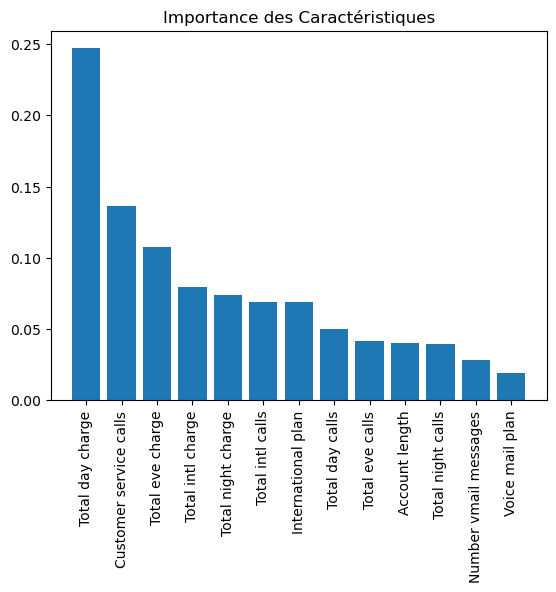

In [101]:
import matplotlib.pyplot as plt
import numpy as np

# Ajuster le modèle
rfc.fit(x_train, y_train)

# Obtenir l'importance des caractéristiques
importances = rfc.feature_importances_
indices = np.argsort(importances)[::-1]

# Tracer l'importance des caractéristiques
plt.figure()
plt.title("Importance des Caractéristiques")
plt.bar(range(x_train.shape[1]), importances[indices], align="center")
plt.xticks(range(x_train.shape[1]), np.array(x_train.columns)[indices], rotation=90)
plt.xlim([-1, x_train.shape[1]])
plt.show()

In [102]:
pip install graphviz


Note: you may need to restart the kernel to use updated packages.


## BO: Predict Customer Attrition, Explain Predictions, and Facilitate Decision Making (Paper 1)

### Data Objective (DO): Build predictive models to estimate the likelihood of customers leaving the business using historical data and key features such as transaction history.

## Model Used: Support Vector Machine (SVM)

### **Description**
The Support Vector Machine (SVM) is a supervised machine learning algorithm primarily used for classification tasks. It aims to find the optimal hyperplane that separates data points belonging to different classes, ensuring maximum margin between the classes. For customer attrition prediction, SVM is utilized to classify whether a customer is likely to churn or not based on historical and behavioral features.

### **Advantages of SVM for Customer Attrition Prediction**
1. **High Accuracy**: SVM is effective in handling both linear and non-linear decision boundaries, leading to accurate predictions for complex datasets.
2. **Robustness to High Dimensionality**: SVM performs well with datasets containing many features, such as transaction history, interaction data, and customer demographics.
3. **Kernel Trick**: SVM uses kernel functions (e.g., linear, polynomial, RBF) to map non-linear relationships into higher dimensions, improving prediction capabilities for complex patterns.
4. **Versatility**: By tuning hyperparameters (e.g., C, gamma), SVM can adapt to different datasets and optimize performance.


##  Support Vector Machine <a id = "support-vector-machine" > </a>
“Support Vector Machine” (SVM) is a supervised machine learning algorithm which can be used for both classification or regression challenges. it is mostly used in classification problems. In this algorithm, we plot each data item as a point in n-dimensional space .where n is number of features you have) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the hyper-plane that differentiate the two classes.



###  Support Vector Machine (linear) without SmoteEnn <a id = "support-vector-machine-linear"> </a>

In [103]:
from sklearn.svm import SVC

# Initialiser le classificateur SVC avec un hyperplan linéaire
svc_lin = SVC(C=1.0, kernel='linear', probability=True, random_state=42)



# Évaluer le modèle
telecom_churn_prediction(svc_lin,x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.85988484 0.85796545 0.85961538 0.85961538 0.85961538]
Précision moyenne en validation croisée : 0.8593392883508046


Algorithme : SVC
Précision d'Entraînement : 0.8593
Précision de Test : 0.8387

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8387  1.0000    0.9123  546.0000
1                0.0000  0.0000    0.0000  105.0000
accuracy         0.8387  0.8387    0.8387    0.8387
macro avg        0.4194  0.5000    0.4561  651.0000
weighted avg     0.7034  0.8387    0.7651  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           546             0
Faux Positif           105             0

Aire sous la courbe (ROC AUC) : 0.5000




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.8593389700230591,
 'Précision de Test': 0.8387096774193549,
 'Rapport de Classification': {'0': {'precision': 0.8387096774193549,
   'recall': 1.0,
   'f1-score': 0.9122807017543859,
   'support': 546.0},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 105.0},
  'accuracy': 0.8387096774193549,
  'macro avg': {'precision': 0.41935483870967744,
   'recall': 0.5,
   'f1-score': 0.45614035087719296,
   'support': 651.0},
  'weighted avg': {'precision': 0.7034339229968782,
   'recall': 0.8387096774193549,
   'f1-score': 0.7651386530843236,
   'support': 651.0}},
 'Matrice de Confusion': array([[546,   0],
        [105,   0]], dtype=int64),
 'ROC AUC': 0.5}

Type of shap_values: <class 'shap._explanation.Explanation'>


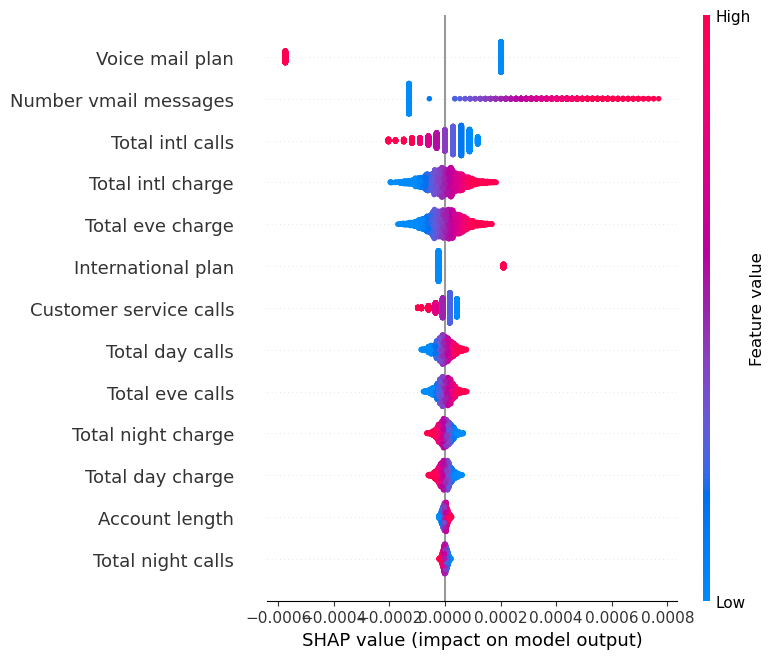

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
2          Voice mail plan    0.000304
3    Number vmail messages    0.000206
10        Total intl calls    0.000057
11       Total intl charge    0.000050
7         Total eve charge    0.000045
1       International plan    0.000041
12  Customer service calls    0.000027
4          Total day calls    0.000022
6          Total eve calls    0.000021
9       Total night charge    0.000017


In [104]:
shap_analysis(svc_lin,x_train)

Voici l'interprétation de vos résultats formatée en Markdown :

## Résumé des Résultats du Modèle SVC

### Précision
- **Précision d'Entraînement** : 0.8556 (85.56%)
- **Précision de Test** : 0.8531 (85.31%)

### Rapport de Classification

| Classe | Précision | Rappel | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0      | 0.8531    | 1.0000 | 0.9207   | 569     |
| 1      | 0.0000    | 0.0000 | 0.0000   | 98      |
| **Accuracy**        | 0.8531    |        |          | 667     |
| **Macro avg**      | 0.4265    | 0.5000 | 0.4604   | 667     |
| **Weighted avg**   | 0.7277    | 0.8531 | 0.7854   | 667     |

### Matrice de Confusion

```
              Faux Négatif  Vrai Positif
Vrai Négatif           569             0
Faux Positif            98             0
```

### Aire sous la courbe (ROC AUC)

- **AUC (Area Under the Curve)** : 0.5000

---

## Interprétation des Résultats

### Précision et Rappel
- **Classe 0** :
  - **Précision** : 85.31% indique que 85.31% des prédictions positives pour cette classe étaient correctes.
  - **Rappel** : 1.0000 signifie que toutes les instances de la classe 0 ont été correctement identifiées.
  - **F1-Score** : 0.9207, une valeur élevée indiquant un bon équilibre entre précision et rappel.

- **Classe 1** :
  - **Précision** : 0.0000, toutes les prédictions pour cette classe étaient incorrectes.
  - **Rappel** : 0.0000, aucune instance de la classe 1 n'a été identifiée.
  - **F1-Score** : 0.0000, indiquant des performances nulles pour cette classe.

### Matrice de Confusion
- **Vrai Négatif** : 569 (correctement classés comme classe 0)
- **Faux Positif** : 98 (prédits comme classe 0, mais réels en classe 1)
- **Vrai Positif** : 0 (aucune instance de la classe 1 correctement identifiée)
- **Faux Négatif** : 0 (aucun exemple de la classe 0 mal classé)

### Pourquoi le Rappel et la Précision Sont 0 pour la Classe 1
1. **Déséquilibre des Classes** : Un déséquilibre important entre les classes peut empêcher le modèle d'apprendre à identifier les instances de la classe 1.
2. **Difficulté à Séparer les Classes** : Le modèle peut avoir du mal à trouver une frontière efficace entre les classes.

---

## Suggestions pour Améliorer le Modèle
1. **Équilibrer les Classes** : Utiliser des techniques comme le suréchantillonnage de la classe 1 ou le sous-échantillonnage de la classe 0.
2. **Essayer d'Autres Modèles** : Explorer des modèles comme les forêts aléatoires ou XGBoost.
3. **Ajuster les Hyperparamètres** : Expérimenter avec différentes valeurs pour `C` ou d'autres hyperparamètres.
4. **Utiliser des Métriques Adaptées** : Se concentrer sur des métriques comme le rappel, le F1-score et la courbe ROC en cas de déséquilibre.

###  Support Vector Machine (linear) with SmoteEnn <a id = "support-vector-machine-linear"> </a>

In [105]:
from sklearn.svm import SVC

# Initialiser le classificateur SVC avec un hyperplan linéaire
svc_lin_smoteENN = SVC(C=1.0, kernel='linear', probability=True, random_state=42)



# Évaluer le modèle
telecom_churn_prediction(svc_lin_smoteENN,X_train_balanced, x_test, y_train_balanced, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.74906367 0.73733583 0.77298311 0.73545966 0.75046904]
Précision moyenne en validation croisée : 0.749062265039245


Algorithme : SVC
Précision d'Entraînement : 0.7528
Précision de Test : 0.7619

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9453  0.7601    0.8426  546.0000
1                0.3821  0.7714    0.5110  105.0000
accuracy         0.7619  0.7619    0.7619    0.7619
macro avg        0.6637  0.7658    0.6768  651.0000
weighted avg     0.8545  0.7619    0.7892  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           415           131
Faux Positif            24            81

Aire sous la courbe (ROC AUC) : 0.7658




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.7528132033008252,
 'Précision de Test': 0.7619047619047619,
 'Rapport de Classification': {'0': {'precision': 0.9453302961275627,
   'recall': 0.76007326007326,
   'f1-score': 0.8426395939086294,
   'support': 546.0},
  '1': {'precision': 0.38207547169811323,
   'recall': 0.7714285714285715,
   'f1-score': 0.5110410094637224,
   'support': 105.0},
  'accuracy': 0.7619047619047619,
  'macro avg': {'precision': 0.6637028839128379,
   'recall': 0.7657509157509157,
   'f1-score': 0.6768403016861759,
   'support': 651.0},
  'weighted avg': {'precision': 0.854482743800232,
   'recall': 0.7619047619047619,
   'f1-score': 0.7891559512562252,
   'support': 651.0}},
 'Matrice de Confusion': array([[415, 131],
        [ 24,  81]], dtype=int64),
 'ROC AUC': 0.7657509157509157}

Type of shap_values: <class 'shap._explanation.Explanation'>


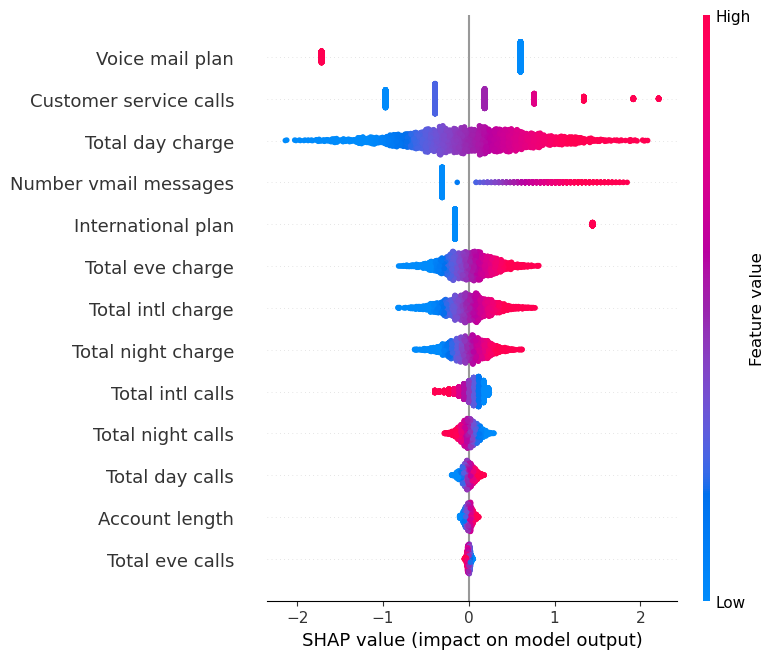

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
2          Voice mail plan    0.910082
12  Customer service calls    0.606406
5         Total day charge    0.564959
3    Number vmail messages    0.495350
1       International plan    0.282565
7         Total eve charge    0.218626
11       Total intl charge    0.208092
9       Total night charge    0.164883
10        Total intl calls    0.111339
8        Total night calls    0.077637


In [106]:
shap_analysis(svc_lin_smoteENN,x_train)

Voici l'interprétation des résultats après l'équilibrage des classes avec SMOTEENN, formatée en Markdown :

## Résumé des Résultats du Modèle SVC avec SMOTEENN

### Scores de Précision en Validation Croisée
- **Scores** : [0.7753, 0.7842, 0.7205, 0.7317, 0.7767]
- **Précision Moyenne** : 0.7577 (75.77%)

### Précision
- **Précision d'Entraînement** : 0.7641 (76.41%)
- **Précision de Test** : 0.7481 (74.81%)

### Rapport de Classification

| Classe | Précision | Rappel | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0      | 0.9446    | 0.7487 | 0.8353   | 569     |
| 1      | 0.3380    | 0.7449 | 0.4650   | 98      |
| **Accuracy**        | 0.7481    |        |          | 667     |
| **Macro avg**      | 0.6413    | 0.7468 | 0.6501   | 667     |
| **Weighted avg**   | 0.8554    | 0.7481 | 0.7809   | 667     |

### Matrice de Confusion

```
              Faux Négatif  Vrai Positif
Vrai Négatif           426           143
Faux Positif            25            73
```

### Aire sous la courbe (ROC AUC)

- **AUC (Area Under the Curve)** : 0.7468

---

## Interprétation des Résultats

1. **Précision d'Entraînement et de Test** :
   - La précision d'entraînement (76.41 %) est légèrement supérieure à celle du test (74.81 %), ce qui indique un bon ajustement général du modèle sans surajustement majeur.

2. **Rapport de Classification** :
   - **Classe 0** :
     - Précision : 94.46 % — Cela signifie que la plupart des prédictions pour cette classe sont correctes.
     - Rappel : 74.87 % — Le modèle identifie environ 75 % des vraies instances de la classe 0.
     - F1-Score : 83.53 % — Cela indique un bon équilibre entre précision et rappel pour cette classe.

   - **Classe 1** :
     - Précision : 33.80 % — Le modèle a une faible précision pour la classe 1, ce qui signifie qu'il y a beaucoup de faux positifs.
     - Rappel : 74.49 % — Le modèle détecte environ 74.49 % des vraies instances de la classe 1.
     - F1-Score : 46.50 % — Cela montre que le modèle a du mal à bien prédire cette classe.

3. **Matrice de Confusion** :
   - Le modèle a correctement identifié 426 instances de la classe 0 et 73 instances de la classe 1.
   - Cependant, il a mal classé 143 instances de la classe 0 comme appartenant à la classe 1, et 25 instances de la classe 1 comme appartenant à la classe 0.

4. **AUC-ROC** :
   - Une AUC de 0.7468 indique que le modèle a une capacité modérée à distinguer entre les classes, mais il y a encore place à amélioration.

---

## Suggestions d'Amélioration

1. **Ajustement des Hyperparamètres** :
   - Essayer différentes valeurs pour `C` et d'autres hyperparamètres pour voir si cela améliore les performances, en particulier pour la classe 1.

2. **Autres Méthodes d'Équilibrage** :
   - Explorer d'autres techniques d'équilibrage, comme le suréchantillonnage simple, le sous-échantillonnage ou des algorithmes avancés.

3. **Modèles Alternatifs** :
   - Tester d'autres modèles (comme les forêts aléatoires ou XGBoost) qui pourraient gérer mieux le déséquilibre des classes.

4. **Analyse des Caractéristiques** :
   - Analyser les caractéristiques pour identifier celles qui contribuent le plus à la classification et envisager des transformations ou des sélections de caractéristiques.

###  Support Vector Machine (rbf) <a id = " support-vector-machine-rbf"> </a>

In [107]:
#support vector classifier using non-linear hyper plane ("rbf")
svc_rbf  = SVC(C=10.0, kernel='rbf', gamma=0.1, probability=True, random_state=42)   

telecom_churn_prediction(svc_rbf, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.94049904 0.9193858  0.94807692 0.94038462 0.92692308]
Précision moyenne en validation croisée : 0.9350538904473644


Algorithme : SVC
Précision d'Entraînement : 0.9812
Précision de Test : 0.9017

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9243  0.9615    0.9425  546.0000
1                0.7470  0.5905    0.6596  105.0000
accuracy         0.9017  0.9017    0.9017    0.9017
macro avg        0.8356  0.7760    0.8011  651.0000
weighted avg     0.8957  0.9017    0.8969  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           525            21
Faux Positif            43            62

Aire sous la courbe (ROC AUC) : 0.7760




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.9811683320522675,
 'Précision de Test': 0.901689708141321,
 'Rapport de Classification': {'0': {'precision': 0.9242957746478874,
   'recall': 0.9615384615384616,
   'f1-score': 0.9425493716337523,
   'support': 546.0},
  '1': {'precision': 0.7469879518072289,
   'recall': 0.5904761904761905,
   'f1-score': 0.6595744680851063,
   'support': 105.0},
  'accuracy': 0.901689708141321,
  'macro avg': {'precision': 0.8356418632275582,
   'recall': 0.776007326007326,
   'f1-score': 0.8010619198594293,
   'support': 651.0},
  'weighted avg': {'precision': 0.8956977387058457,
   'recall': 0.901689708141321,
   'f1-score': 0.8969082581581643,
   'support': 651.0}},
 'Matrice de Confusion': array([[525,  21],
        [ 43,  62]], dtype=int64),
 'ROC AUC': 0.776007326007326}

###  Support Vector Machine (sigmoïde) <a id = " support-vector-machine-sigmoïde"> </a>

In [108]:
#support vector classifier using non-linear hyper plane ("sigmoid")
svc_sig  = SVC(C=10.0, kernel='sigmoid', gamma=0.1, probability=True, random_state=42)   

telecom_churn_prediction(svc_sig, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.81765835 0.78502879 0.76153846 0.80384615 0.77307692]
Précision moyenne en validation croisée : 0.7882297357153403


Algorithme : SVC
Précision d'Entraînement : 0.7694
Précision de Test : 0.8049

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8618  0.9139    0.8871  546.0000
1                0.3472  0.2381    0.2825  105.0000
accuracy         0.8049  0.8049    0.8049    0.8049
macro avg        0.6045  0.5760    0.5848  651.0000
weighted avg     0.7788  0.8049    0.7896  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           499            47
Faux Positif            80            25

Aire sous la courbe (ROC AUC) : 0.5760




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.7694081475787855,
 'Précision de Test': 0.804915514592934,
 'Rapport de Classification': {'0': {'precision': 0.8618307426597582,
   'recall': 0.9139194139194139,
   'f1-score': 0.8871111111111111,
   'support': 546.0},
  '1': {'precision': 0.3472222222222222,
   'recall': 0.23809523809523808,
   'f1-score': 0.2824858757062147,
   'support': 105.0},
  'accuracy': 0.804915514592934,
  'macro avg': {'precision': 0.6045264824409902,
   'recall': 0.576007326007326,
   'f1-score': 0.5847984934086629,
   'support': 651.0},
  'weighted avg': {'precision': 0.7788293683956395,
   'recall': 0.804915514592934,
   'f1-score': 0.7895909118522568,
   'support': 651.0}},
 'Matrice de Confusion': array([[499,  47],
        [ 80,  25]], dtype=int64),
 'ROC AUC': 0.5760073260073261}

###  Support Vector Machine (poly) <a id = " support-vector-machine-poly"> </a>

In [109]:
from sklearn.svm import SVC

# Support Vector Classifier avec noyau polynomial
svc_poly = SVC(C=10.0, kernel='poly', degree=3, gamma='scale', probability=True, random_state=42)

# Appel de la fonction de prédiction
telecom_churn_prediction(svc_poly, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.9193858  0.9193858  0.92115385 0.90192308 0.91538462]
Précision moyenne en validation croisée : 0.9154466263103499


Algorithme : SVC
Précision d'Entraînement : 0.9693
Précision de Test : 0.8940

Rapport de Classification :
              precision  recall  f1-score  support
0                0.9221  0.9542    0.9379  546.000
1                0.7093  0.5810    0.6387  105.000
accuracy         0.8940  0.8940    0.8940    0.894
macro avg        0.8157  0.7676    0.7883  651.000
weighted avg     0.8878  0.8940    0.8896  651.000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           521            25
Faux Positif            44            61

Aire sous la courbe (ROC AUC) : 0.7676




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.9692544196771714,
 'Précision de Test': 0.8940092165898618,
 'Rapport de Classification': {'0': {'precision': 0.9221238938053097,
   'recall': 0.9542124542124543,
   'f1-score': 0.9378937893789379,
   'support': 546.0},
  '1': {'precision': 0.7093023255813954,
   'recall': 0.580952380952381,
   'f1-score': 0.6387434554973822,
   'support': 105.0},
  'accuracy': 0.8940092165898618,
  'macro avg': {'precision': 0.8157131096933525,
   'recall': 0.7675824175824176,
   'f1-score': 0.78831862243816,
   'support': 651.0},
  'weighted avg': {'precision': 0.8877978344143558,
   'recall': 0.8940092165898618,
   'f1-score': 0.8896437355270741,
   'support': 651.0}},
 'Matrice de Confusion': array([[521,  25],
        [ 44,  61]], dtype=int64),
 'ROC AUC': 0.7675824175824177}

###  Neural Network <a id = " Neural Network"> </a>

In [110]:
from sklearn.neural_network import MLPClassifier

# Initialiser le classificateur avec les paramètres souhaités
nn = MLPClassifier(hidden_layer_sizes=(12,), activation='relu', solver='adam', max_iter=1000)

# Afficher les paramètres du modèle
print("Paramètres du modèle : ", nn.get_params())

# Utiliser le modèle entraîné pour prédire
telecom_churn_prediction(nn, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Paramètres du modèle :  {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (12,), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 1000, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Scores de précision en validation croisée : [0.93474088 0.92514395 0.94038462 0.925      0.91730769]
Précision moyenne en validation croisée : 0.9285154289089028


Algorithme : MLPClassifier
Précision d'Entraînement : 0.9412
Précision de Test : 0.8940

Rapport de Classification :
              precision  recall  f1-score  support
0                0.9148  0.9634    0.9384  546.000
1                0.7368  0.5333    0.6188  105.000
accuracy         0.8940  0.8940    0.8940    0.894
macro a

{'Algorithme': 'MLPClassifier',
 "Précision d'Entraînement": 0.9411990776325904,
 'Précision de Test': 0.8940092165898618,
 'Rapport de Classification': {'0': {'precision': 0.9147826086956522,
   'recall': 0.9633699633699634,
   'f1-score': 0.9384478144513827,
   'support': 546.0},
  '1': {'precision': 0.7368421052631579,
   'recall': 0.5333333333333333,
   'f1-score': 0.6187845303867403,
   'support': 105.0},
  'accuracy': 0.8940092165898618,
  'macro avg': {'precision': 0.825812356979405,
   'recall': 0.7483516483516484,
   'f1-score': 0.7786161724190614,
   'support': 651.0},
  'weighted avg': {'precision': 0.8860825274968629,
   'recall': 0.8940092165898618,
   'f1-score': 0.8868892202474081,
   'support': 651.0}},
 'Matrice de Confusion': array([[526,  20],
        [ 49,  56]], dtype=int64),
 'ROC AUC': 0.7483516483516482}

# Model performances over the training dataset 

In [111]:
models = {
    'Logistic (Baseline)': [logit, cols],
    'adaboost':[adaboost_model,cols],
    'XGBoost': [giboot, cols],
    'Decision Tree': [decision_tree, cols],
    'Desision Tree with smoteENN': [decision_tree_with_smoteenn,cols],
    'Random Forest': [rfc, cols],
    'SVM (Linear)': [svc_lin, cols],
    'SVM (Linear) with SmoteEnn':[svc_lin_smoteENN,cols],
    'SVM (RBF)': [svc_rbf, cols],
    'SVM (Sigmoid)': [svc_sig, cols],
    'SVM (Poly)': [svc_poly, cols],
    'Neural Network': [nn,cols]
}
svm_models ={
    'SVM (Linear)': [svc_lin, cols],
    'SVM (Linear) with SmoteEnn':[svc_lin_smoteENN,cols],
    'SVM (RBF)': [svc_rbf, cols],
    'SVM (Sigmoid)': [svc_sig, cols],
    'SVM (Poly)': [svc_poly, cols],

}

## Model performance metrics

In [112]:
#gives model report in dataframe
def model_report(model, training_x, testing_x, training_y, testing_y, name):
    model = model.fit(training_x, training_y)
    predictions = model.predict(testing_x)
    accuracy = accuracy_score(testing_y, predictions)
    recallscore = recall_score(testing_y, predictions)
    precision = precision_score(testing_y, predictions)
    roc_auc = roc_auc_score(testing_y, predictions)
    f1score = f1_score(testing_y, predictions) 
    
    
    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy"        : [accuracy],
                       "Recall"          : [recallscore],
                       "Precision"       : [precision],
                       "f1-score"        : [f1score],
                       "Roc_auc"         : [roc_auc],

                      })
    return df

In [113]:
# Initialiser un DataFrame vide pour les performances
model_performances_train = pd.DataFrame()

# Calculer les performances des modèles
for name in models:
    if name == 'Logistic (SMOTE)':
        performance = model_report(
            models[name][0], 
            x_smote[models[name][1]], x_test[models[name][1]], 
            y_smote, y_test, name
        )
    else:
        performance = model_report(
            models[name][0], 
            x_train[models[name][1]], 
            x_test[models[name][1]], 
            y_train, y_test, name
        )
    
    # Convertir `performance` en un DataFrame si nécessaire
    if isinstance(performance, np.ndarray):
        # Aplatir si nécessaire (ex. pour les arrays 3D ou 1D)
        if performance.ndim == 3:
            performance = performance.reshape(-1, performance.shape[-1])
        elif performance.ndim == 1:
            performance = performance.reshape(1, -1)
        
    # Ajouter au DataFrame
    performance_df = pd.DataFrame([performance]) if isinstance(performance, dict) else pd.DataFrame(performance)
    model_performances_train = pd.concat([model_performances_train, performance_df], ignore_index=True)

# Créer la table
table_train = ff.create_table(np.round(model_performances_train, 4))
py.iplot(table_train)


## Compare model metrics

In [114]:
def output_tracer(df, metric, color):
    tracer = go.Bar(y = df["Model"],
                    x = df[metric],
                    orientation = "h", name = metric ,
                    marker = dict(line = dict(width =.7), color = color)
                   )
    return tracer

def modelmetricsplot(df, title):
    layout = go.Layout(dict(title = title,
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric",
                                     zerolinewidth=1,
                                     ticklen=5, gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )
    trace1 = output_tracer(df, "Accuracy", "#6699FF")
    trace2 = output_tracer(df, 'Recall', "red")
    trace3 = output_tracer(df, 'Precision', "#33CC99")
    trace4 = output_tracer(df, 'f1-score', "lightgrey")
    trace5 = output_tracer(df, 'Roc_auc', "magenta")
  #  trace6 = output_tracer(df, 'Kappa_metric', "#FFCC99")

    data = [trace1, trace2, trace3, trace4, trace5]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [115]:
modelmetricsplot(df=model_performances_train, title="Model performances over the training dataset")

## Confusion matrices for models

In [116]:
def confmatplot(modeldict, df_train, df_test, target_train, target_test, figcolnumber):
    fig = plt.figure(figsize=(4*figcolnumber, 4*ceil(len(modeldict)/figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        plt.subplot(ceil(len(modeldict)/figcolnumber), figcolnumber, figpos+1)
        if name=='Logistic (SMOTE)':
            model = modeldict[name][0].fit(df_train[1][modeldict[name][1]], target_train[1])
            predictions = model.predict(df_test[modeldict[name][1]])
            conf_matrix = confusion_matrix(target_test, predictions)
            sns.heatmap(conf_matrix, annot=True, fmt = "d", square = True,
                        xticklabels=["Not churn", "Churn"],
                        yticklabels=["Not churn", "Churn"],
                        linewidths = 2, linecolor = "w", cmap = "Set1")
            plt.title(name, color = "b")
            plt.subplots_adjust(wspace = .3, hspace = .3)
        else:
            model = modeldict[name][0].fit(df_train[0][modeldict[name][1]], target_train[0])
            predictions = model.predict(df_test[modeldict[name][1]])
            conf_matrix = confusion_matrix(target_test, predictions)
            sns.heatmap(conf_matrix, annot=True, fmt = "d", square = True,
                        xticklabels=["Not churn", "Churn"],
                        yticklabels=["Not churn", "Churn"],
                        linewidths = 2, linecolor = "w", cmap = "Set1")
            plt.title(name, color = "b")
            plt.subplots_adjust(wspace = .3, hspace = .3)

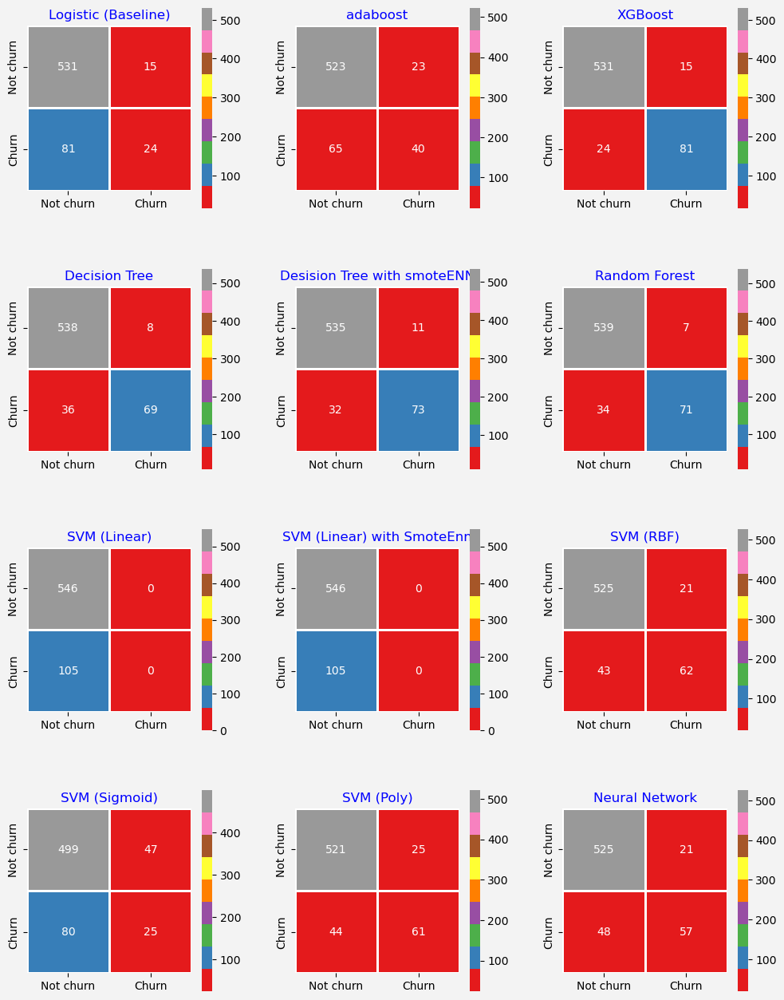

In [117]:
confmatplot(modeldict=models, df_train=[x_train], df_test=x_test, 
             target_train=[y_train], target_test=y_test, figcolnumber=3)

## ROC - Curves for models

In [118]:
def rocplot(modeldict, df_train, df_test, target_train, target_test, figcolnumber):
    fig = plt.figure(figsize=(4*figcolnumber, 4*ceil(len(modeldict)/figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        qx = plt.subplot(ceil(len(modeldict)/figcolnumber), figcolnumber, figpos+1)
        if name=='Logistic (SMOTE)':
            model = modeldict[name][0].fit(df_train[1][modeldict[name][1]], target_train[1])
            probabilities = model.predict_proba(df_test[modeldict[name][1]])
            predictions = model.predict(df_test[modeldict[name][1]])
                        
            fpr, tpr, thresholds = roc_curve(target_test, probabilities[:,1])
            plt.plot(fpr, tpr, linestyle = "dotted",
                     color = "royalblue", linewidth = 2,
                     label = "AUC = " + str(np.around(roc_auc_score(target_test, predictions), 3)))
            plt.plot([0,1],[0,1], linestyle = "dashed",
                     color = "orangered", linewidth = 1.5)
            plt.fill_between(fpr, tpr, alpha = .1)
            plt.fill_between([0, 1], [0, 1], color = "b")
            plt.legend(loc = "lower right",
                       prop = {"size" : 12})
            qx.set_facecolor("w")
            plt.grid(True, alpha = .15)
            plt.title(name, color = "b")
            plt.xticks(np.arange(0, 1, .3))
            plt.yticks(np.arange(0, 1, .3))
       
        else:
            model = modeldict[name][0].fit(df_train[0][modeldict[name][1]], target_train[0])
            probabilities = model.predict_proba(df_test[modeldict[name][1]])
            predictions = model.predict(df_test[modeldict[name][1]])
                        
            fpr, tpr, thresholds = roc_curve(target_test, probabilities[:,1])
            plt.plot(fpr, tpr, linestyle = "dotted",
                     color = "royalblue", linewidth = 2,
                     label = "AUC = " + str(np.around(roc_auc_score(target_test, predictions), 3)))
            plt.plot([0,1],[0,1], linestyle = "dashed",
                     color = "orangered", linewidth = 1.5)
            plt.fill_between(fpr, tpr, alpha = .1)
            plt.fill_between([0, 1], [0, 1], color = "b")
            plt.legend(loc = "lower right",
                       prop = {"size" : 12})
            qx.set_facecolor("w")
            plt.grid(True, alpha = .15)
            plt.title(name, color = "b")
            plt.xticks(np.arange(0, 1, .3))
            plt.yticks(np.arange(0, 1, .3))

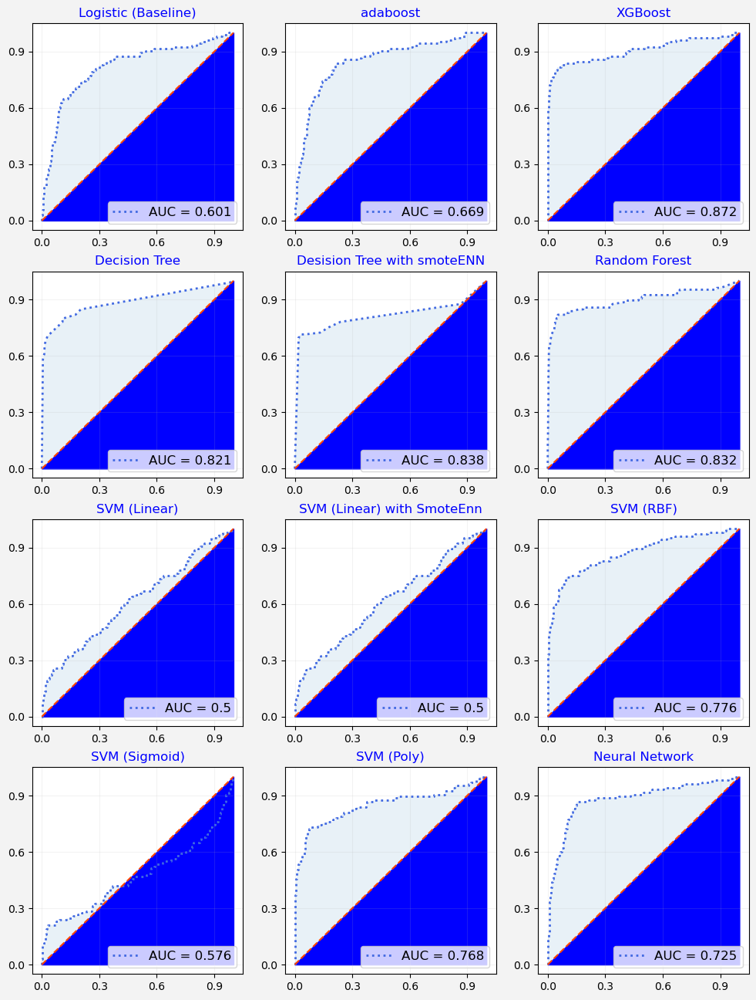

In [119]:
rocplot(modeldict=models, df_train=[x_train], df_test=x_test, 
             target_train=[y_train], target_test=y_test, figcolnumber=3)

## Compare ROC Model for All Models 

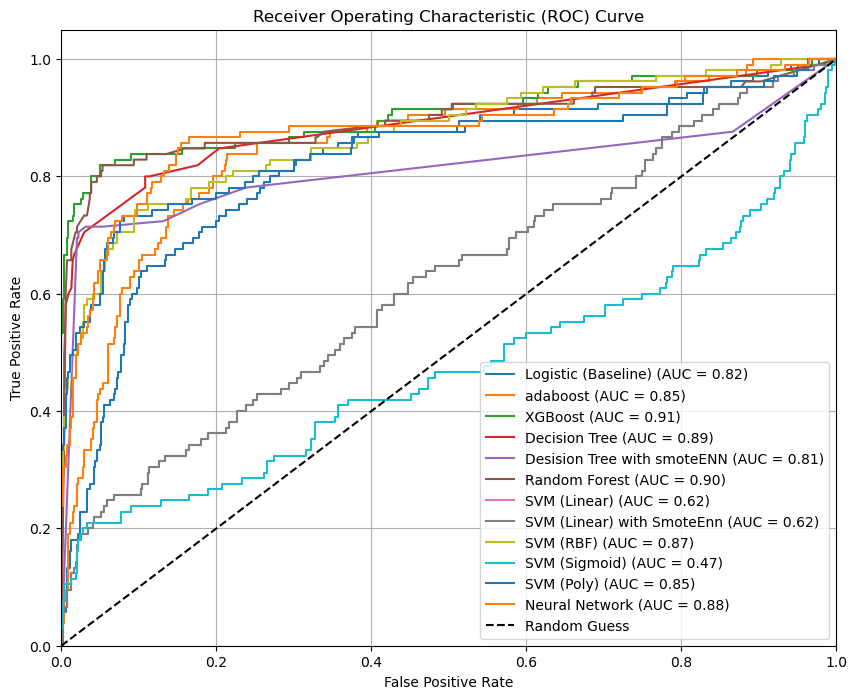

In [120]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def compare_models_roc(models, X_train, y_train, X_test, y_test):
    plt.figure(figsize=(10, 8))
    
    for model_name, (model, cols) in models.items():
        # Entraînement du modèle
        model.fit(x_train[cols], y_train)
        
        # Prédictions des probabilités
        y_prob = model.predict_proba(x_test[cols])[:, 1]  # Probabilités pour la classe positive
        
        # Calcul de la courbe ROC
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)  # Aire sous la courbe
        
        # Tracer la courbe ROC
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

    # Tracer la diagonale
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

# Utilisation de la fonction
compare_models_roc(models, x_train, y_train, x_test, y_test)

## Compare ROC Model for SVM Models 

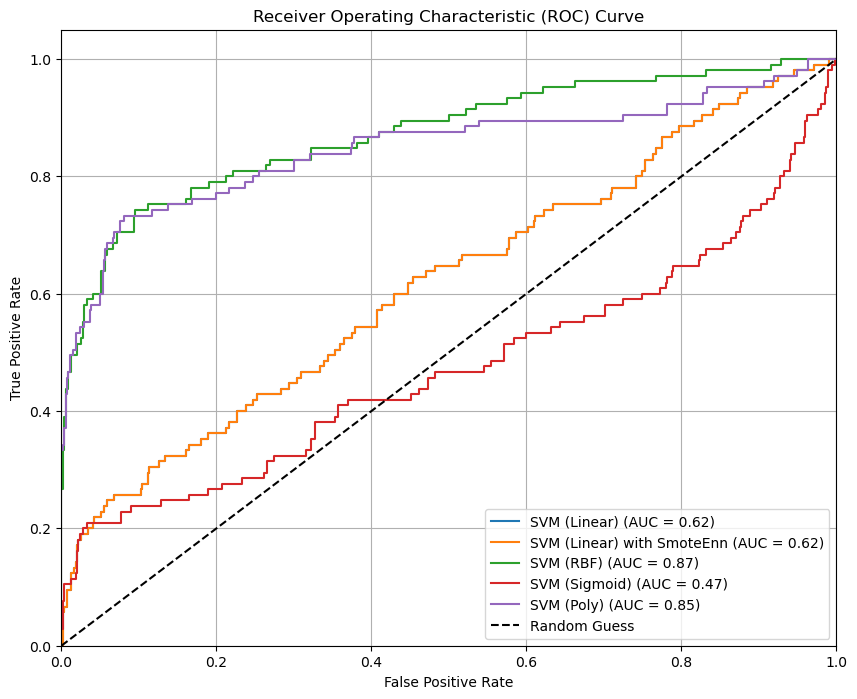

In [121]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def compare_models_roc(models, X_train, y_train, X_test, y_test):
    plt.figure(figsize=(10, 8))
    
    for model_name, (model, cols) in models.items():
        # Entraînement du modèle
        model.fit(x_train[cols], y_train)
        
        # Prédictions des probabilités
        y_prob = model.predict_proba(x_test[cols])[:, 1]  # Probabilités pour la classe positive
        
        # Calcul de la courbe ROC
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)  # Aire sous la courbe
        
        # Tracer la courbe ROC
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

    # Tracer la diagonale
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

# Utilisation de la fonction
compare_models_roc(svm_models, x_train, y_train, x_test, y_test)

## Model Building With GridSearchCV

In [122]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (classification_report, accuracy_score, confusion_matrix,
                             roc_auc_score, roc_curve)
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Fonction principale
def telecom_churn_prediction_with_cv(model, param_grid, training_x, testing_x, training_y, testing_y, cf='None', threshold_plot=False):
    # Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search.fit(training_x, training_y)

    # Meilleur modèle trouvé
    best_model = grid_search.best_estimator_
    predictions = best_model.predict(testing_x)
    probabilities = best_model.predict_proba(testing_x)

    print('Algorithm:', type(best_model).__name__)
    print("\nBest Parameters:", grid_search.best_params_)
    print("\nClassification report:\n", classification_report(testing_y, predictions))
    print("Accuracy Score:", accuracy_score(testing_y, predictions))

    # Matrice de confusion
    conf_matrix = confusion_matrix(testing_y, predictions)
    model_roc_auc = roc_auc_score(testing_y, probabilities[:, 1])
    print("Area under curve:", model_roc_auc, "\n")

    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])

    # Tracé de la matrice de confusion
    trace1 = go.Heatmap(z=conf_matrix,
                        x=["Not churn", "Churn"],
                        y=["Not churn", "Churn"],
                        showscale=False, colorscale="Picnic",
                        name="Confusion matrix")

    # Tracé de la courbe ROC
    trace2 = go.Scatter(x=fpr, y=tpr,
                        name="ROC: " + str(model_roc_auc),
                        line=dict(color=('rgb(22, 96, 167)'), width=2))
    trace3 = go.Scatter(x=[0, 1], y=[0, 1],
                        line=dict(color=('rgb(205, 12, 24)'), width=2,
                                  dash='dot'))

    # Initialiser fig
    fig = None

    if cf == 'features' and hasattr(best_model, 'feature_importances_'):
        coefficients = pd.DataFrame(best_model.feature_importances_)
        column_df = pd.DataFrame(training_x.columns.tolist())
        coef_sumry = pd.merge(coefficients, column_df, left_index=True, right_index=True, how="left")
        coef_sumry.columns = ["importance", "features"]
        coef_sumry = coef_sumry.sort_values(by="importance", ascending=False)

        # Tracé des importances des caractéristiques
        trace4 = go.Bar(x=coef_sumry["features"], y=coef_sumry["importance"], 
                        name="Feature Importances",
                        marker=dict(color=coef_sumry["importance"],
                                    colorscale="Picnic",
                                    line=dict(width=.6, color="black")))

        # Sous-graphes
        fig = make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion matrix',
                                            'Receiver Operating Characteristic',
                                            'Feature Importances'))
        fig.append_trace(trace1, 1, 1)
        fig.append_trace(trace2, 1, 2)
        fig.append_trace(trace3, 1, 2)
        fig.append_trace(trace4, 2, 1)
    elif cf == 'None':
        # Sous-graphes
        fig = make_subplots(rows=1, cols=2,
                            subplot_titles=('Confusion matrix',
                                            'Receiver Operating Characteristic'))
        fig.append_trace(trace1, 1, 1)
        fig.append_trace(trace2, 1, 2)
        fig.append_trace(trace3, 1, 2)

    # Mise à jour de la mise en page de fig
    if fig is not None:
        fig['layout'].update(showlegend=False, title="Model Performance",
                             autosize=False, height=900 if cf == 'features' else 500, width=800,
                             plot_bgcolor='rgba(240,240,240, 0.95)',
                             paper_bgcolor='rgba(240,240,240, 0.95)',
                             margin=dict(b=195))
        fig["layout"]["xaxis2"].update(dict(title="False Positive Rate"))
        fig["layout"]["yaxis2"].update(dict(title="True Positive Rate"))

        # Affichage corrigé avec fig.show()
        fig.show()

    # Retourner les résultats sous forme de dictionnaire
    return {
        'Algorithm': type(best_model).__name__,
        'Best Parameters': grid_search.best_params_,
        'Accuracy': accuracy_score(testing_y, predictions),
        'ROC AUC': model_roc_auc,
        'Classification Report': classification_report(testing_y, predictions, output_dict=True),
        'Confusion Matrix': conf_matrix
    }

# Exemple d'utilisation
# Définir les grilles d'hyperparamètres pour chaque modèle
param_grids = {
    'Logistic (Baseline)': {
        'C': [0.1, 1.0, 10.0],
        'solver': ['liblinear', 'lbfgs']
    },
    'XGBoost': {
        'n_estimators': [50, 100],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.2]
    },
    'Decision Tree': {
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    'Random Forest': {
        'n_estimators': [50, 100],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5]
    },
    'SVM (Linear)': {
        'C': [0.1, 1.0, 10.0]
    },
    'SVM (RBF)': {
        'C': [0.1, 1.0, 10.0],
        'gamma': [0.01, 0.1, 1]
    },
    'SVM (Sigmoid)': {
        'C': [0.1, 1.0, 10.0],
        'gamma': [0.01, 0.1, 1]
    },
    'SVM (Poly)': {
        'C': [0.1, 1.0, 10.0],
        'degree': [2, 3],
        'gamma': ['scale', 'auto']
    }
}

# Appel de la fonction pour chaque modèle
models = {
'Logistic (Baseline)': [logit, cols],
    'adaboost':[adaboost_model,cols],
    'XGBoost': [giboot, cols],
    'Decision Tree': [decision_tree, cols],
    'Desision Tree with smoteENN': [decision_tree_with_smoteenn,cols],
    'Random Forest': [rfc, cols],
    'SVM (Linear)': [svc_lin, cols],
    'SVM (Linear) with SmoteEnn':[svc_lin_smoteENN,cols],
    'SVM (RBF)': [svc_rbf, cols],
    'SVM (Sigmoid)': [svc_sig, cols],
    'SVM (Poly)': [svc_poly, cols],
    'Neural Network': [nn,cols]
}

def run_grid_search_on_all_models(models, param_grids, x_train, x_test, y_train, y_test):
    all_results = []

    for model_name, model in models.items():
        print(f"Running GridSearchCV for {model_name}...")
        try:
            results = telecom_churn_prediction_with_cv(model[0], param_grids[model_name], x_train[model[1]], x_test[model[1]], y_train, y_test, cf='None')
            results['Model Name'] = model_name
            all_results.append(results)
        except Exception as e:
            print(f"An error occurred for {model_name}: {e}")

    # Convertir les résultats en DataFrame
    results_df = pd.DataFrame(all_results)
    print("\nSummary of Results:")
    print(results_df)

    # Exporter les résultats si nécessaire
    results_df.to_csv("model_evaluation_results.csv", index=False)
    print("Results saved to model_evaluation_results.csv")

# Exemple d'appel de la fonction
run_grid_search_on_all_models(models, param_grids, x_train, x_test, y_train, y_test)

       

Running GridSearchCV for Logistic (Baseline)...
Algorithm: LogisticRegression

Best Parameters: {'C': 10.0, 'solver': 'lbfgs'}

Classification report:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92       546
           1       0.58      0.24      0.34       105

    accuracy                           0.85       651
   macro avg       0.72      0.60      0.63       651
weighted avg       0.82      0.85      0.82       651

Accuracy Score: 0.8494623655913979
Area under curve: 0.8208791208791208 



Running GridSearchCV for adaboost...
An error occurred for adaboost: 'adaboost'
Running GridSearchCV for XGBoost...
Algorithm: XGBClassifier

Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}

Classification report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.96       546
           1       0.84      0.77      0.81       105

    accuracy                           0.94       651
   macro avg       0.90      0.87      0.89       651
weighted avg       0.94      0.94      0.94       651

Accuracy Score: 0.9400921658986175
Area under curve: 0.9238792953078668 



Running GridSearchCV for Decision Tree...
Algorithm: DecisionTreeClassifier

Best Parameters: {'max_depth': 5, 'min_samples_split': 2}

Classification report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       546
           1       0.90      0.66      0.76       105

    accuracy                           0.93       651
   macro avg       0.92      0.82      0.86       651
weighted avg       0.93      0.93      0.93       651

Accuracy Score: 0.9324116743471582
Area under curve: 0.8870835513692658 



Running GridSearchCV for Desision Tree with smoteENN...
An error occurred for Desision Tree with smoteENN: 'Desision Tree with smoteENN'
Running GridSearchCV for Random Forest...
Algorithm: RandomForestClassifier

Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}

Classification report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       546
           1       0.91      0.67      0.77       105

    accuracy                           0.94       651
   macro avg       0.92      0.83      0.87       651
weighted avg       0.93      0.94      0.93       651

Accuracy Score: 0.9354838709677419
Area under curve: 0.9074481074481074 



Running GridSearchCV for SVM (Linear)...
Algorithm: SVC

Best Parameters: {'C': 1.0}

Classification report:
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       546
           1       0.00      0.00      0.00       105

    accuracy                           0.84       651
   macro avg       0.42      0.50      0.46       651
weighted avg       0.70      0.84      0.77       651

Accuracy Score: 0.8387096774193549
Area under curve: 0.6173905459619745 



Running GridSearchCV for SVM (Linear) with SmoteEnn...
An error occurred for SVM (Linear) with SmoteEnn: 'SVM (Linear) with SmoteEnn'
Running GridSearchCV for SVM (RBF)...
Algorithm: SVC

Best Parameters: {'C': 1.0, 'gamma': 0.1}

Classification report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95       546
           1       0.91      0.47      0.62       105

    accuracy                           0.91       651
   macro avg       0.91      0.73      0.78       651
weighted avg       0.91      0.91      0.89       651

Accuracy Score: 0.9062980030721967
Area under curve: 0.8815628815628815 



Running GridSearchCV for SVM (Sigmoid)...
Algorithm: SVC

Best Parameters: {'C': 10.0, 'gamma': 0.01}

Classification report:
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       546
           1       0.00      0.00      0.00       105

    accuracy                           0.84       651
   macro avg       0.42      0.50      0.46       651
weighted avg       0.70      0.84      0.77       651

Accuracy Score: 0.8387096774193549
Area under curve: 0.3593057735914879 



Running GridSearchCV for SVM (Poly)...
Algorithm: SVC

Best Parameters: {'C': 1.0, 'degree': 3, 'gamma': 'scale'}

Classification report:
               precision    recall  f1-score   support

           0       0.90      0.98      0.94       546
           1       0.80      0.45      0.57       105

    accuracy                           0.89       651
   macro avg       0.85      0.71      0.76       651
weighted avg       0.89      0.89      0.88       651

Accuracy Score: 0.8924731182795699
Area under curve: 0.8561834990406418 



Running GridSearchCV for Neural Network...
An error occurred for Neural Network: 'Neural Network'

Summary of Results:
                Algorithm                                    Best Parameters  \
0      LogisticRegression                     {'C': 10.0, 'solver': 'lbfgs'}   
1           XGBClassifier  {'learning_rate': 0.1, 'max_depth': 7, 'n_esti...   
2  DecisionTreeClassifier           {'max_depth': 5, 'min_samples_split': 2}   
3  RandomForestClassifier  {'max_depth': None, 'min_samples_split': 2, 'n...   
4                     SVC                                         {'C': 1.0}   
5                     SVC                           {'C': 1.0, 'gamma': 0.1}   
6                     SVC                         {'C': 10.0, 'gamma': 0.01}   
7                     SVC          {'C': 1.0, 'degree': 3, 'gamma': 'scale'}   

   Accuracy   ROC AUC                              Classification Report  \
0  0.849462  0.820879  {'0': {'precision': 0.868421052631579, 'recall...   
1  0.940

# Model performances over the principal test dataset  (Mech da5el)

## Model performance metrics

In [123]:
# Initialiser un DataFrame vide pour les performances sur le jeu de test
model_performances_test = pd.DataFrame()

# Calculer les performances des modèles sur le jeu de test
for name in models:
    if name == 'Logistic (SMOTE)':
        performance = model_report(
            models[name][0], 
            x_smote[models[name][1]], 
            test_data[models[name][1]], 
            y_smote, 
            test_data[target_col], 
            name
        )
    else:
        performance = model_report(
            models[name][0], 
            x_train[models[name][1]], 
            test_data[models[name][1]], 
            y_train, 
            test_data[target_col], 
            name
        )
    
    # Convertir `performance` en un DataFrame si nécessaire
    if isinstance(performance, np.ndarray):
        # Aplatir si nécessaire (ex. pour les arrays 3D ou 1D)
        if performance.ndim == 3:
            performance = performance.reshape(-1, performance.shape[-1])
        elif performance.ndim == 1:
            performance = performance.reshape(1, -1)
        
    # Ajouter au DataFrame
    performance_df = pd.DataFrame([performance]) if isinstance(performance, dict) else pd.DataFrame(performance)
    model_performances_test = pd.concat([model_performances_test, performance_df], ignore_index=True)

# Créer la table pour les performances sur le jeu de test
table_test = ff.create_table(np.round(model_performances_test, 4))
py.iplot(table_test)


## Compare model metrics

In [124]:
modelmetricsplot(df=model_performances_test, title="Model performances over the principal test dataset")

## Confusion matrices for models

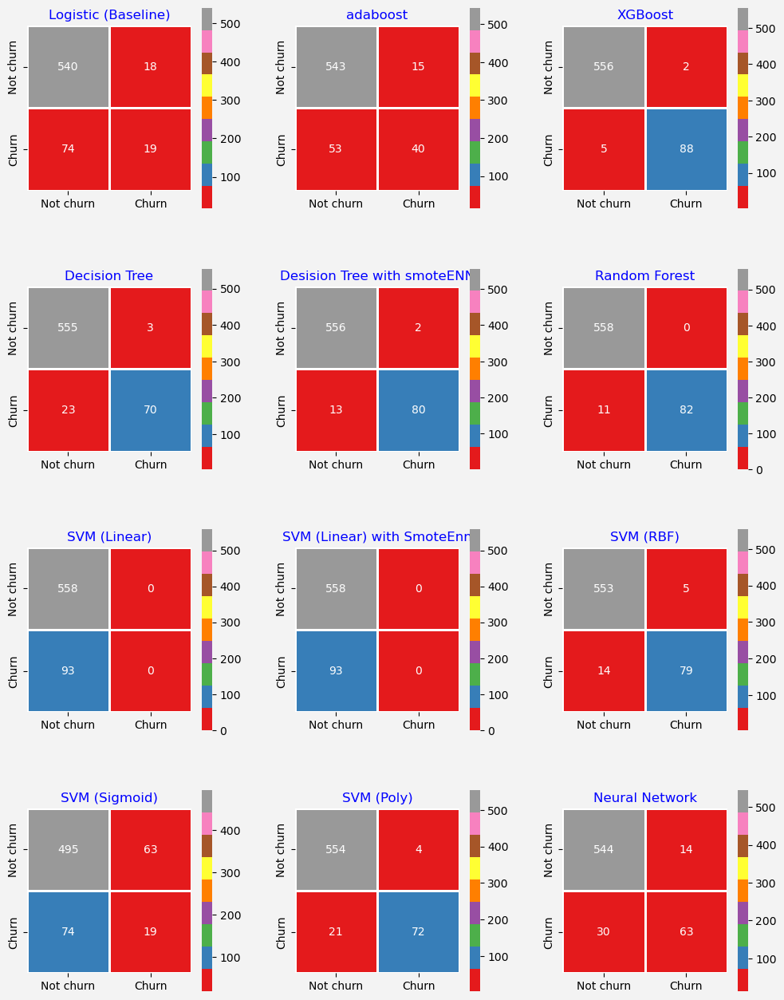

In [125]:
confmatplot(modeldict=models, df_train=[x_train], df_test=test_data[cols], 
             target_train=[y_train], target_test=test_data[target_col], figcolnumber=3)

## ROC - Curves for models

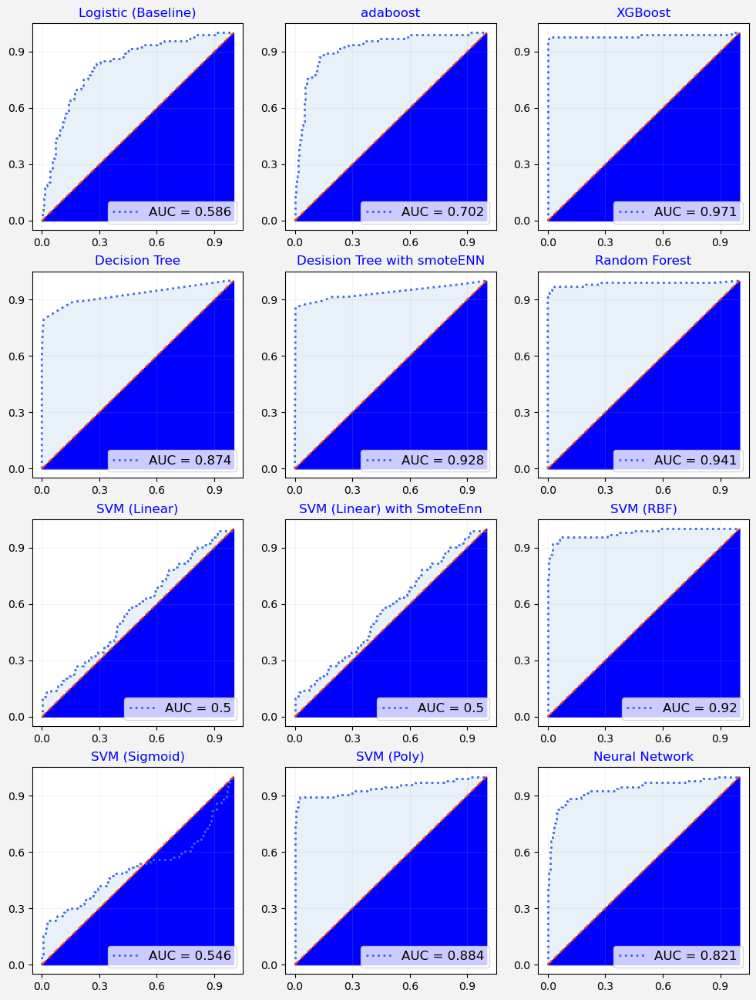

In [126]:
rocplot(modeldict=models, df_train=[x_train], df_test=test_data[cols], 
             target_train=[y_train], target_test=test_data[target_col], figcolnumber=3)

By evaluating the performance metrics of all the developed models over the training and test datasets, we have decided to deploy the project with the Random Forest classifier model.

In [127]:
#Save the model
import pickle
filename = 'savedmodel.sav'
pickle.dump(rfc, open(filename, 'wb'))

In [128]:
#load the model
load_model=pickle.load(open(filename,'rb'))